In [1]:
#!pip uninstall tensorflow

In [2]:
#!pip install tensorflow-gpu==2.0.0

In [1]:
from tensorflow.compat.v1 import enable_eager_execution
import tensorflow as tf
import numpy as np
import os
import tensorflow_probability as tfp
from tensorflow.keras import layers
import time
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patches as mpatches
from sklearn.metrics import roc_auc_score
import random
from sklearn.metrics import confusion_matrix
print(tf.__version__)

2.0.0


In [2]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)
config = tf.compat.v1.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.95
tf.compat.v1.Session(config=config)

## 參數設定

In [3]:
flatten_size = 32 * 32 * 3
img_size = 32
img_channel = 3
regular = 1e-5

z_dim = 128
h_dim = [32, 64, 128]
objective = 'deep-SVDD'     #'  'soft-boundary'


## 匯入資料（MNIST）

In [4]:
names = np.array(['airplane',
'automobile',
'bird',
'cat',
'deer',
'dog',
'frog',
'horse',
'ship',
'truck'])

In [5]:
def load_data(label_num, batch_size = 200, outlier_nu = 0.1):
    # 0: normal, 1: outlier
    
    x_train = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    y_train = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    x_train = np.transpose(x_train, (0, 2, 3, 1))
    
    
    for i in np.arange(2):
        data = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(label_num,'test',label_num, i))
        label = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(label_num,'test',label_num, i))
        
        data = np.transpose(data, (0, 2, 3, 1))
        try:
            x_test = np.vstack((x_test, data))
            y_test = np.hstack((y_test, label))
        except:
            x_test = data
            y_test = label
    ## outlier data
    for index in np.delete(np.arange(10), label_num):
        
        out_data = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(index,'train',index, 0))
        out_label = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(index,'train',index, 0))

        out_data = np.transpose(out_data, (0, 2, 3, 1))
        try:
            out_datas_ = np.vstack((out_datas_, out_data))
            out_labels_ = np.hstack((out_labels_, out_label))
        except:
            out_datas_ = out_data
            out_labels_ = out_label
        
    ### 製造outlier
    random.seed (1120)
    normal_n = len(x_train)
    outlier_n = len(out_datas_) ####
    indices = np.random.choice(outlier_n, int(normal_n * outlier_nu), replace=False)
    x_train = np.vstack( (x_train[y_train == label_num], out_datas_[indices]))
    y_train = np.hstack( (y_train[y_train == label_num], out_labels_[indices]))
    
    
    # Flatten the dataset
    x_train = x_train.reshape((-1, flatten_size))
    x_test = x_test.reshape((-1, flatten_size))

    train_buf = x_train.shape[0]
    train_dataset = tf.data.Dataset.from_tensor_slices(x_train)
    train_dataset = train_dataset.shuffle(buffer_size=train_buf)
    train_dataset = train_dataset.batch(batch_size)
    
    return train_dataset, x_train, x_test, y_train, y_test

In [6]:
def load_notransform_data(label_num, batch_size = 200, outlier_nu = 0.1):
    # 0: normal, 1: outlier
    print("Loading ",names[label_num]," data...")
    x_train = np.load('D:/7107018014/notransform_cifar/{}/{}_data{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    y_train = np.load('D:/7107018014/notransform_cifar/{}/{}_label{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    x_train = np.transpose(x_train, (0, 2, 3, 1))
    for i in np.arange(2):
        data = np.load('D:/7107018014/notransform_cifar/{}/{}_data{}_batch{}.npy'.format(label_num,'test',label_num, i))
        label = np.load('D:/7107018014/notransform_cifar/{}/{}_label{}_batch{}.npy'.format(label_num,'test',label_num, i))
        data = np.transpose(data, (0, 2, 3, 1))
        try:
            x_test = np.vstack((x_test, data))
            y_test = np.hstack((y_test, label))
        except:
            x_test = data
            y_test = label
    ## outlier data
    for index in np.delete(np.arange(10), label_num):
        out_data = np.load('D:/7107018014/notransform_cifar/{}/{}_data{}_batch{}.npy'.format(index,'train',index, 0))
        out_label = np.load('D:/7107018014/notransform_cifar/{}/{}_label{}_batch{}.npy'.format(index,'train',index, 0))
        out_data = np.transpose(out_data, (0, 2, 3, 1))
        try:
            out_datas_ = np.vstack((out_datas_, out_data))
            out_labels_ = np.hstack((out_labels_, out_label))
        except:
            out_datas_ = out_data
            out_labels_ = out_label
    ### 製造outlier
    random.seed (1120)
    normal_n = len(x_train)
    outlier_n = len(out_datas_) ####
    indices = np.random.choice(outlier_n, int(normal_n * outlier_nu), replace=False)
    x_train = np.vstack( (x_train[y_train == label_num], out_datas_[indices]))
    y_train = np.hstack( (y_train[y_train == label_num], out_labels_[indices]))
    # Flatten the dataset
    x_train = x_train.reshape((-1, flatten_size))
    x_test = x_test.reshape((-1, flatten_size))
    
    return train_dataset, x_train, x_test, y_train, y_test

## 建構模型

## Prtrain

In [7]:
class Autoencoder():
    
    def __init__(self, label_num, img_size = img_size, z_dim = z_dim, h_dim = h_dim, img_channel = img_channel):
        
        self.label_num = label_num
        self.flatten_size = img_size * img_size * img_channel
        self.z_dim = z_dim
        self.h_dim = h_dim
        self.encoder = self.make_encoder()
        self.decoder = self.make_decoder()
        self.ae_optimizer = tf.keras.optimizers.Adam(lr = 0.001, epsilon = 1e-6)
        

    def make_encoder(self):

        inputs = tf.keras.Input(shape=(self.flatten_size,), name='inputs')
        x = tf.reshape(inputs, shape = (-1, 32, 32, 3))
        x = tf.keras.layers.Conv2D(self.h_dim[0], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)

        x = tf.keras.layers.Conv2D(self.h_dim[1], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)
        
        x = tf.keras.layers.Conv2D(self.h_dim[2], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)

        x = tf.keras.layers.Flatten(name = 'Flatten')(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.Dense(self.z_dim, use_bias = False, name = 'dense')(x)
        
        
        model = tf.keras.Model(inputs=inputs, outputs=x)

        return model    
   
    def make_decoder(self):

        inputs = tf.keras.Input(shape=(self.z_dim,), name='inputs')
        x = tf.reshape(inputs, shape = (-1, 4, 4, 8))
        x = tf.keras.layers.LeakyReLU()(x)
        #x = tf.keras.layers.UpSampling2D((2, 2))(x)    

        x = tf.keras.layers.Conv2DTranspose(self.h_dim[2], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x)   

        x = tf.keras.layers.Conv2DTranspose(self.h_dim[1], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x)
        
        x = tf.keras.layers.Conv2DTranspose(self.h_dim[0], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x) 
        
        x = tf.keras.layers.Conv2DTranspose(3, (5, 5), activation='sigmoid', padding='same',  use_bias = False)(x)
        #x = tf.reshape(x, shape = (-1, self.flatten_size))
        x = tf.keras.layers.Flatten(name = 'Flatten')(x)
        model = tf.keras.Model(inputs=inputs, outputs=x)

        return model   
    
    @tf.function
    def train_ae_model(self, batch_x):
        with tf.GradientTape() as ae_tape:
            ae_output = self.decoder(self.encoder(batch_x, training=True), training=True)
            loss = tf.reduce_mean((ae_output - batch_x) ** 2)

        grads = ae_tape.gradient(loss, self.encoder.trainable_variables + self.decoder.trainable_variables)
        self.ae_optimizer.apply_gradients(zip(grads, self.encoder.trainable_variables + self.decoder.trainable_variables))

        return loss
    
    def train_ae( self, n_ae_epochs, train_dataset, ae_lr_milestone=250 ):
        #loss_list = []
        for epoch in range(n_ae_epochs):
            epoch_ae_loss_avg = tf.metrics.Mean()
            
            if (epoch+1) % ae_lr_milestone == 0:
                self.ae_optimizer.lr = 0.1 * self.ae_optimizer.lr

            for batch, (batch_x) in enumerate(train_dataset):

                ae_loss = self.train_ae_model(batch_x)
                #epoch_ae_loss_avg(ae_loss)
            #loss_list.append(epoch_ae_loss_avg.result())
        
        self.encoder.save_weights('E:\咪聽\SVDD\deep SVDD\checkpoints\oneclassAE_label_{}' .format(self.label_num))
        #print('LOSS: {:.4f} '.format(epoch_ae_loss_avg.result()))
        #plt.title('label = {}'.format(self.label_num))
        #plt.plot(loss_list)
        #plt.show()
        

In [8]:
ae = Autoencoder('airplane')

In [9]:
encoder = ae.encoder
encoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 3072)]            0         
_________________________________________________________________
tf_op_layer_Reshape (TensorF [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 32, 32, 32)        2400      
_________________________________________________________________
batch_normalization (BatchNo (None, 32, 32, 32)        128       
_________________________________________________________________
elu (ELU)                    (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 64)        51200 

In [10]:
decoder = ae.decoder
decoder.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 128)]             0         
_________________________________________________________________
tf_op_layer_Reshape_1 (Tenso [(None, 4, 4, 8)]         0         
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 4, 4, 8)           0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 4, 4, 128)         25600     
_________________________________________________________________
batch_normalization_4 (Batch (None, 4, 4, 128)         512       
_________________________________________________________________
elu_3 (ELU)                  (None, 4, 4, 128)         0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 8, 8, 128)         0   

## result 

In [11]:
def threshold_img(data, dists):
    dict_score = {}
    for i in range(len(dists)):
        dict_score[float(dists[i])] = i
    sort_score = [(k, dict_score[k]) for k in sorted(dict_score.keys())]
    
    n_digits = 10  # how many digits we will display
    fig = plt.figure(figsize=(20, 4))
    for i in range(1, n_digits):
        # display normal
        ax = plt.subplot(2, n_digits, i + 1)
        plt.imshow(data[sort_score[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display anomaly
        ax = plt.subplot(2, n_digits, i + 1 + n_digits)
        plt.imshow(data[sort_score[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()


In [12]:
def threshold_uncertain_img(data, dists, r):
    dist2radius = (dists - r**2)
    normal = dist2radius[dist2radius<0]
    anomaly = dist2radius[dist2radius>0]
    normal_score = {}
    anomaly_score = {}
    for i in range(len(normal)):
        normal_score[float(normal[i])] = i
    for i in range(len(anomaly)):
        anomaly_score[float(anomaly[i])] = i
    normalsort_score = [(k, normal_score[k]) for k in sorted(normal_score.keys())]
    anomalysort_score = [(k, anomaly_score[k]) for k in sorted(anomaly_score.keys())]
    
    n_digits = min([len(normal),len(anomaly),10])#20  # how many digits we will display
    fig = plt.figure(figsize=(20, 4))
    #print('normal:', len(normal), 'anomaly', len(anomaly))
    for i in range(1, n_digits):
        # display normal
        
        ax = plt.subplot(2, n_digits, i + 1)
        plt.imshow(data[normalsort_score[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display anomaly
        ax = plt.subplot(2, n_digits, i + 1 + n_digits)
        plt.imshow(data[anomalysort_score[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

In [13]:
def distance_plot(label_num, dist, data, radius_end, objective, name, train = True, label = None,  nu = 0.1):
    treshold = radius_end ** 2
    if train:
        plt.title(str(objective) + 'label = {} train data'.format(name))
        if objective == 'soft-boundary':
            treshold = 0
            plt.hist(dist[label == label_num], rwidth=0.3, color='b' ,bins = 100,label = 'normal')
            if sum(label!=label_num):
                plt.axvline(treshold,  color='g')
                plt.hist(dist[label != label_num], rwidth = 0.3, color = 'r',label = 'anomaly', bins = 100)
                
                plt.legend()
        else:
            plt.hist(dist[label == label_num], rwidth=0.3, color='b' ,bins = 100,label = 'normal')
            if sum(label!=label_num):
                plt.axvline(treshold,  color='g')
                plt.hist(dist[label != label_num], rwidth = 0.3, color = 'r',label = 'anomaly', bins = 100)
                
                plt.legend()
        plt.show()       
    
    else:
        plt.title(str(objective) + 'label = {} test data'.format(name))
        if objective == 'soft-boundary':
            plt.axvline(treshold,  color='g')
            plt.hist(dist[label!=label_num], rwidth=0.3, color='r' ,bins = 100,label = 'anomaly')
            plt.hist(dist[label==label_num], rwidth = 0.3, color = 'b',label = 'normal', bins = 100)
            
            plt.legend()

        else:
            
            plt.axvline(float(treshold), color='g')
            plt.hist(dist[label!=label_num], rwidth=0.3, color='r' ,bins = 100,label = 'anomaly')
            plt.hist(dist[label==label_num], rwidth=0.3, color='b' ,bins = 100,label = 'normal')
            
            plt.legend()

        plt.legend()
        plt.show()
    


In [14]:
def false_img(data, labels_,  dists, r, label_num):
    dist2radius = (dists - r**2)
    dist_n = dist2radius[labels_ != label_num]
    dist_p = dist2radius[labels_ == label_num]
    data_n = data[labels_ != label_num]
    data_p = data[labels_ == label_num]
    fn = dist_n[dist_n<0]
    fp = dist_p[dist_p>0]
    fn_score = {}
    fp_score = {}
    for i in range(len(fn)):
        fn_score[float(fn[i])] = i
    for i in range(len(fp)):
        fp_score[float(fp[i])] = i
        
    fn_score_sort = [(k, fn_score[k]) for k in sorted(fn_score.keys())]
    fp_score_sort = [(k, fp_score[k]) for k in sorted(fp_score.keys())]
    
    if sum(labels_ != label_num) > 0:
    
        n_digits = min([len(fn),len(fp),10])#20  # how many digits we will display
        fig = plt.figure(figsize=(20, 4))
        #print('normal:', len(normal), 'anomaly', len(anomaly))
        for i in range(1, n_digits):
            # display fn
            ax = plt.subplot(2, n_digits, i + 1)
            plt.imshow(data_n[fn_score_sort[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # display fp
            ax = plt.subplot(2, n_digits, i + 1 + n_digits)
            plt.imshow(data_p[fp_score_sort[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()
        
    else:
        n_digits = min([len(fp),10])
        fig = plt.figure(figsize=(20, 4))
        #print('normal:', len(normal), 'anomaly', len(anomaly))
        for i in range(1, n_digits):

            # display fp
            ax = plt.subplot(2, n_digits, i + 1 + n_digits)
            plt.imshow(data_p[fp_score_sort[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()

In [15]:
class train_SVDD():
    
    def __init__(self, label_num , objective , encoder, train_dataset, nu = 0.1, z_dim = z_dim):
        names = np.array(['airplane',
        'automobile',
        'bird',
        'cat',
        'deer',
        'dog',
        'frog',
        'horse',
        'ship',
        'truck'])
        
        self.label_num = label_num
        self.label_name = names[label_num]
        self.objective = objective
        self.nu = nu
        self.z_dim = z_dim
        self.encoder = encoder
        self.label_num = label_num
        self.optimizer = tf.keras.optimizers.Adam(lr = 0.0001, epsilon = 1e-6)
        self.train_dataset = train_dataset
        self.center = self.init_center_c( eps = 0.1)
        
        
    def init_center_c(self, eps = 0.1):
        
        self.encoder.load_weights('E:\咪聽\SVDD\deep SVDD\checkpoints\oneclassAE_label_{}' .format(self.label_num))
        positive = tf.fill([self.z_dim], eps)
        negative = tf.fill([self.z_dim], -eps)
        c = tf.zeros(shape = [self.z_dim], dtype = tf.float32, name = 'c')
        
        for batch, (batch_x) in enumerate(self.train_dataset):
            output = self.encoder(batch_x, training=False)            
            if batch ==0:
                modeloutput = output
            else:
                modeloutput = tf.concat([modeloutput, output], 0)
        
        c = tf.reduce_mean(modeloutput, axis = 0, name = 'outputs')
        #c = tf.reduce_mean( self.encoder(data, training = False), axis = 0, name = 'outputs') 

        c = tf.where(tf.logical_and(tf.less(c, 0), tf.greater(c, -eps)), negative, c)
        c = tf.where(tf.logical_and(tf.greater(c, 0), tf.less(c, eps)), positive, c)
        
        return c
        
    def get_radius(self,dist):
        """Optimally solve for radius R via the (1-nu)-quantile of distances."""
        return tfp.stats.percentile(tf.sqrt(dist), (1-self.nu)*100)


    def loss(self, objective, dist, R = None):

        if objective == 'soft-boundary':
            scores = dist - R**2
            avg_loss = R**2 + (1/nu) * tf.reduce_mean(tf.maximum(tf.zeros_like(scores), scores))

        if objective=='deep-SVDD':
            avg_loss = tf.reduce_mean(dist)
        return avg_loss

    @tf.function
    def train_model(self, batch_x, center, objective, R = None):
        with tf.GradientTape() as tape:
            output = self.encoder(batch_x, training=True)
            dist = tf.reduce_sum(tf.math.square(output - self.center) , axis=1)
            output_loss = self.loss(self.objective, dist, R)

        grads = tape.gradient(output_loss, self.encoder.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.encoder.trainable_variables))

        return output_loss, dist
    def train(self, x_train, n_epochs = 150, warm_up_n_epochs = 10, lr_milestone = 50):
        
        if self.objective == 'soft-boundary':
            self.R = tf.zeros(shape = [1], dtype = tf.float32, name = 'R')
        else:
            self.R = None
        loss_list = []
        
        for epoch in range(n_epochs):
            epoch_loss_avg = tf.metrics.Mean()
            
            if (epoch+1) % lr_milestone == 0:
                self.optimizer.lr = 0.1 * self.optimizer.lr
            
            for batch, (batch_x) in enumerate(self.train_dataset):
                loss_, dist = self.train_model(batch_x, self.center, self.objective, self.R )
                epoch_loss_avg(loss_)
                if (self.objective == 'soft-boundary') and (epoch >= warm_up_n_epochs):
                    self.R = self.get_radius(dist)
            loss_list.append(loss_)
        self.encoder.save_weights('E:\咪聽\SVDD\deep SVDD\checkpoints\{}_label_{}_outlier_{}' .format
                                  (self.objective, self.label_name, self.nu))
        plt.title('label = {}'.format(self.label_name))
        plt.plot(loss_list)
        plt.show()
        
    def distance(self, data, label, load_model = True):
        if load_model:
            self.encoder.load_weights('E:\咪聽\SVDD\deep SVDD\checkpoints\{}_label_{}_outlier_{}' .format
                                  (self.objective, self.label_name, self.nu))
        batch_size = 200
        train_dataset = tf.data.Dataset.from_tensor_slices((data, label))
        train_dataset = train_dataset.batch(batch_size)

        for batch, (batch_x,batch_y) in enumerate(train_dataset):
            output = self.encoder(batch_x, training=False)
            dist = tf.reduce_sum(tf.math.square(output - self.center) , axis=1) ## dist**2
            
            if batch ==0:
                modeloutput = dist
                labels_ = batch_y
                datas = batch_x
            else:
                modeloutput = tf.concat([modeloutput, dist], 0)
                labels_ = tf.concat([labels_, batch_y], 0)
                datas = tf.concat([datas, batch_x], 0)
                
        labels_ = labels_.numpy()
        datas = datas.numpy()
        
        return modeloutput, labels_, datas
    
    def decide_treshold(self, x_train, y_train):
        dis = 0
        if self.objective == 'soft-boundary':
            radius_end = self.R.numpy()
        else:
            dis, labels_, datas = self.distance(x_train, x_train)
            radius_end = self.get_radius(dis).numpy()
            
        return float(radius_end), dis
    
    def train_result(self, x_train, y_train, show_img = False, load_model = True):
        
        radius_end, dis = self.decide_treshold(x_train, y_train)
        
        if show_img:
            #if self.objective == 'soft-boundary':
            dist, labels_, datas = self.distance(x_train, y_train)
            dist = dis.numpy()
            
            distance_plot(self.label_num, dist, datas, radius_end, self.objective, name =  self.label_name, 
                          train = True, label = labels_, nu = self.nu )
            print(' train label = {} uncertain_img'.format(self.label_name))
            threshold_uncertain_img(datas, dist, radius_end)
            print('train label = {} distance oder'.format(self.label_name))
            threshold_img(datas, dist)
            print('train label = {} false_img'.format(self.label_name))
            false_img(datas, labels_,  dist, radius_end, self.label_num)
            
        return radius_end
    
    def result(self, dist, y_test, radius_end, show_img = False):
        
        y_true = y_test == self.label_num
        scores = dist - radius_end ** 2
        y_prob = 1/dist
        auc = roc_auc_score(y_true, y_prob)
        confusionmatrix = confusion_matrix(y_true, scores < 0)
        if show_img:
            print('AUC:', auc)
            print('confusion_matrix:')
            print(confusionmatrix)

        return auc, confusionmatrix 
    
    def test(self, x_test, y_test, radius_end, show_img = False, load_model = True):
        
        dist, labels_, datas = self.distance(x_test, y_test, load_model = load_model)
        dist = dist.numpy()
        test_auc, confusionmatrix = self.result(dist, labels_, radius_end, show_img = show_img)
        if show_img:
            distance_plot(self.label_num, dist, datas, radius_end, self.objective, name =  self.label_name,
                          train = False, label = labels_, nu = self.nu )
            print('test label = {} uncertain_img'.format(self.label_name))
            threshold_uncertain_img(datas, dist, radius_end)
            print('test label = {} distance oder'.format(self.label_name))
            threshold_img(datas, dist)
            print('test label = {} false_img'.format(self.label_name))
            false_img(datas, labels_,  dist, radius_end, self.label_num)
            
        return test_auc, confusionmatrix 
    

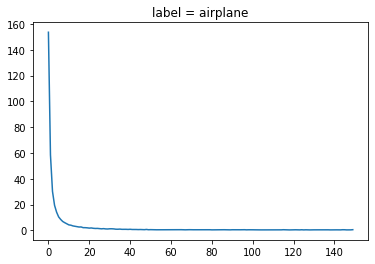

auc =  0.5893411111111111


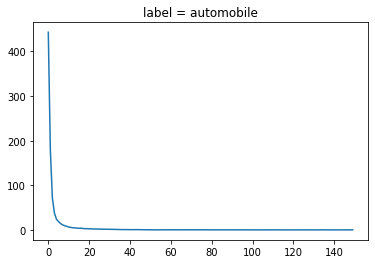

auc =  0.641882


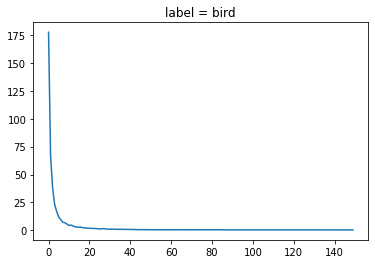

auc =  0.46856444444444445


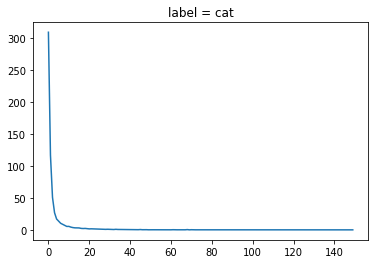

auc =  0.6182415


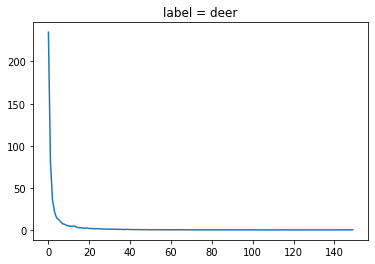

auc =  0.5139673333333333


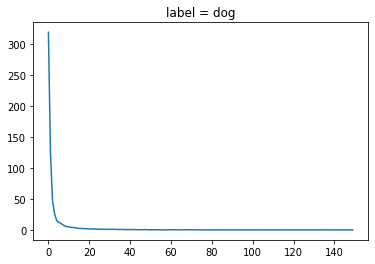

auc =  0.6538525555555555


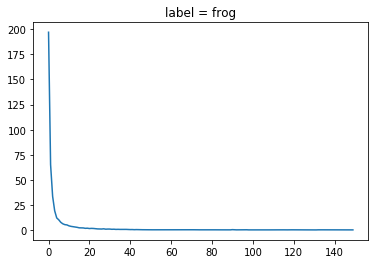

auc =  0.6962046666666667


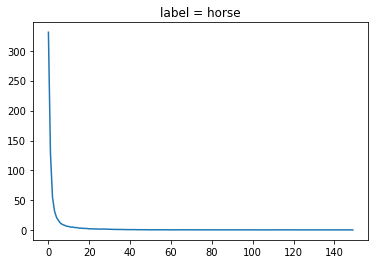

auc =  0.7360450555555558


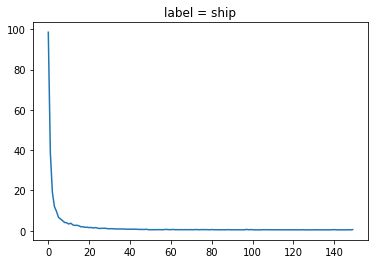

auc =  0.7858574444444444


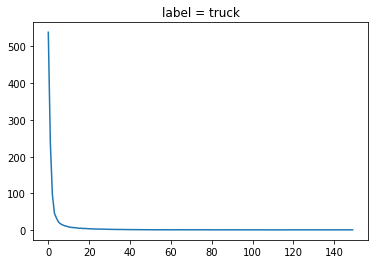

auc =  0.763755111111111


In [19]:
objective = 'deep-SVDD'
i = 0
nu = 0.1
outlier_nu = 0

label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []


for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    SVDD.train(x_train, n_epochs = 150)
    radius_end =SVDD.train_result(x_train, y_train)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end)
    train_time = time.time() - pre_time
    print('auc = ', test_auc)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)
    i += 1

In [20]:
#nu = 0.1, outlier_nu = 0
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])

label =  airplane
auc =  0.5893411111111111
time =  228.41456532478333
label =  automobile
auc =  0.641882
time =  235.15541052818298
label =  bird
auc =  0.46856444444444445
time =  248.4811294078827
label =  cat
auc =  0.6182415
time =  244.78419017791748
label =  deer
auc =  0.5139673333333333
time =  250.9262752532959
label =  dog
auc =  0.6538525555555555
time =  246.1843500137329
label =  frog
auc =  0.6962046666666667
time =  246.85510730743408
label =  horse
auc =  0.7360450555555558
time =  241.76098728179932
label =  ship
auc =  0.7858574444444444
time =  237.9568259716034
label =  truck
auc =  0.763755111111111
time =  226.9856629371643


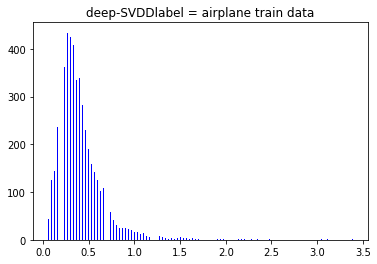

 train label = airplane uncertain_img


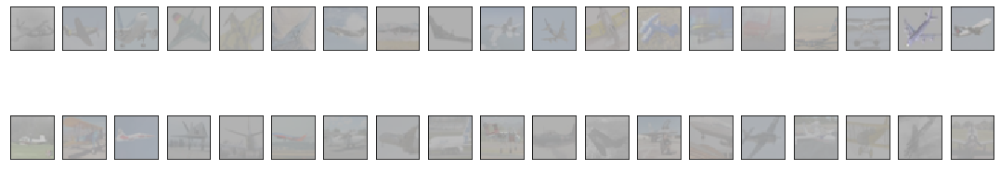

train label = airplane distance oder


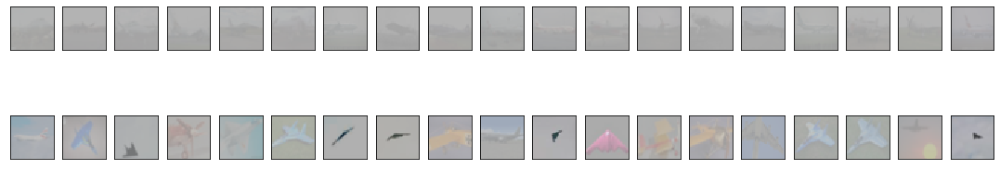

AUC: 0.5893411666666666
confusion_matrix:
[[1369 7631]
 [ 128  872]]


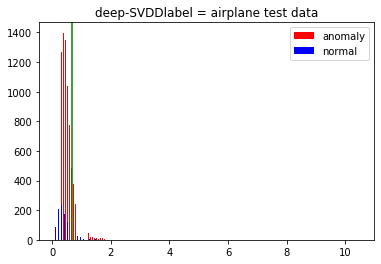

test label = airplane uncertain_img


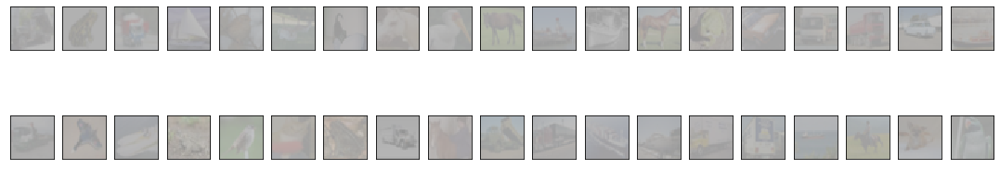

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


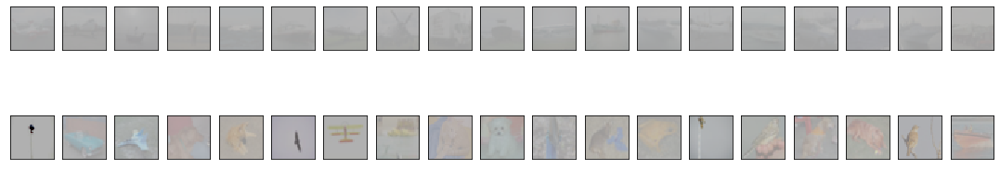

test label = airplane false_img


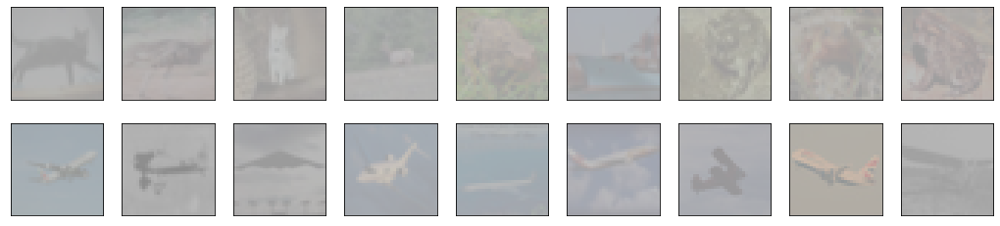

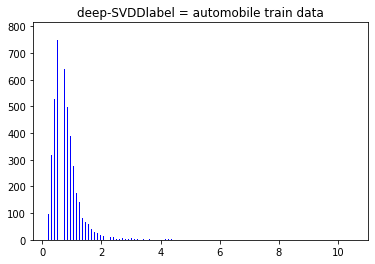

 train label = automobile uncertain_img


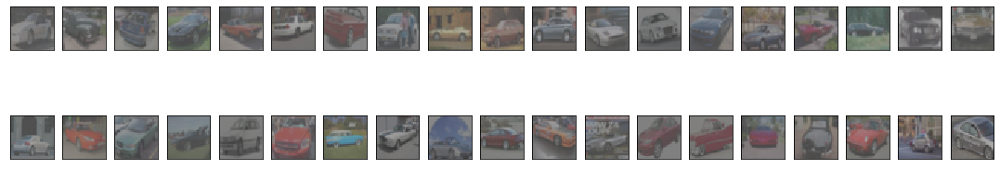

train label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


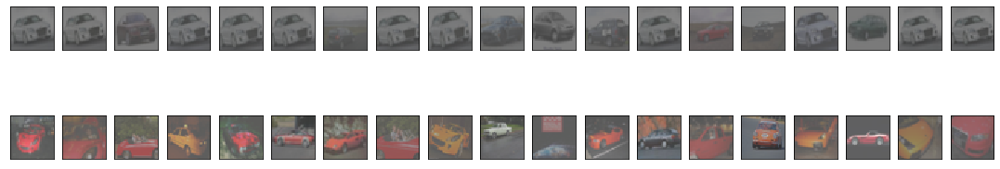

AUC: 0.6418819444444444
confusion_matrix:
[[2905 6095]
 [ 156  844]]


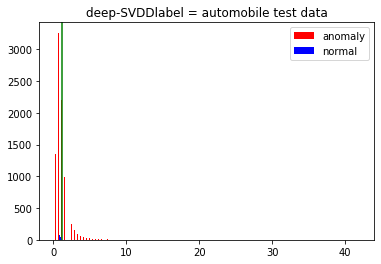

test label = automobile uncertain_img


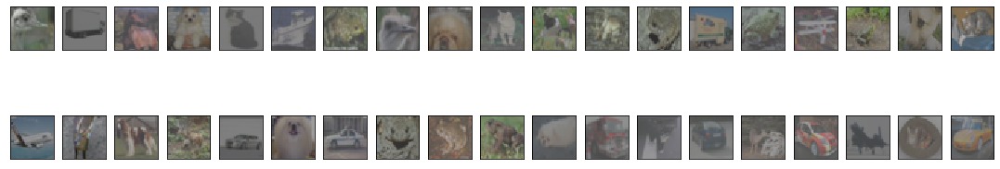

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


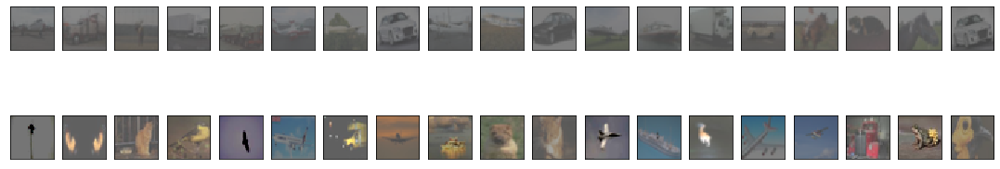

test label = automobile false_img


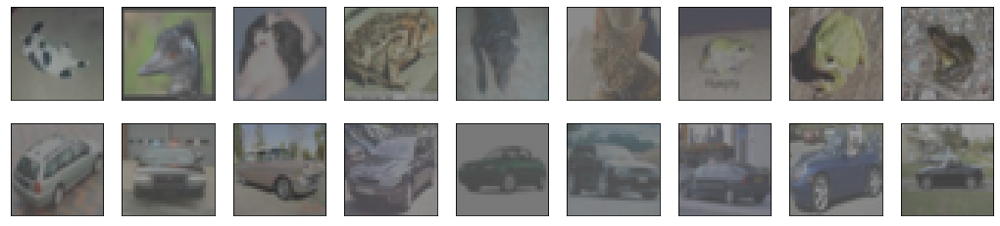

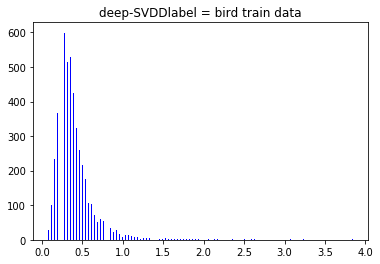

 train label = bird uncertain_img


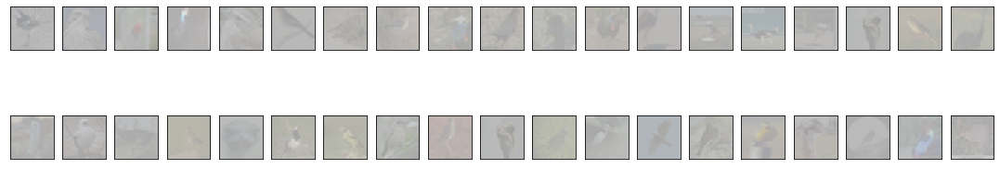

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = bird distance oder


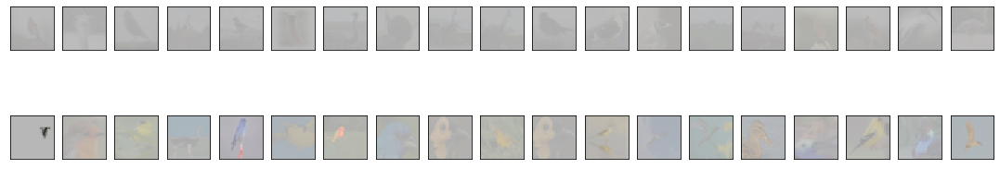

AUC: 0.46856450000000005
confusion_matrix:
[[ 854 8146]
 [ 113  887]]


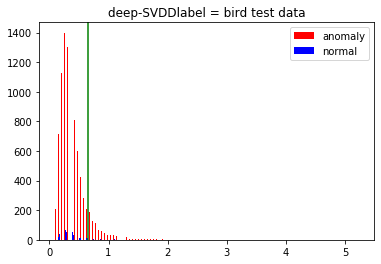

test label = bird uncertain_img


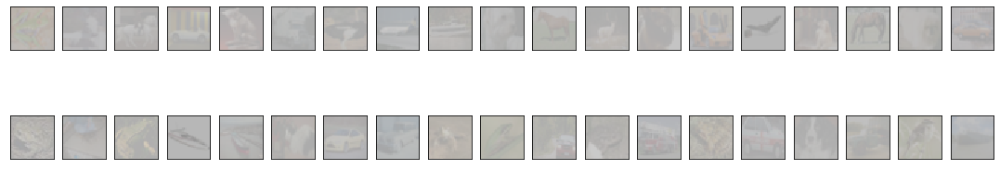

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


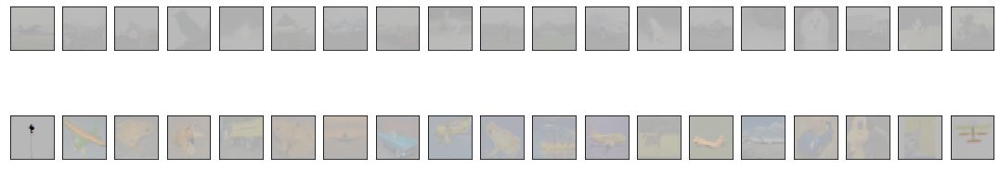

test label = bird false_img


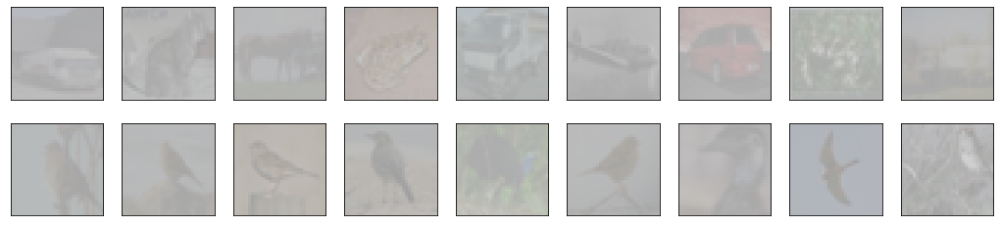

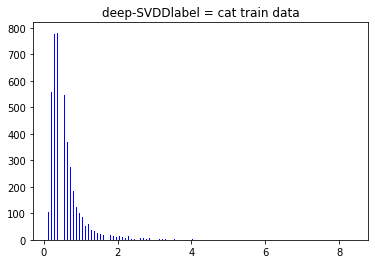

 train label = cat uncertain_img


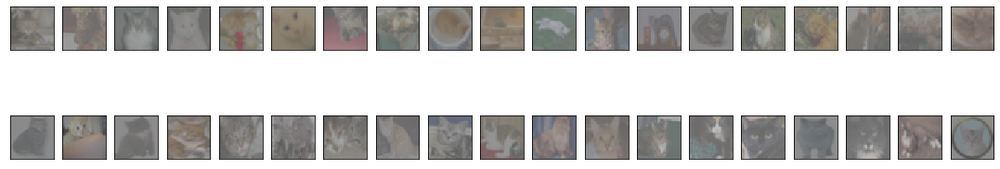

train label = cat distance oder


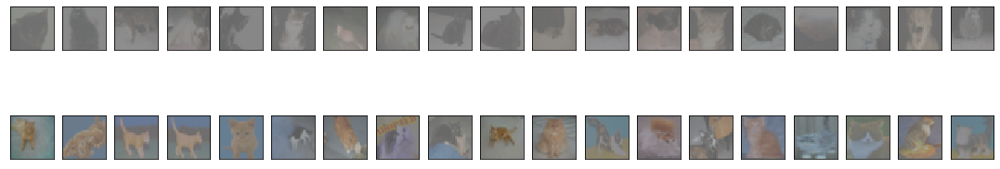

AUC: 0.6182415555555555
confusion_matrix:
[[2022 6978]
 [ 108  892]]


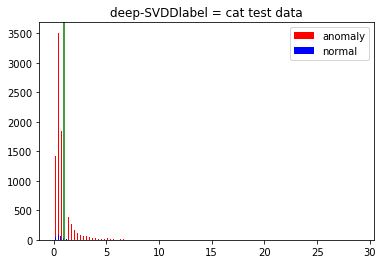

test label = cat uncertain_img


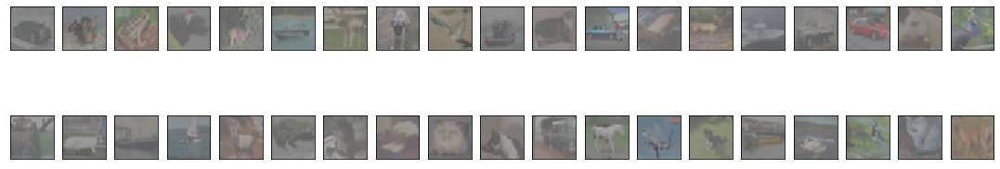

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


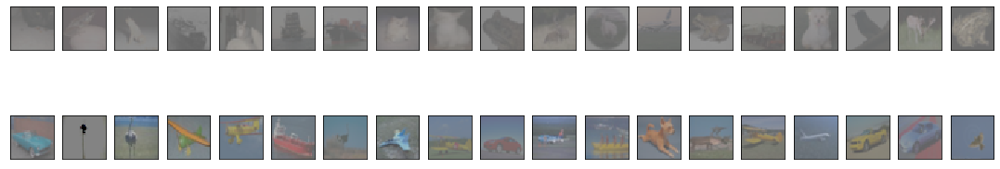

test label = cat false_img


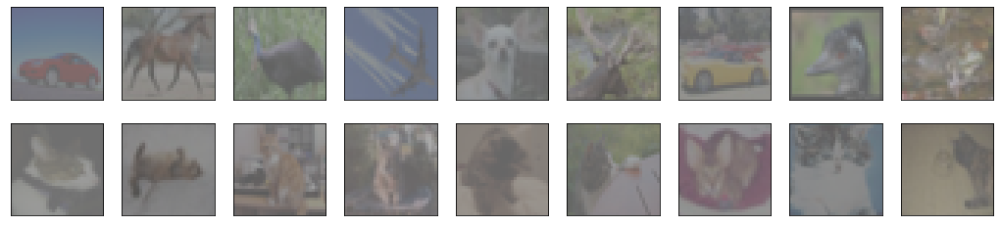

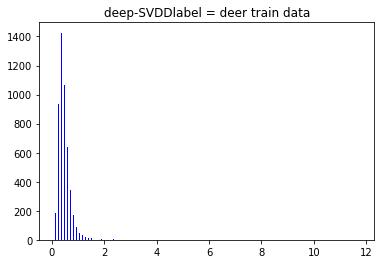

 train label = deer uncertain_img


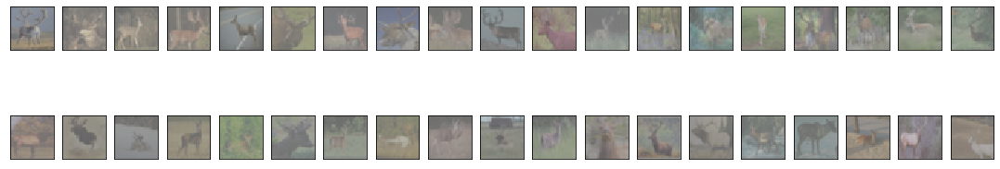

train label = deer distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


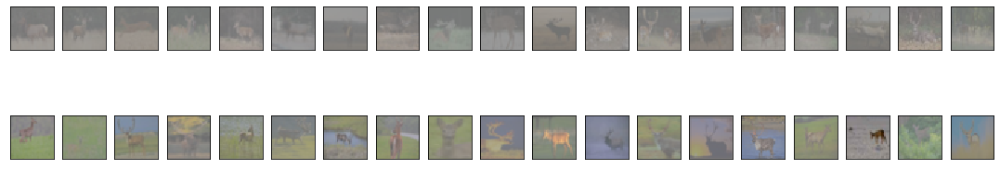

AUC: 0.5139676111111111
confusion_matrix:
[[1351 7649]
 [ 131  869]]


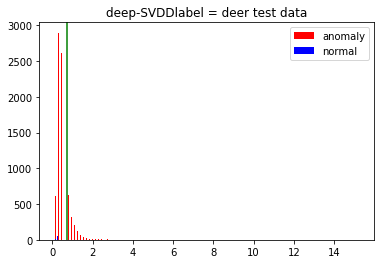

test label = deer uncertain_img


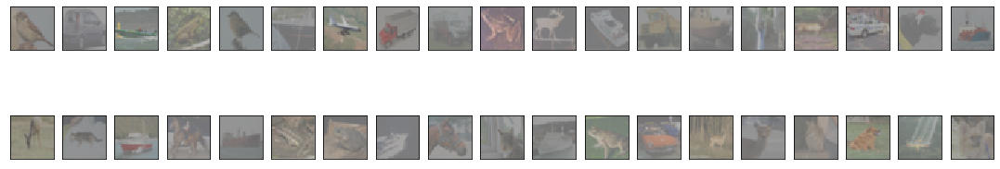

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


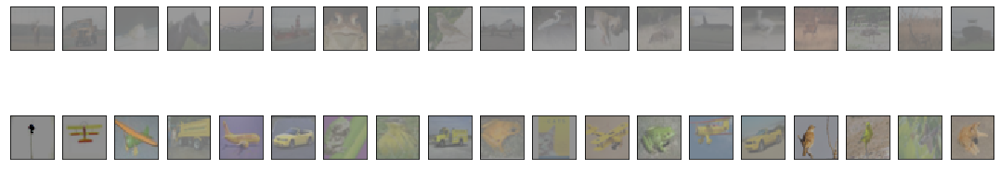

test label = deer false_img


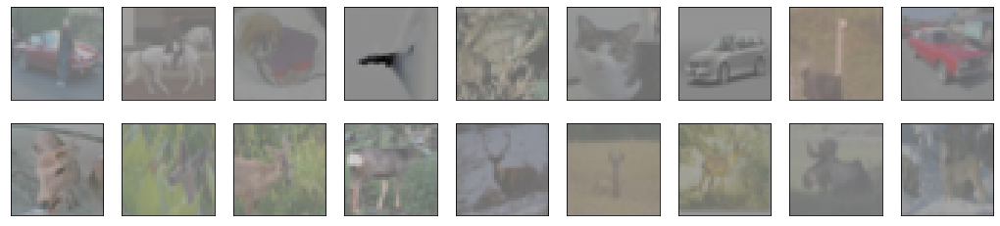

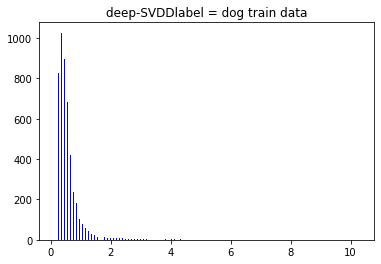

 train label = dog uncertain_img


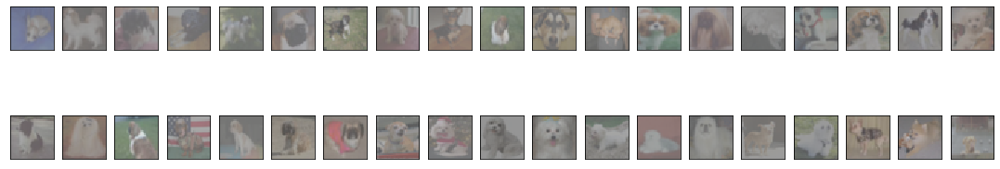

train label = dog distance oder


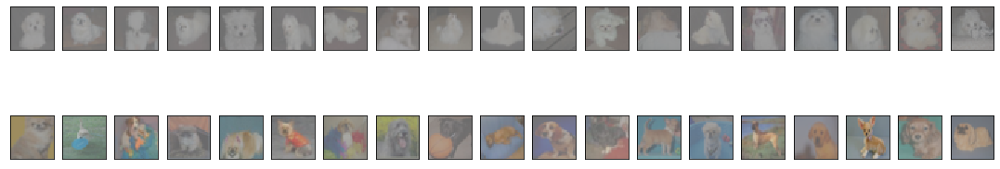

AUC: 0.6538528888888888
confusion_matrix:
[[2373 6627]
 [ 120  880]]


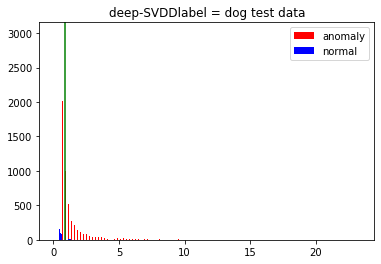

test label = dog uncertain_img


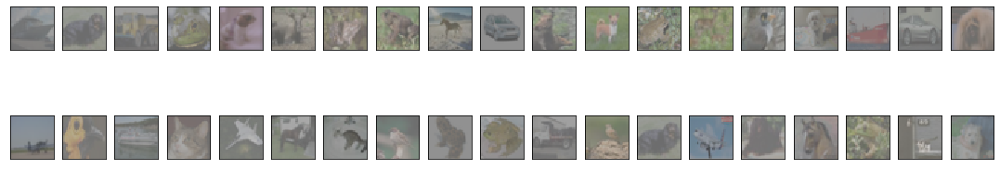

test label = dog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


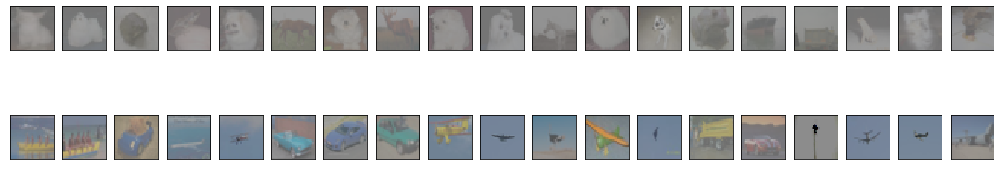

test label = dog false_img


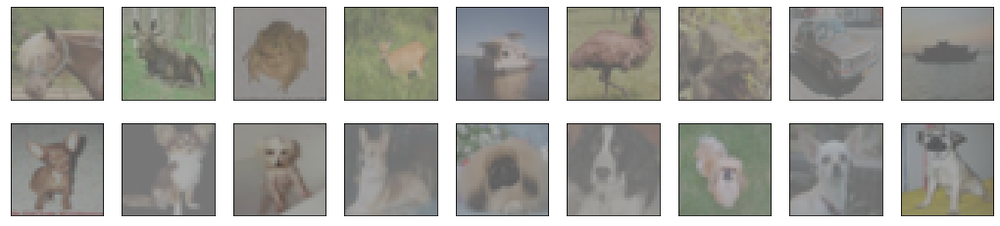

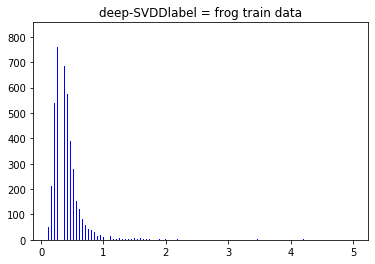

 train label = frog uncertain_img


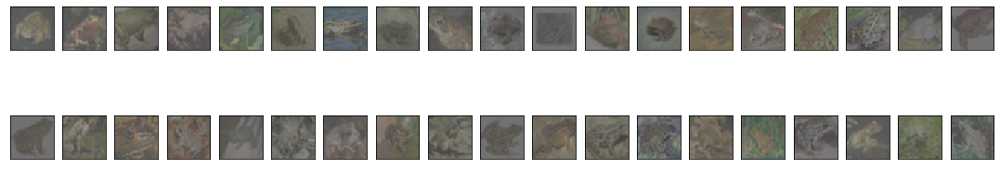

train label = frog distance oder


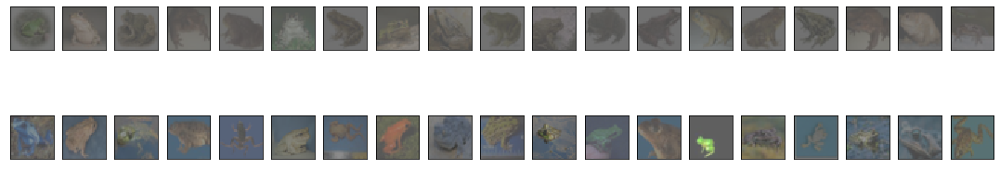

AUC: 0.6962047777777778
confusion_matrix:
[[3306 5694]
 [ 121  879]]


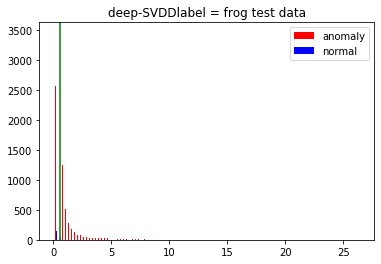

test label = frog uncertain_img


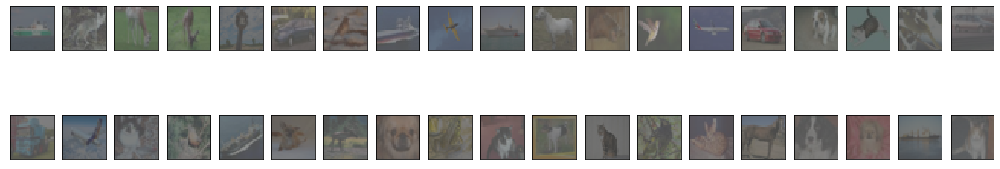

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


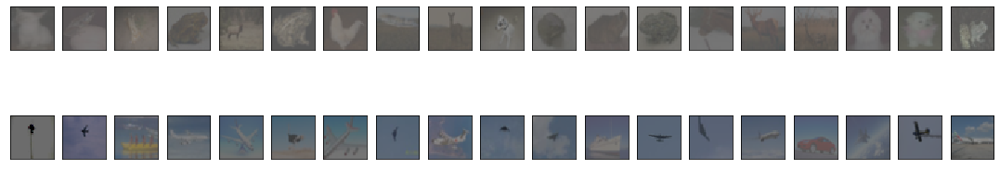

test label = frog false_img


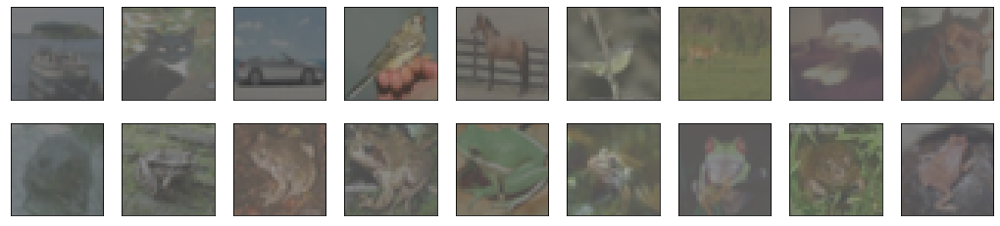

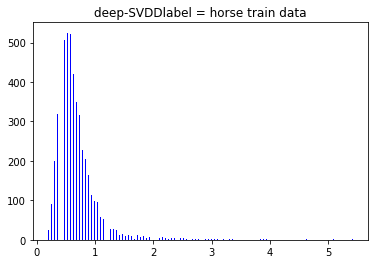

 train label = horse uncertain_img


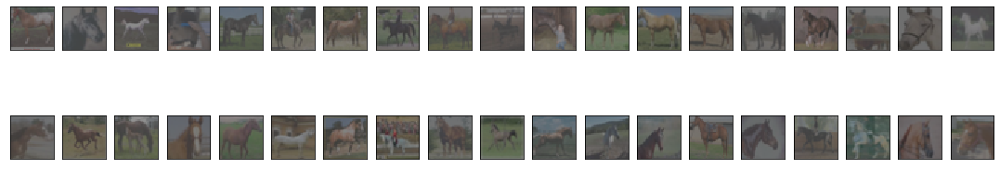

train label = horse distance oder


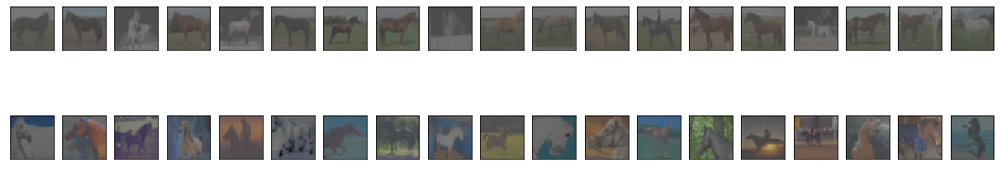

AUC: 0.7360454444444444
confusion_matrix:
[[3870 5130]
 [ 126  874]]


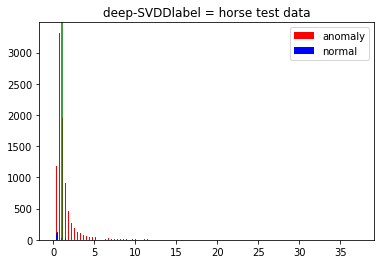

test label = horse uncertain_img


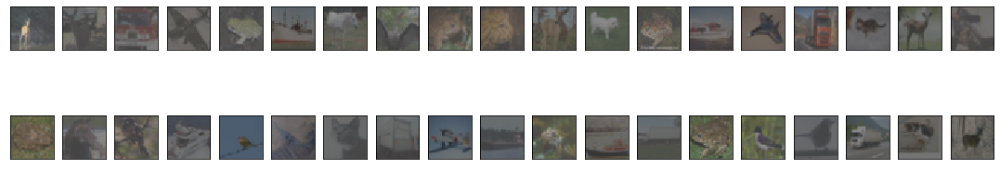

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


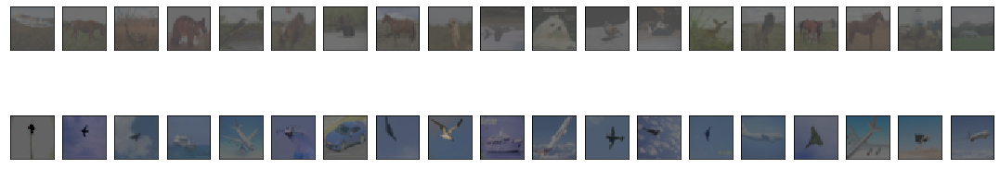

test label = horse false_img


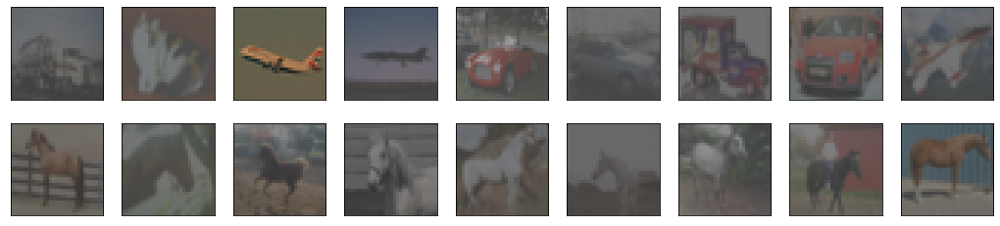

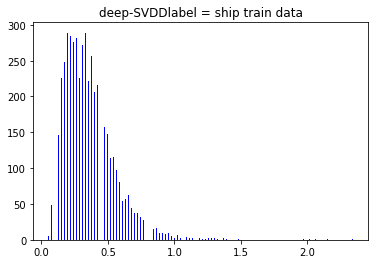

 train label = ship uncertain_img


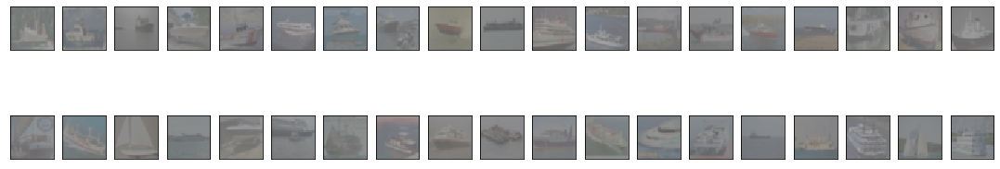

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = ship distance oder


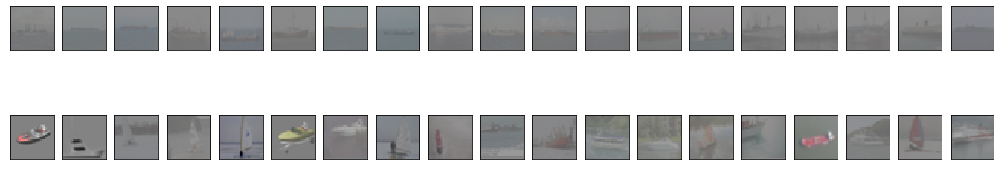

AUC: 0.7858575555555556
confusion_matrix:
[[4064 4936]
 [ 124  876]]


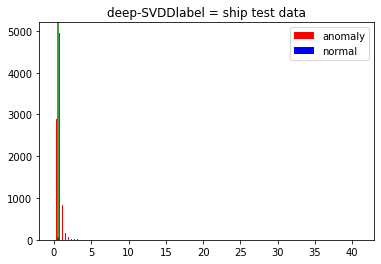

test label = ship uncertain_img


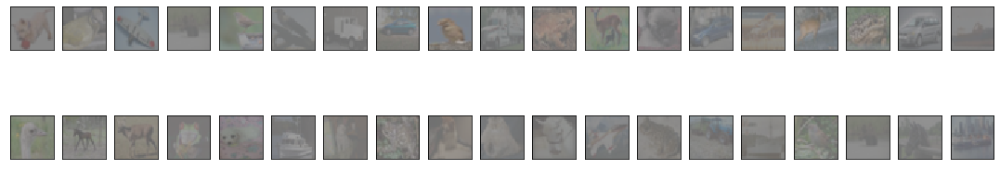

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


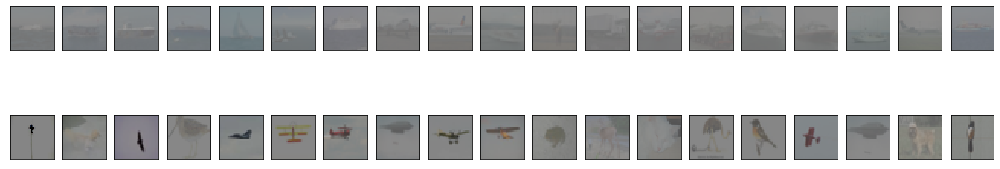

test label = ship false_img


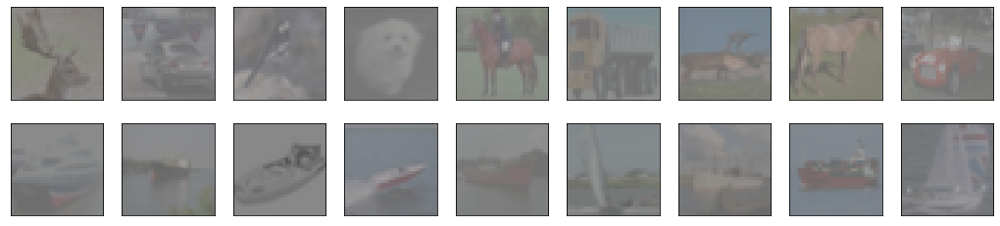

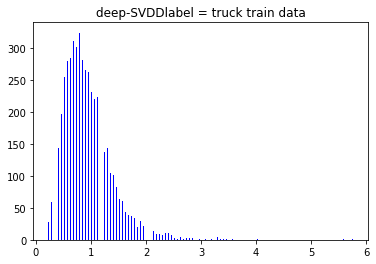

 train label = truck uncertain_img


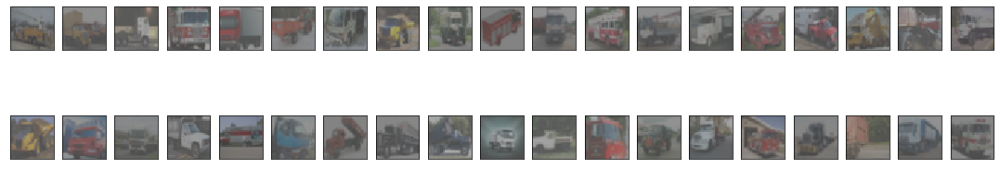

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = truck distance oder


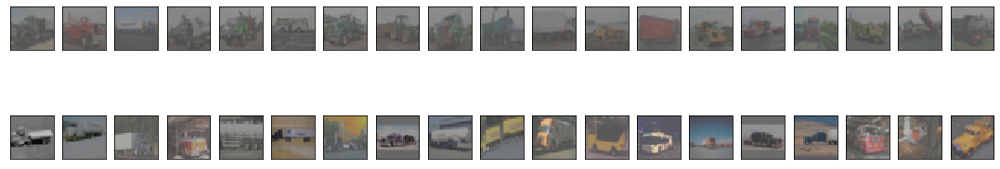

AUC: 0.7637547777777778
confusion_matrix:
[[4708 4292]
 [ 153  847]]


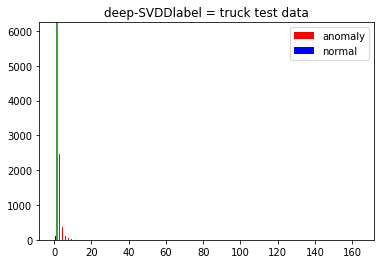

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck uncertain_img


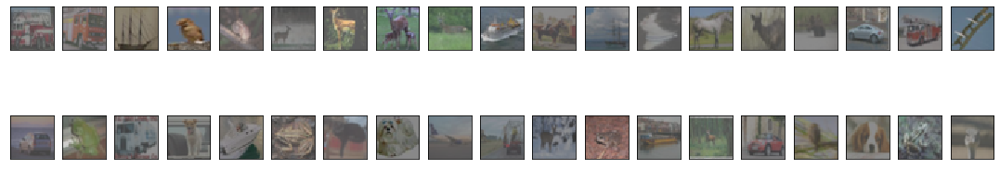

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


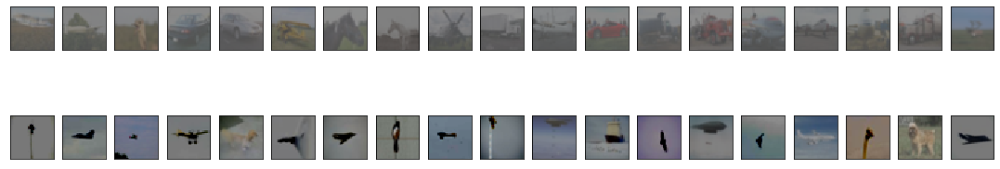

test label = truck false_img


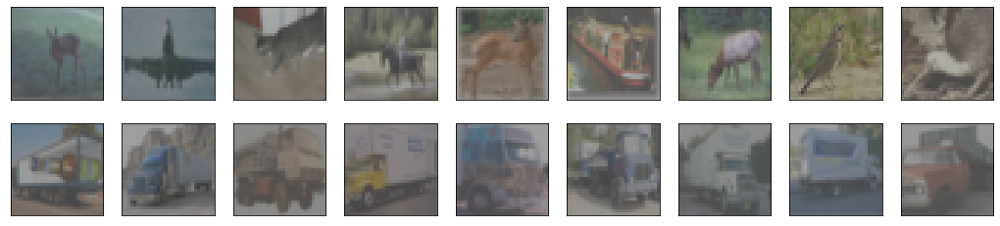

In [21]:
objective = 'deep-SVDD'
i = 0
nu = 0.1
outlier_nu = 0

for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    radius_end =SVDD.train_result(x_train, y_train, show_img = True, load_model = True)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end, show_img = True, load_model = True)

    i += 1

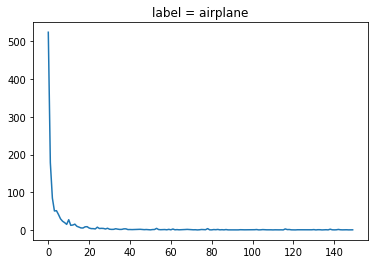

auc =  0.6095744444444444


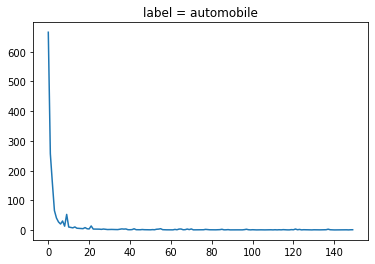

auc =  0.6329527777777777


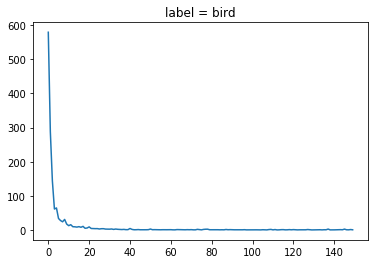

auc =  0.4945008888888889


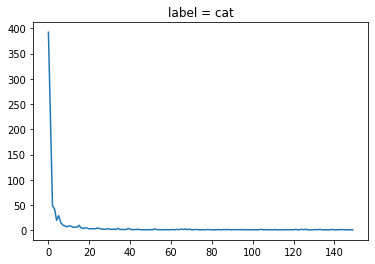

auc =  0.5547274999999999


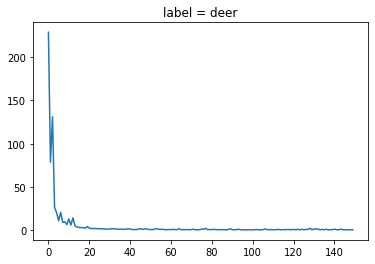

auc =  0.5846106111111111


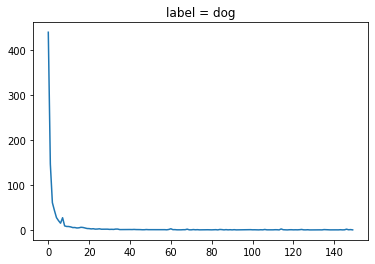

auc =  0.6017958888888889


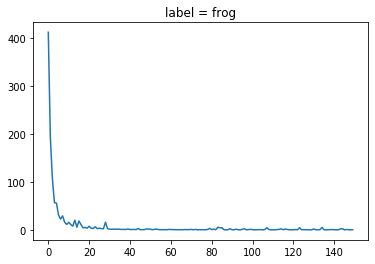

auc =  0.6372152222222223


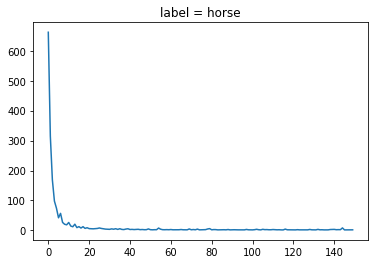

auc =  0.6546427222222222


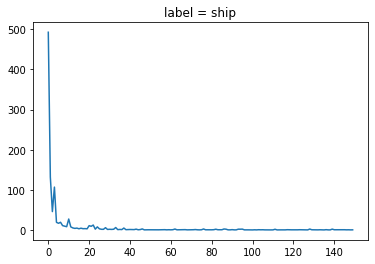

auc =  0.777122


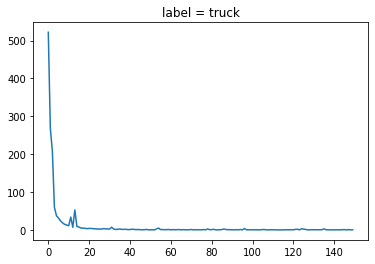

auc =  0.7412693333333333


In [16]:
objective = 'deep-SVDD'
i = 0
nu = 0.1
outlier_nu = 0.1

label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []


for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    SVDD.train(x_train, n_epochs = 150)
    radius_end =SVDD.train_result(x_train, y_train)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end)
    train_time = time.time() - pre_time
    print('auc = ', test_auc)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)
    i += 1

In [17]:
#nu = 0.1, outlier_nu = 0
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])

label =  airplane
auc =  0.6095744444444444
time =  258.5277156829834
label =  automobile
auc =  0.6329527777777777
time =  263.29848551750183
label =  bird
auc =  0.4945008888888889
time =  261.672545671463
label =  cat
auc =  0.5547274999999999
time =  259.12225890159607
label =  deer
auc =  0.5846106111111111
time =  261.91258096694946
label =  dog
auc =  0.6017958888888889
time =  258.24788761138916
label =  frog
auc =  0.6372152222222223
time =  258.03990268707275
label =  horse
auc =  0.6546427222222222
time =  252.73356652259827
label =  ship
auc =  0.777122
time =  253.25685667991638
label =  truck
auc =  0.7412693333333333
time =  253.97349905967712


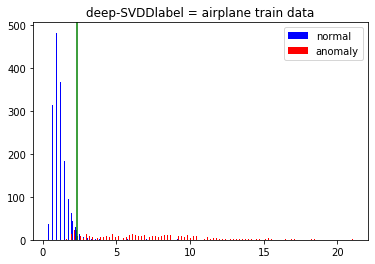

 train label = airplane uncertain_img


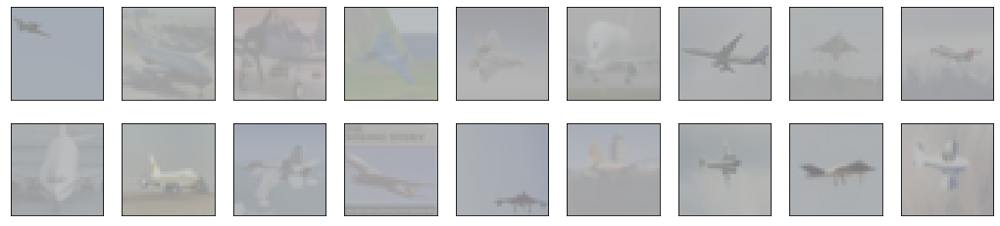

train label = airplane distance oder


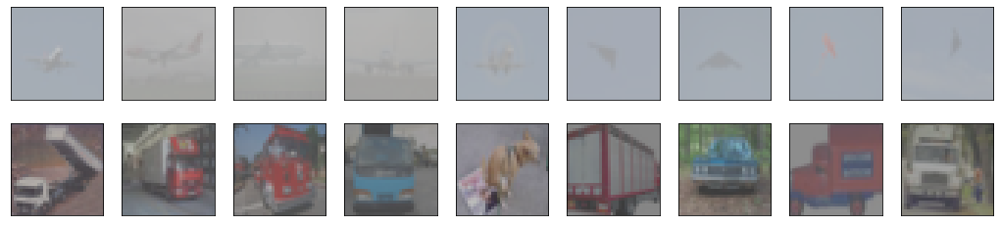

train label = airplane false_img


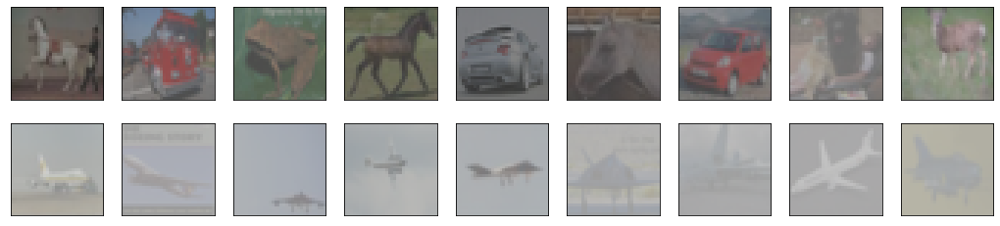

AUC: 0.6088832222222222
confusion_matrix:
[[ 129 8871]
 [  32  968]]


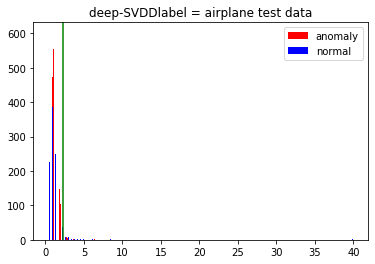

test label = airplane uncertain_img


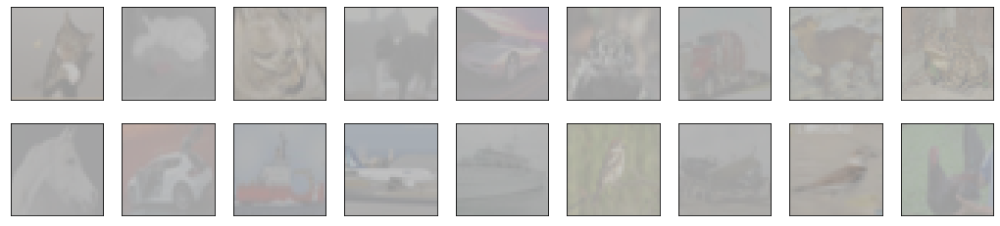

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


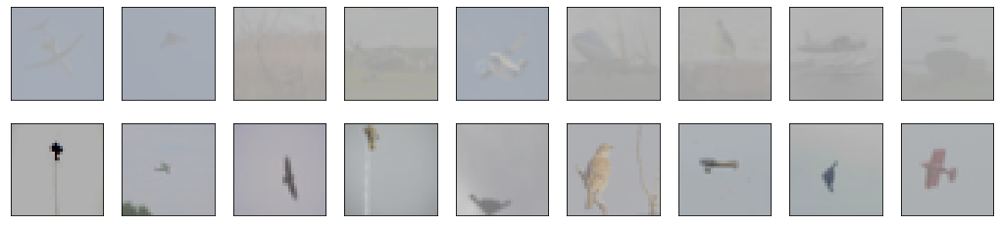

test label = airplane false_img


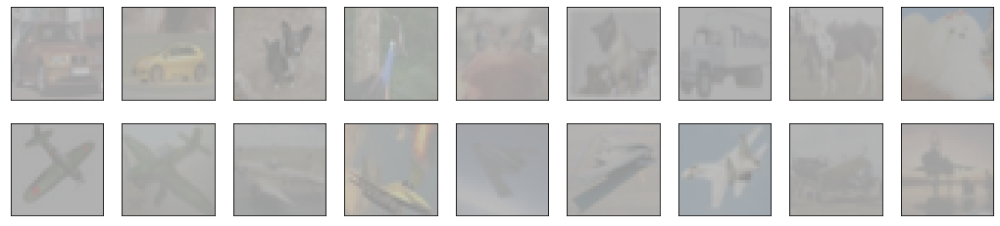

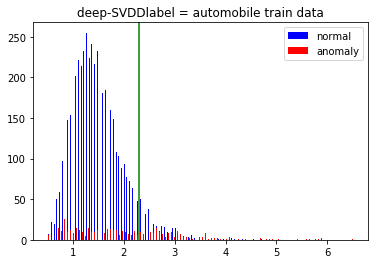

 train label = automobile uncertain_img


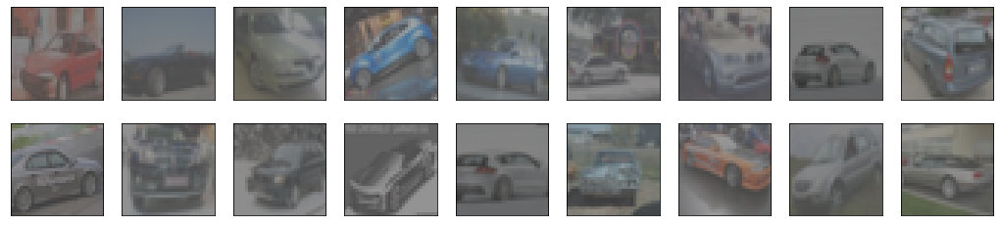

train label = automobile distance oder


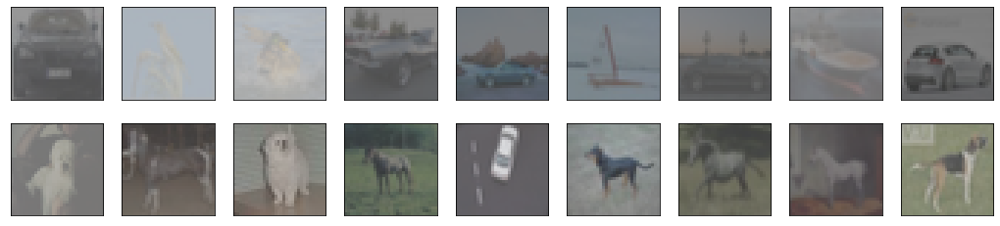

train label = automobile false_img


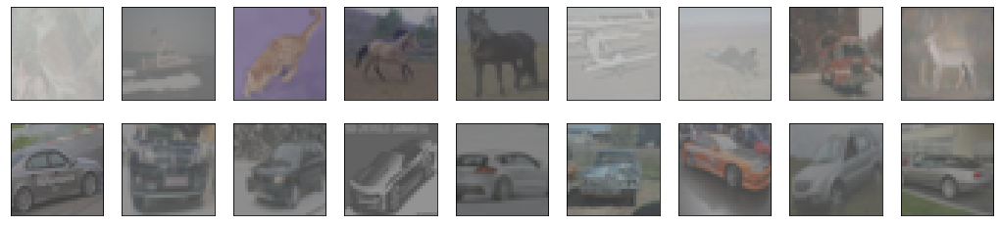

AUC: 0.6164122777777777
confusion_matrix:
[[2032 6968]
 [  99  901]]


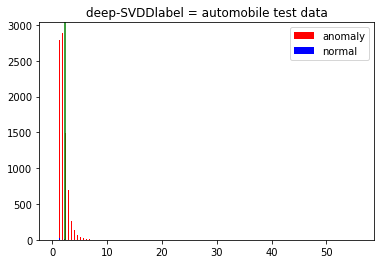

test label = automobile uncertain_img


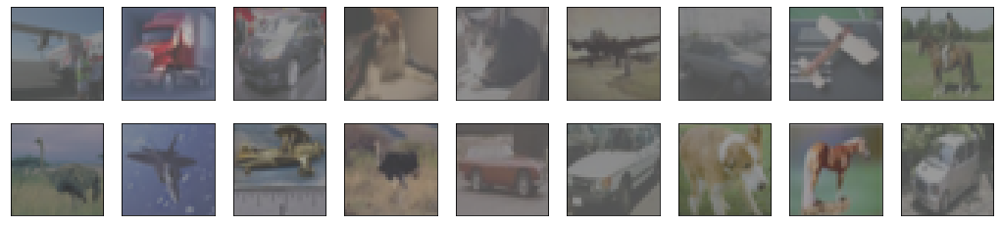

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


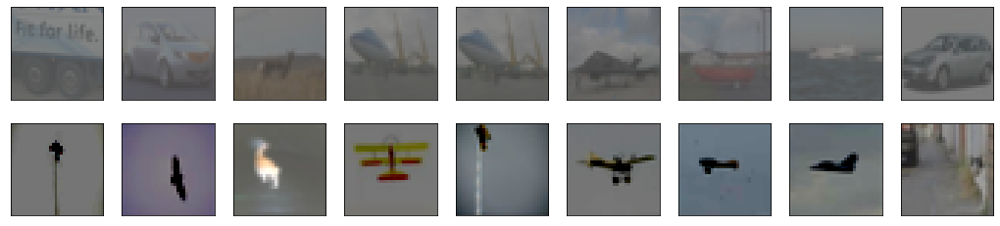

test label = automobile false_img


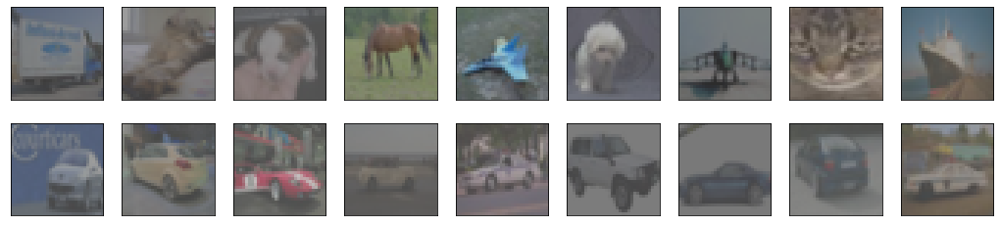

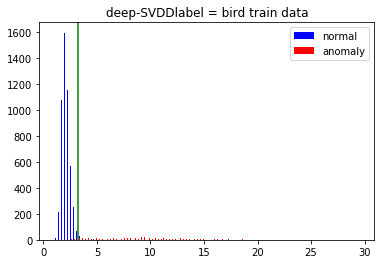

 train label = bird uncertain_img


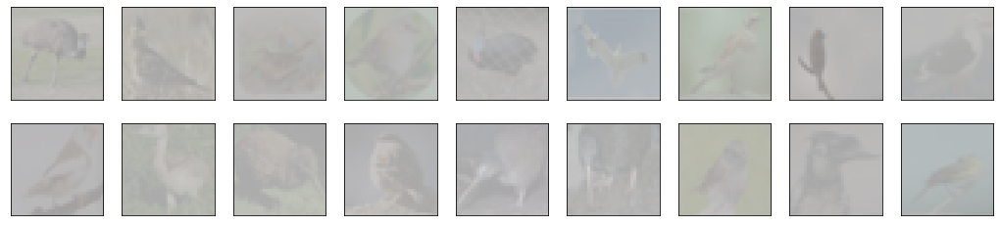

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = bird distance oder


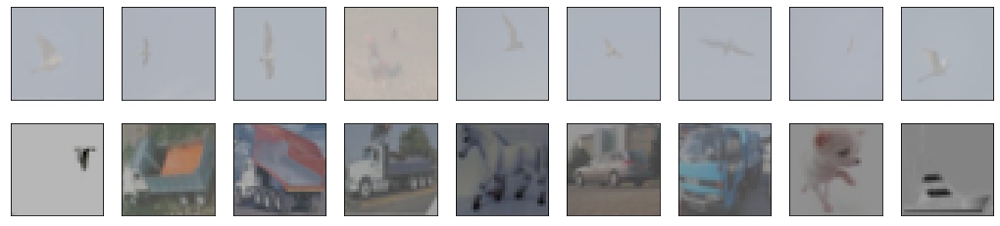

train label = bird false_img


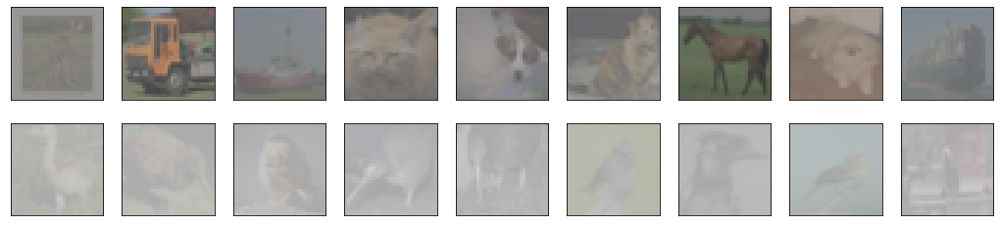

AUC: 0.49279011111111115
confusion_matrix:
[[ 113 8887]
 [  11  989]]


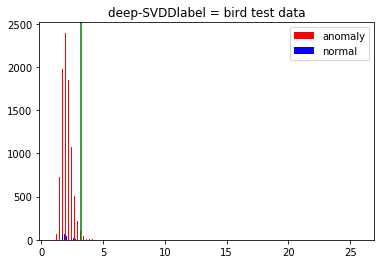

test label = bird uncertain_img


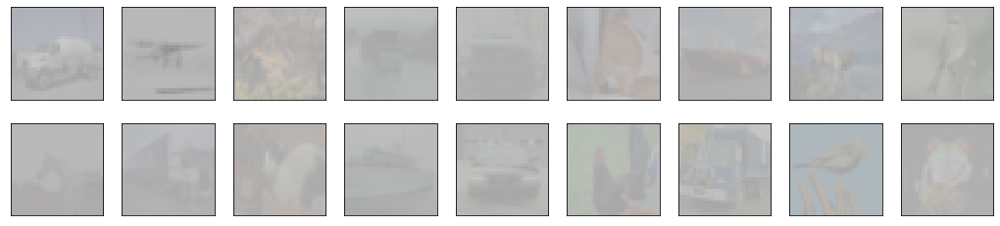

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


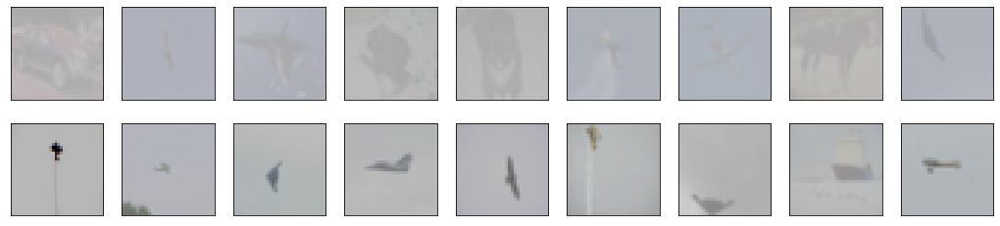

test label = bird false_img


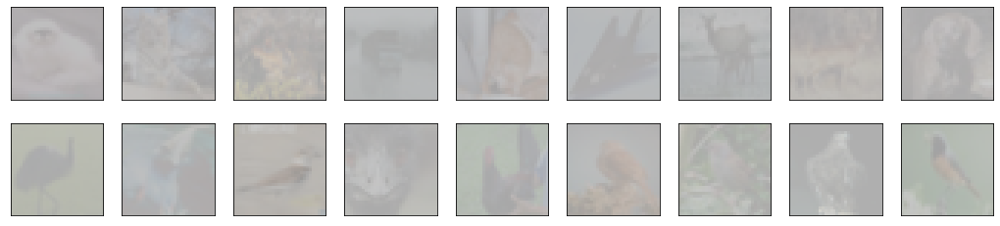

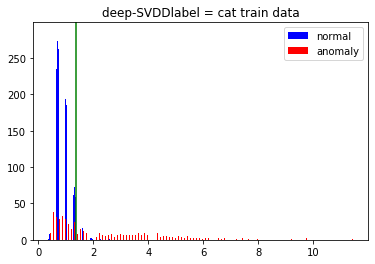

 train label = cat uncertain_img


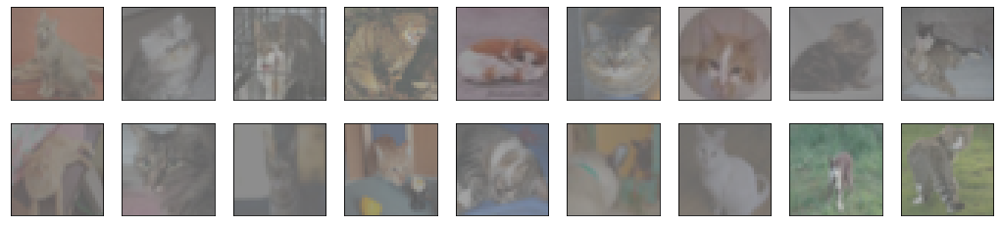

train label = cat distance oder


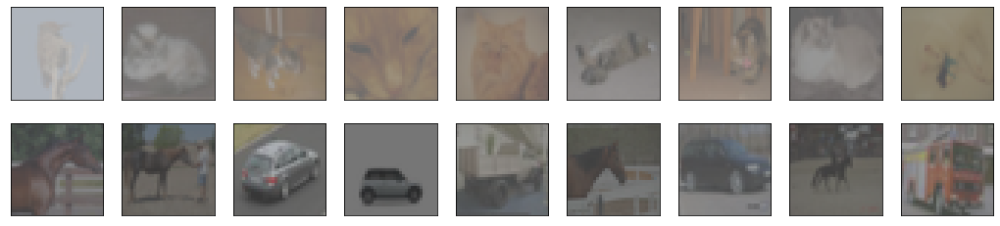

train label = cat false_img


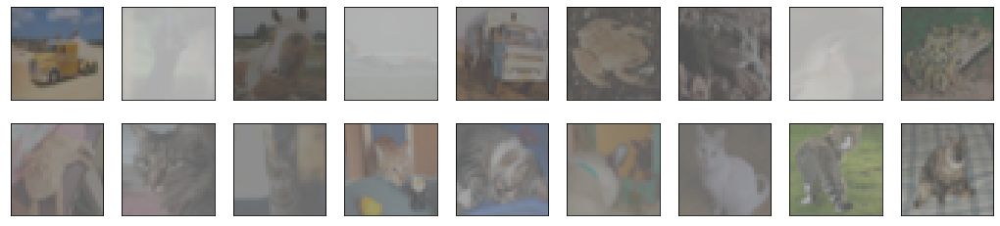

AUC: 0.5252517222222222
confusion_matrix:
[[ 954 8046]
 [  69  931]]


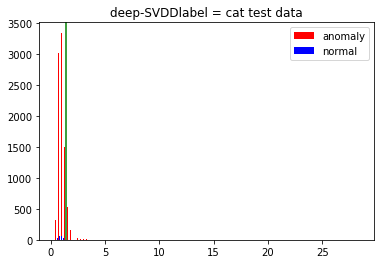

test label = cat uncertain_img


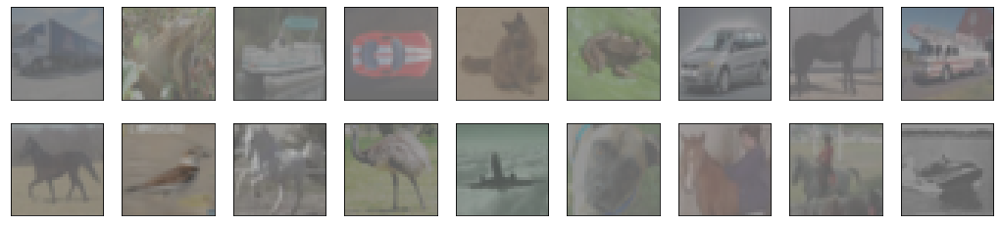

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


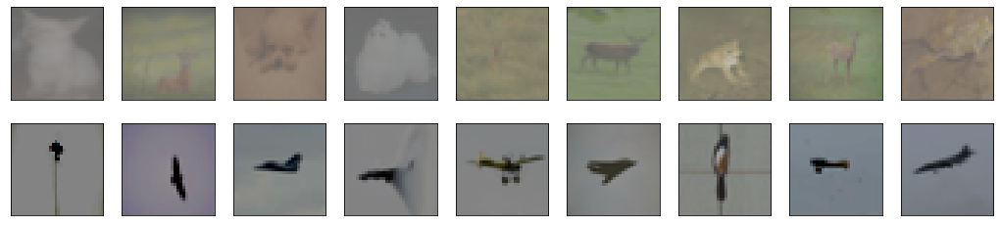

test label = cat false_img


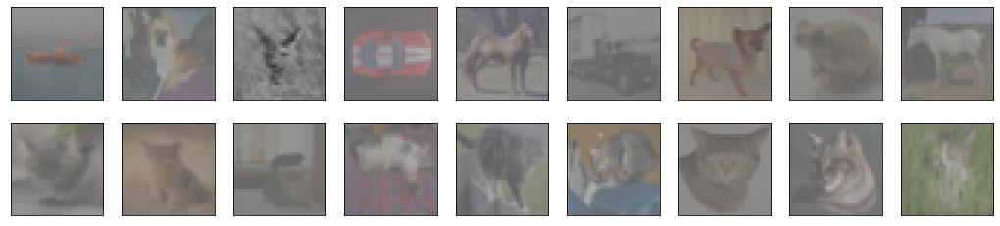

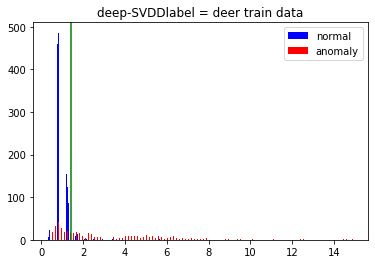

 train label = deer uncertain_img


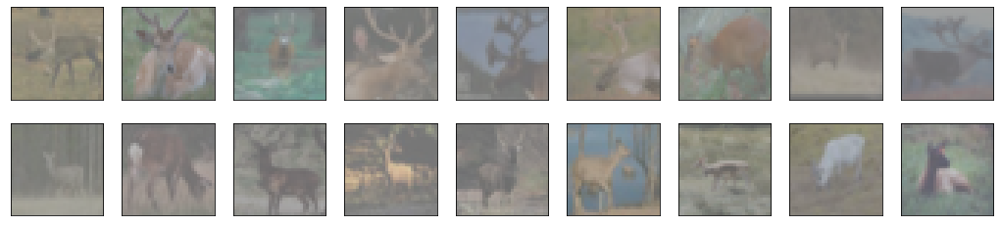

train label = deer distance oder


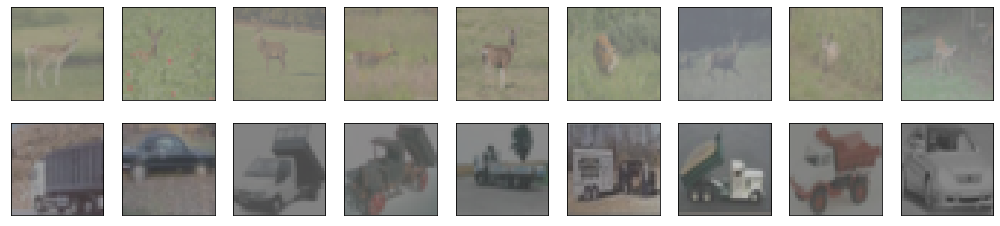

train label = deer false_img


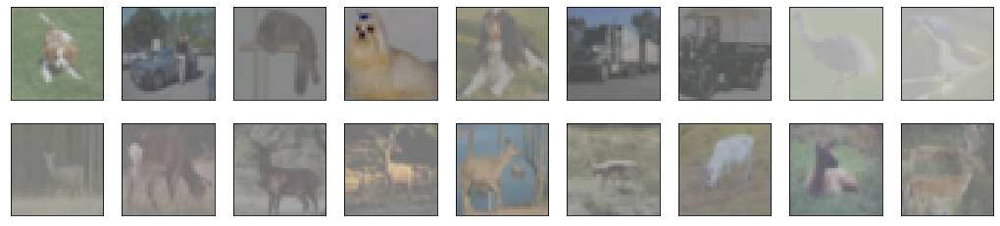

AUC: 0.5795957777777778
confusion_matrix:
[[ 802 8198]
 [  49  951]]


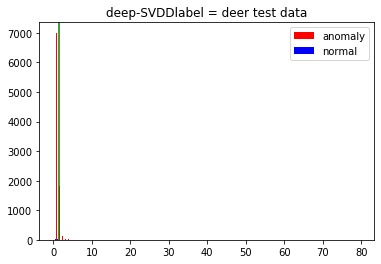

test label = deer uncertain_img


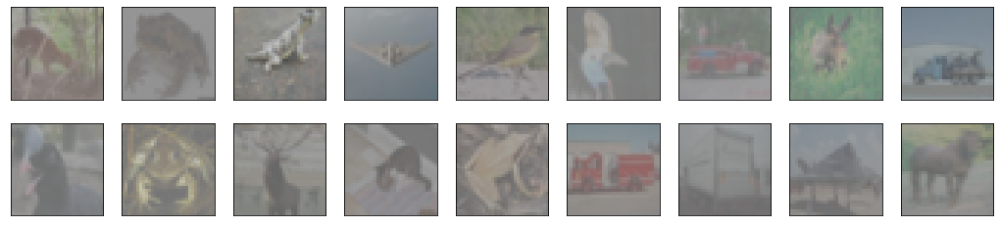

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


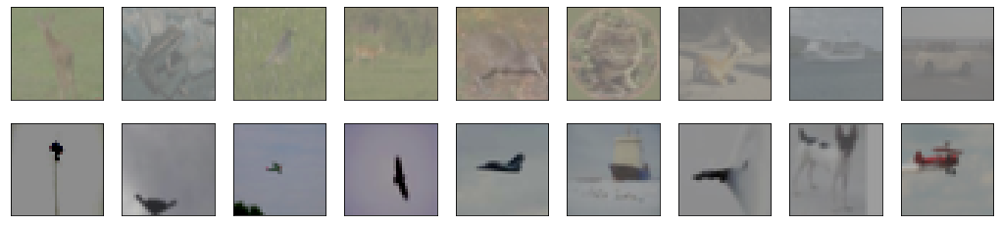

test label = deer false_img


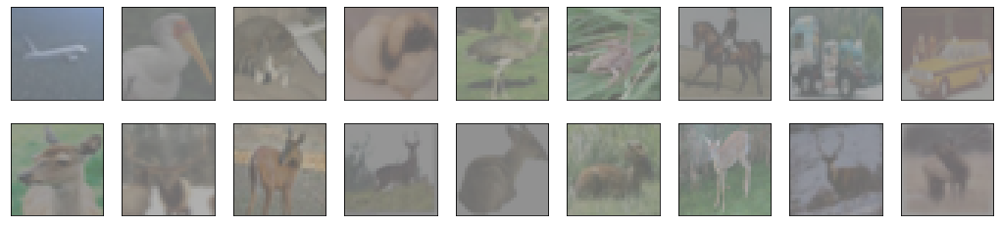

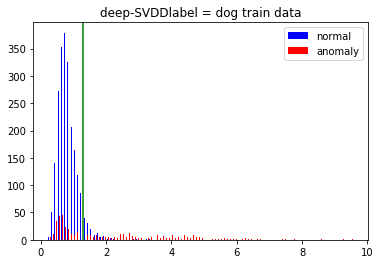

 train label = dog uncertain_img


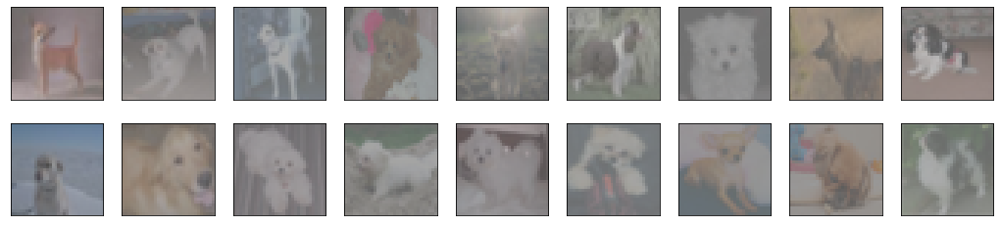

train label = dog distance oder


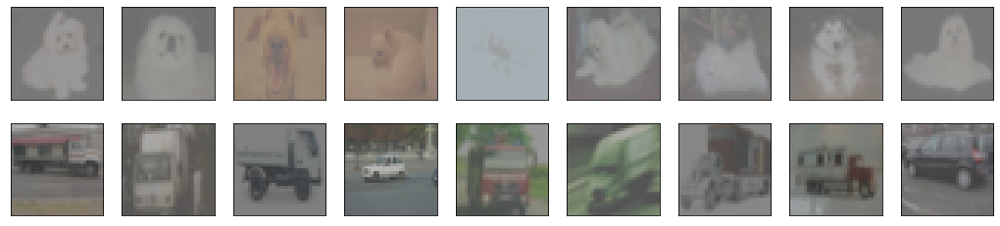

train label = dog false_img


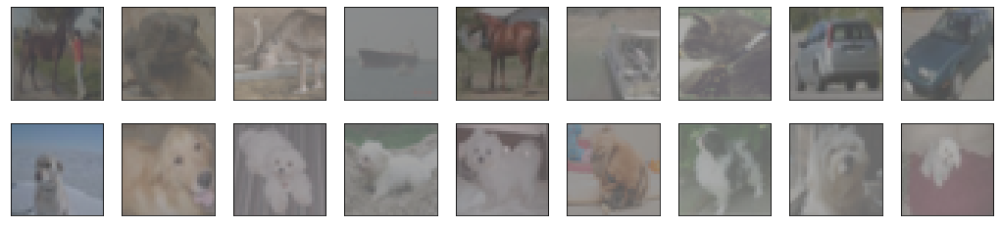

AUC: 0.6017242777777778
confusion_matrix:
[[1111 7889]
 [  75  925]]


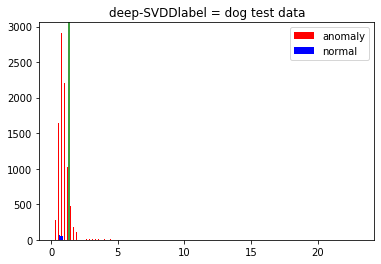

test label = dog uncertain_img


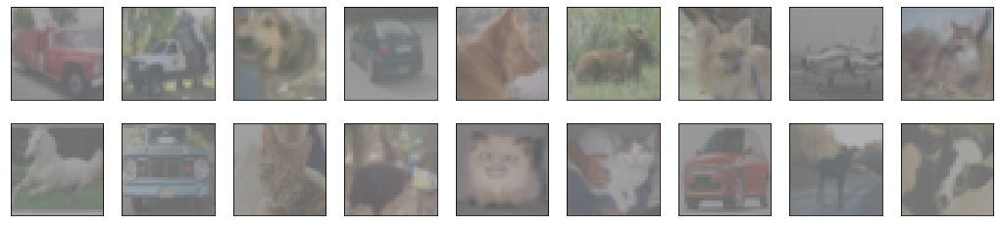

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = dog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


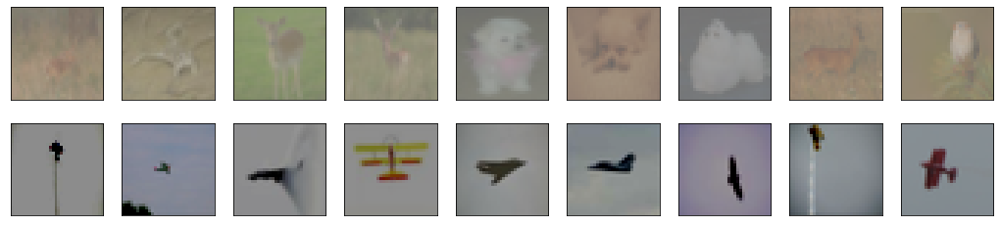

test label = dog false_img


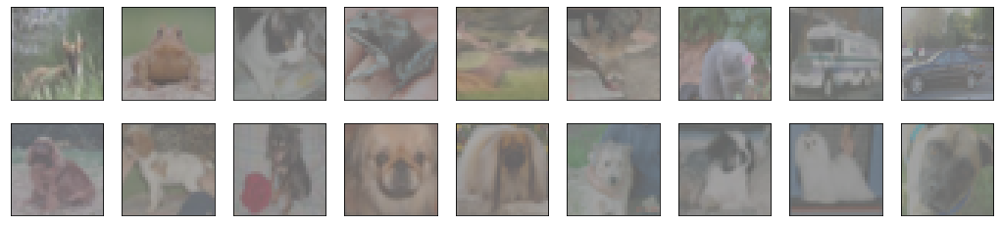

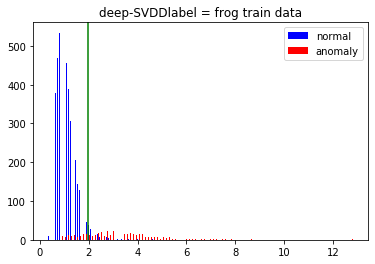

 train label = frog uncertain_img


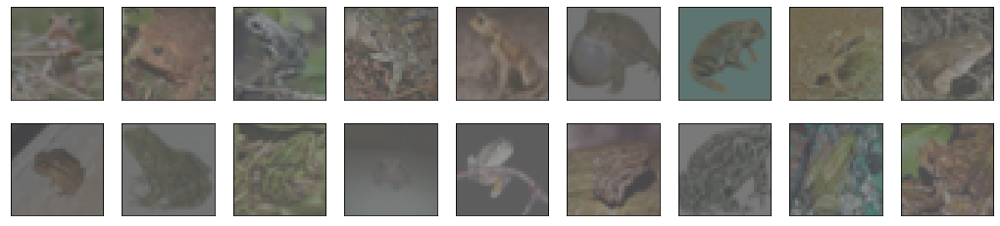

train label = frog distance oder


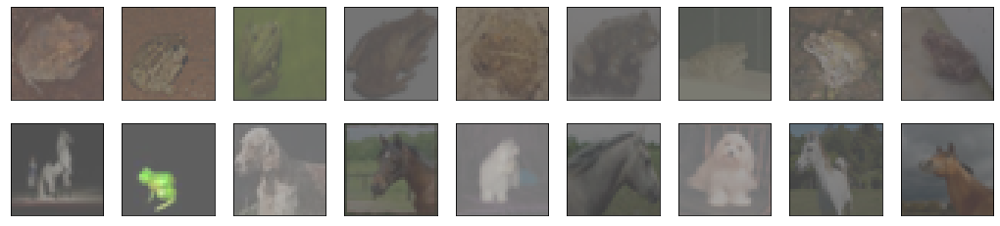

train label = frog false_img


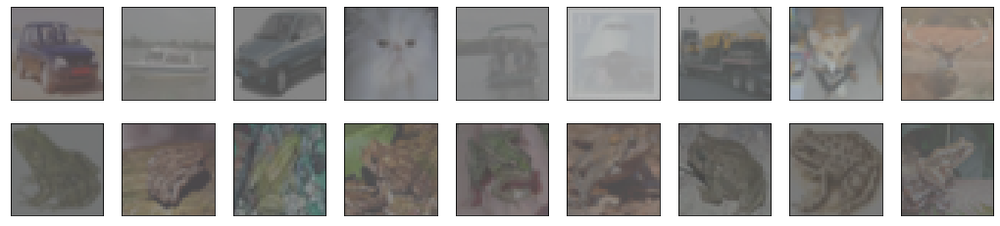

AUC: 0.6393974444444444
confusion_matrix:
[[1061 7939]
 [  34  966]]


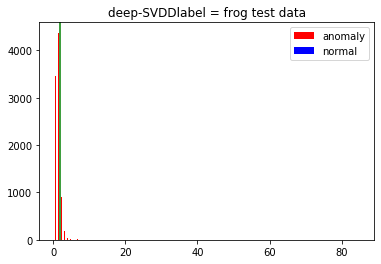

test label = frog uncertain_img


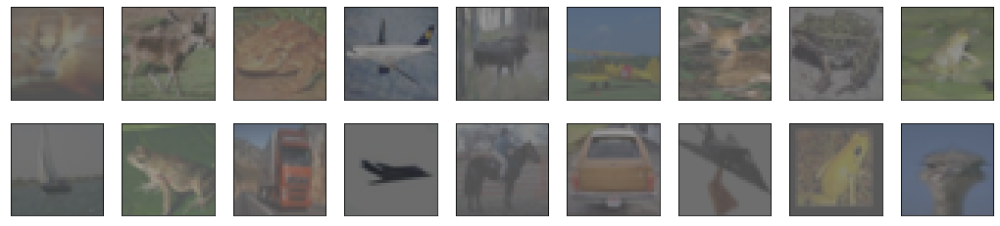

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


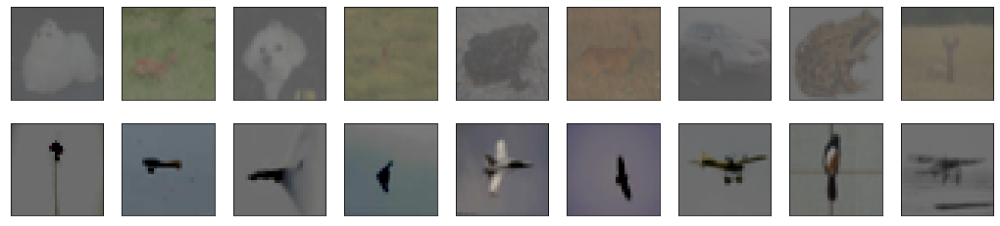

test label = frog false_img


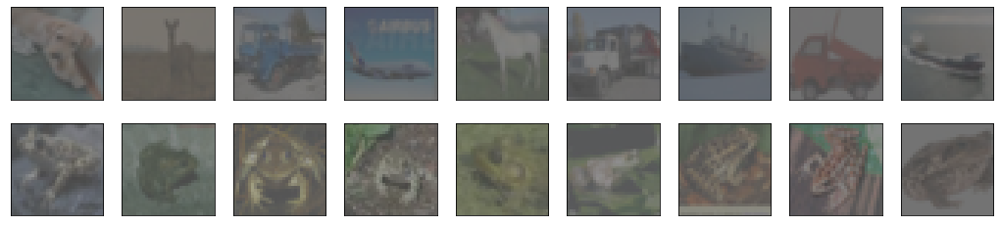

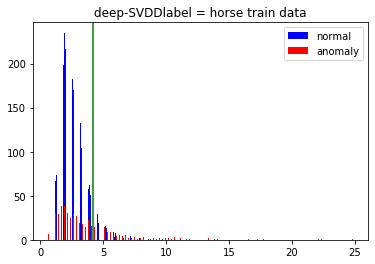

 train label = horse uncertain_img


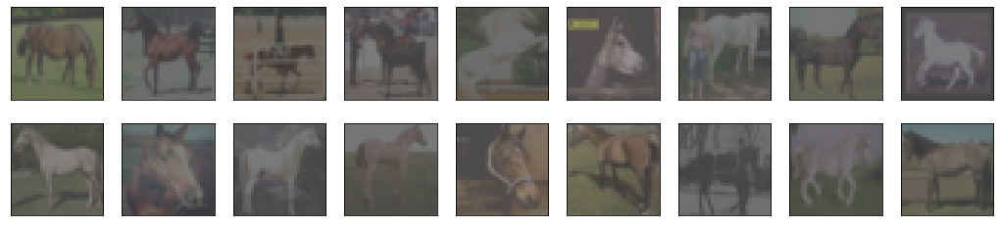

train label = horse distance oder


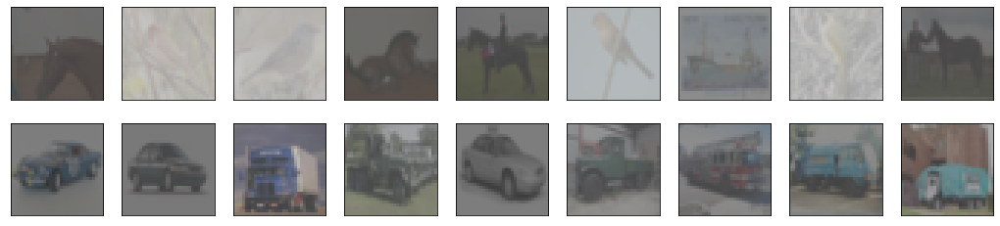

train label = horse false_img


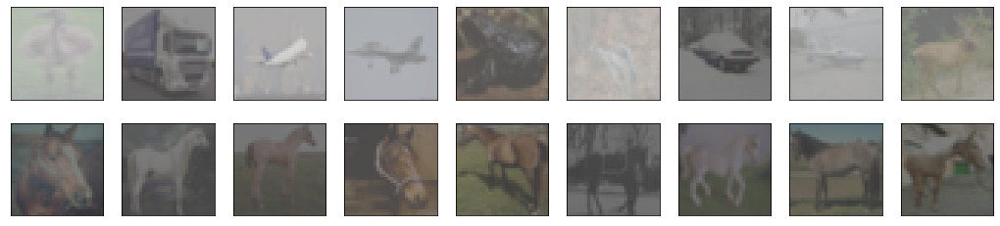

AUC: 0.5812173333333333
confusion_matrix:
[[1469 7531]
 [  76  924]]


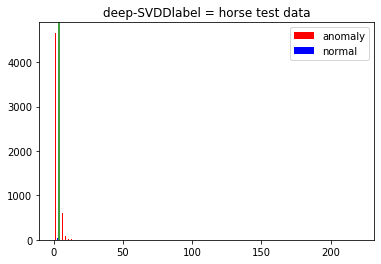

test label = horse uncertain_img


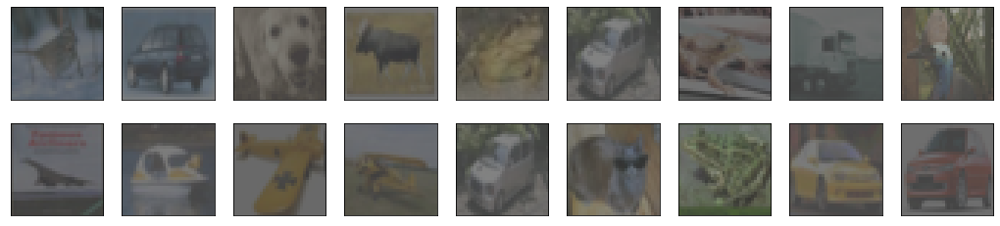

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


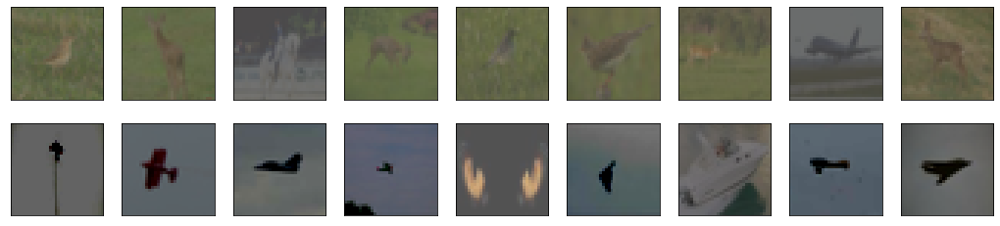

test label = horse false_img


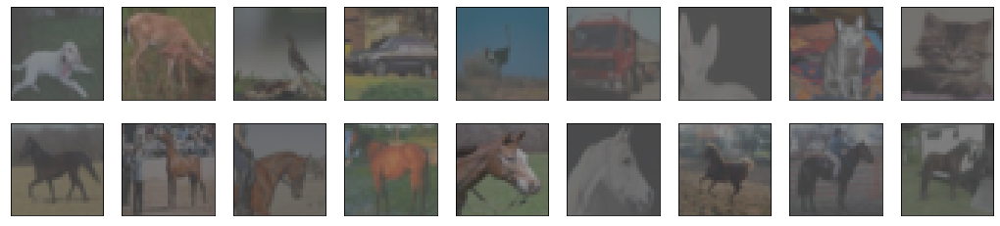

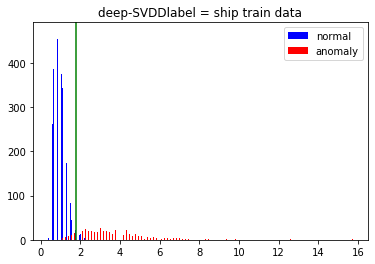

 train label = ship uncertain_img


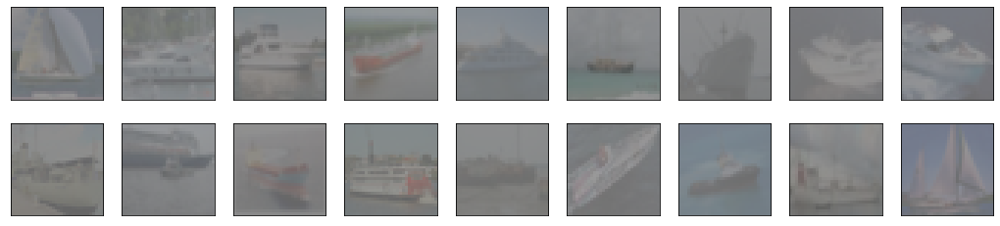

train label = ship distance oder


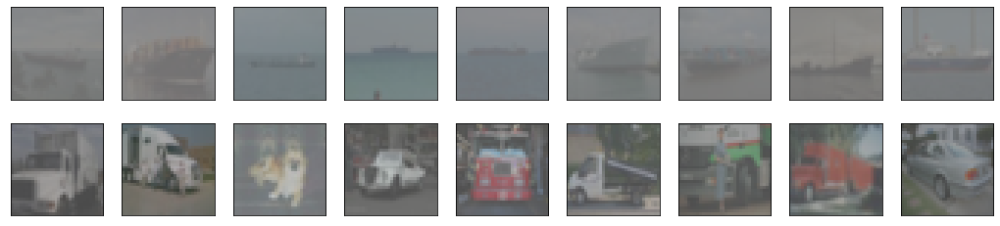

train label = ship false_img


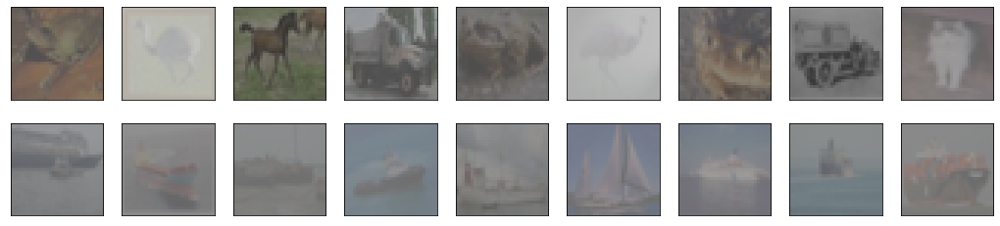

AUC: 0.7337162777777778
confusion_matrix:
[[ 738 8262]
 [  23  977]]


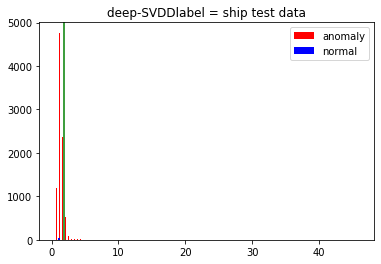

test label = ship uncertain_img


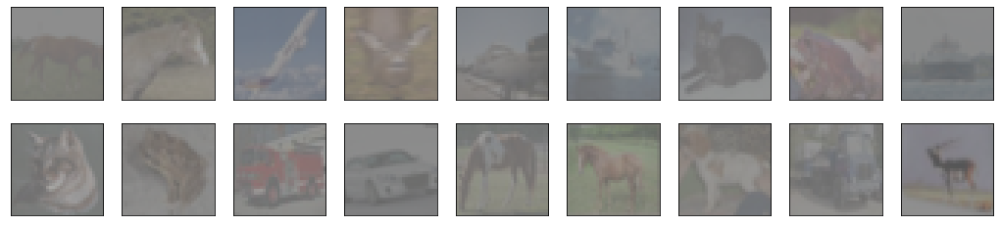

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


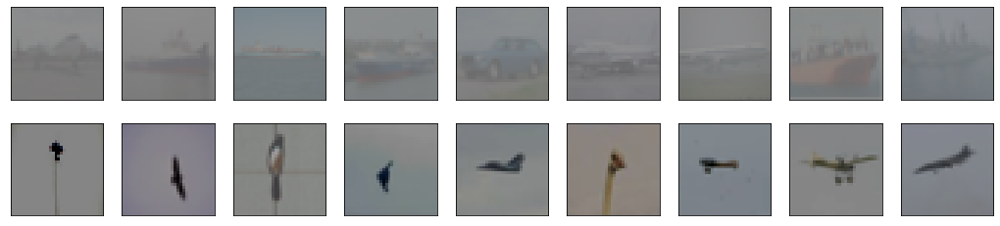

test label = ship false_img


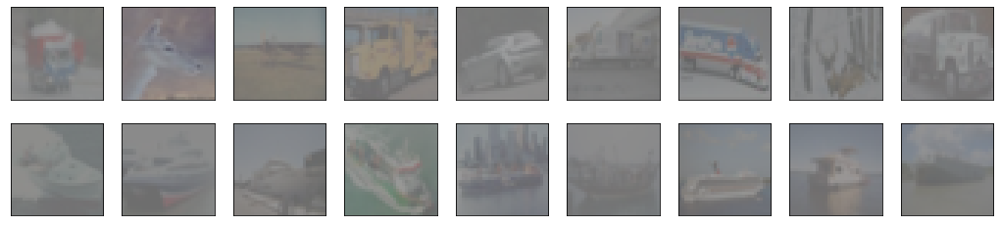

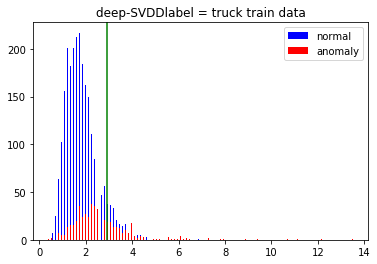

 train label = truck uncertain_img


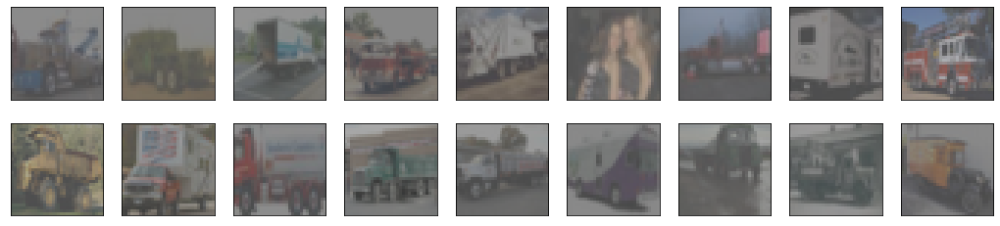

train label = truck distance oder


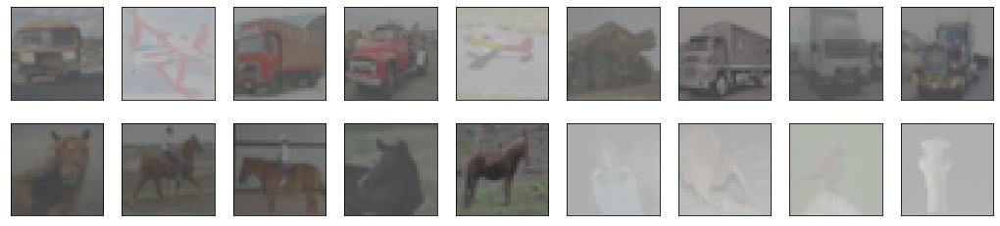

train label = truck false_img


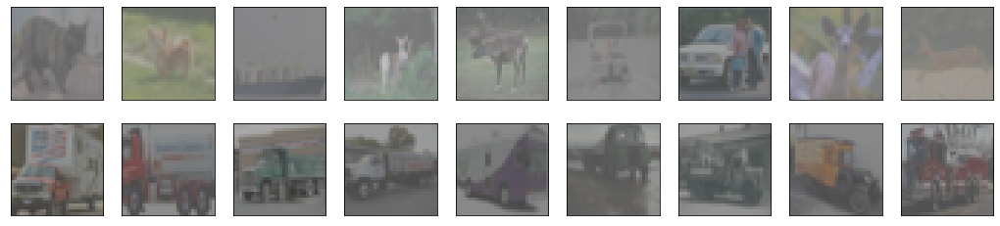

AUC: 0.7108595
confusion_matrix:
[[2564 6436]
 [  79  921]]


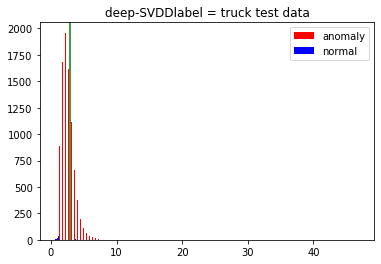

test label = truck uncertain_img


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


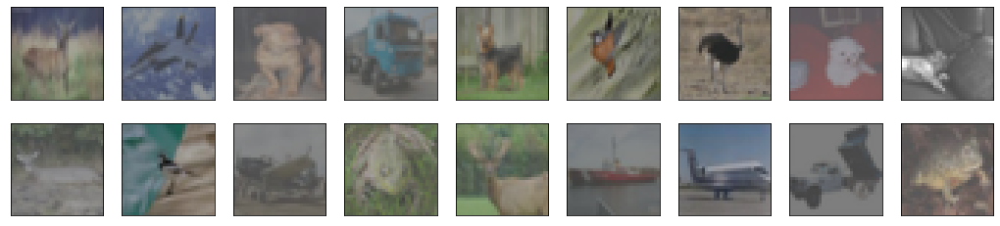

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


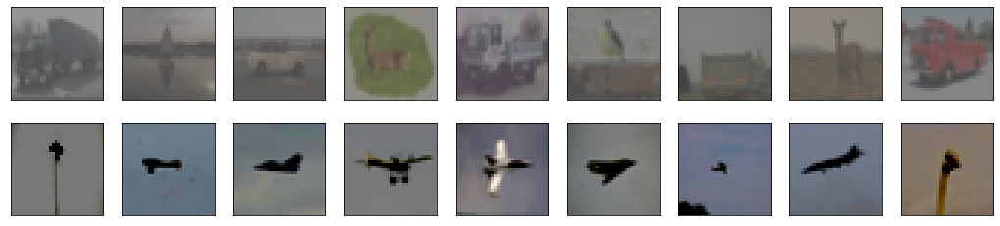

test label = truck false_img


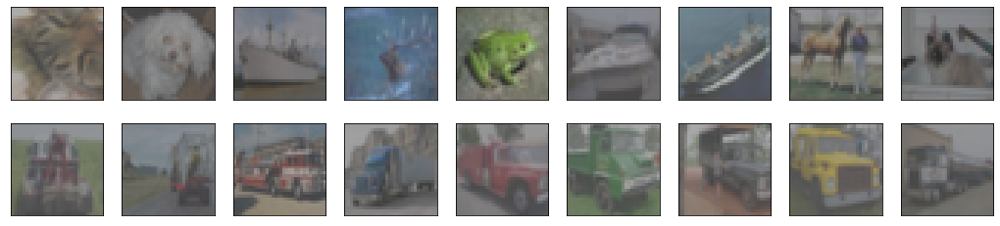

In [18]:
objective = 'deep-SVDD'
i = 0
nu = 0.1
outlier_nu = 0.1

for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    radius_end =SVDD.train_result(x_train, y_train, show_img = True, load_model = True)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end, show_img = True, load_model = True)

    i += 1

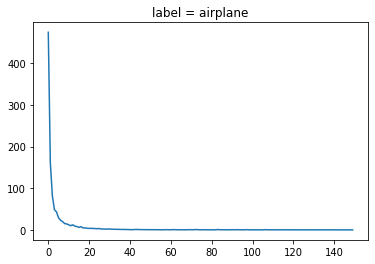

auc =  0.6111125555555555


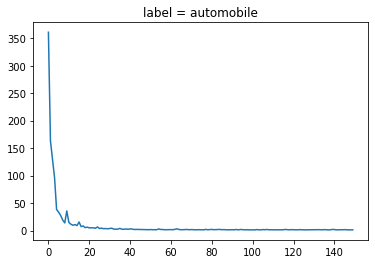

auc =  0.6250067222222222


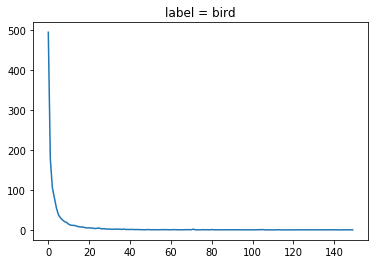

auc =  0.48596799999999996


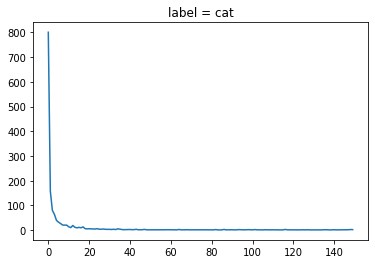

auc =  0.5629352222222223


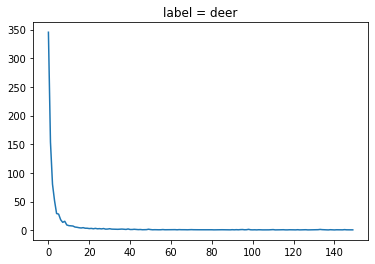

auc =  0.5702222222222222


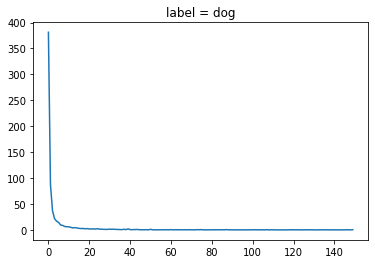

auc =  0.6038654999999999


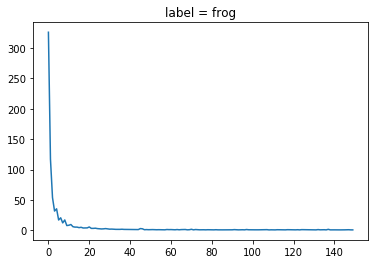

auc =  0.6061444444444445


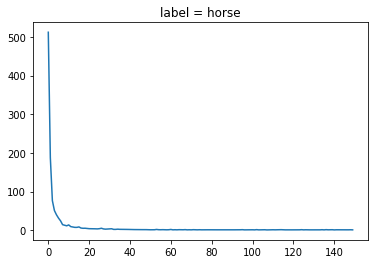

auc =  0.6426584999999999


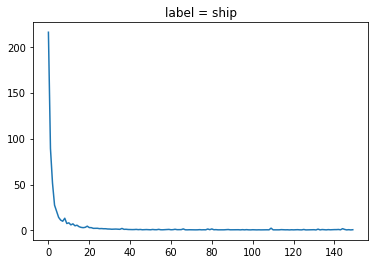

auc =  0.7560492222222223


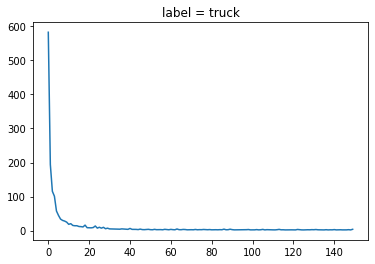

auc =  0.7036185


In [16]:
objective = 'deep-SVDD'
i = 0
nu = 0.2
outlier_nu = 0.2

label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []


for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    SVDD.train(x_train, n_epochs = 150)
    radius_end =SVDD.train_result(x_train, y_train)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end)
    train_time = time.time() - pre_time
    print('auc = ', test_auc)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)
    i += 1

In [17]:
#nu = 0.1, outlier_nu = 0
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])

label =  airplane
auc =  0.6111125555555555
time =  275.257652759552
label =  automobile
auc =  0.6250067222222222
time =  275.60361790657043
label =  bird
auc =  0.48596799999999996
time =  277.14973497390747
label =  cat
auc =  0.5629352222222223
time =  273.7540979385376
label =  deer
auc =  0.5702222222222222
time =  272.65789818763733
label =  dog
auc =  0.6038654999999999
time =  276.3501138687134
label =  frog
auc =  0.6061444444444445
time =  274.9843957424164
label =  horse
auc =  0.6426584999999999
time =  275.0745930671692
label =  ship
auc =  0.7560492222222223
time =  274.90266013145447
label =  truck
auc =  0.7036185
time =  275.2058744430542


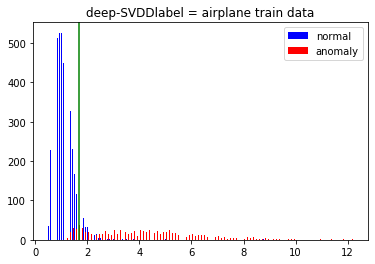

 train label = airplane uncertain_img


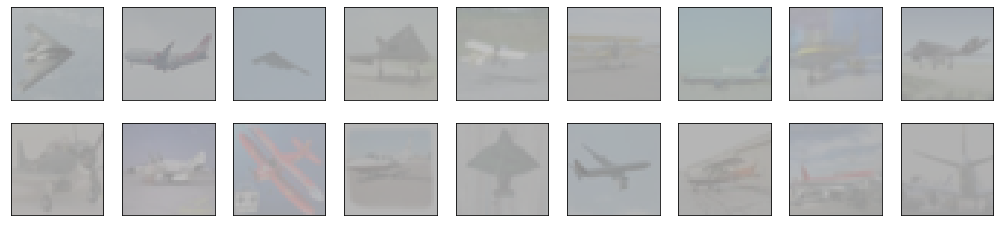

train label = airplane distance oder


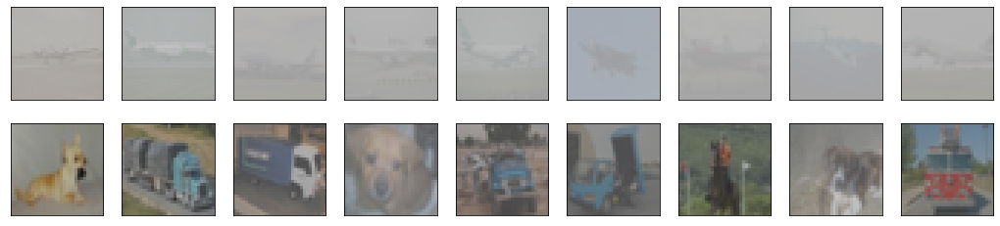

train label = airplane false_img


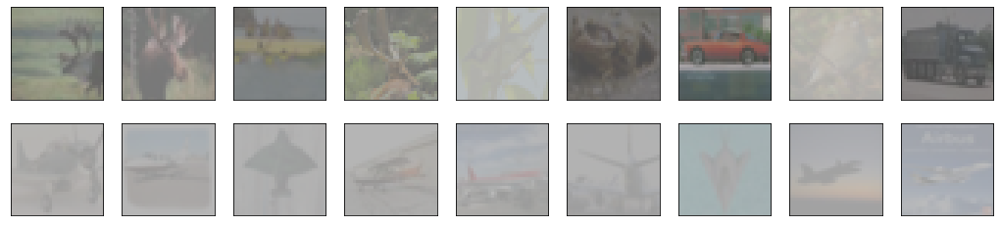

AUC: 0.6107581666666666
confusion_matrix:
[[ 561 8439]
 [  67  933]]


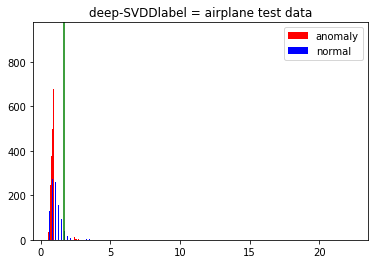

test label = airplane uncertain_img


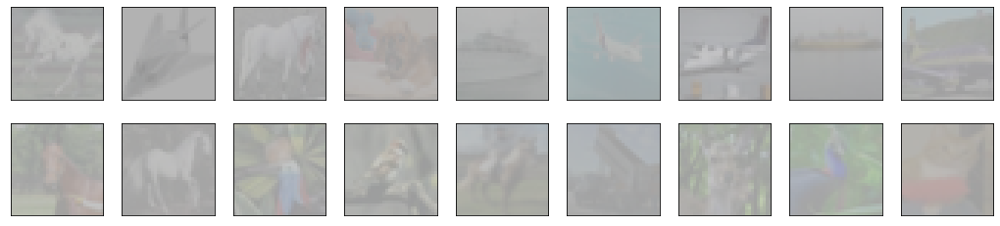

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


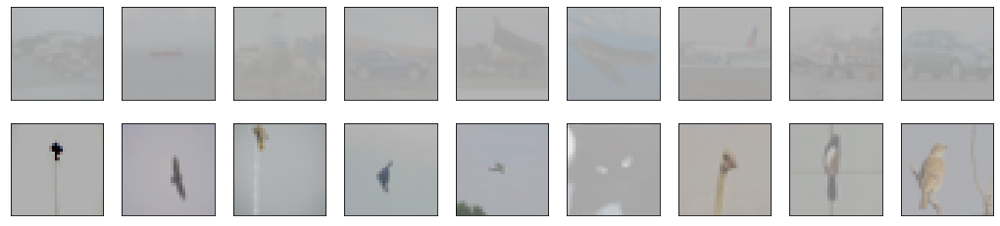

test label = airplane false_img


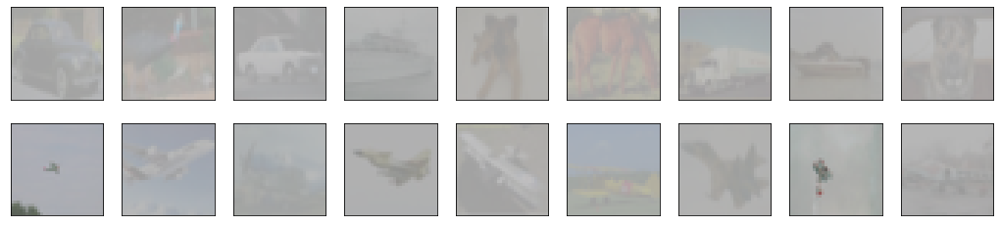

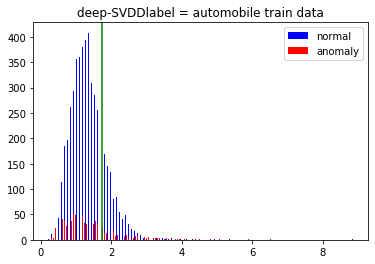

 train label = automobile uncertain_img


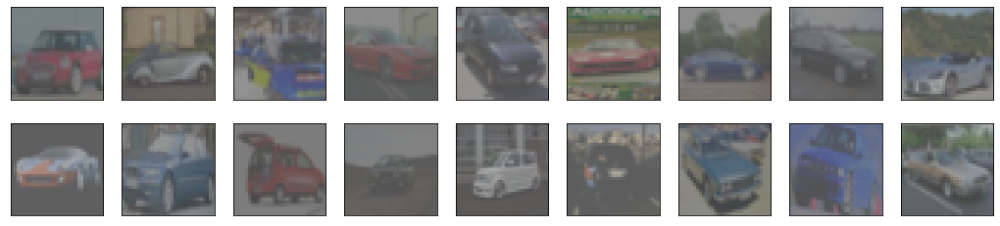

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = automobile distance oder


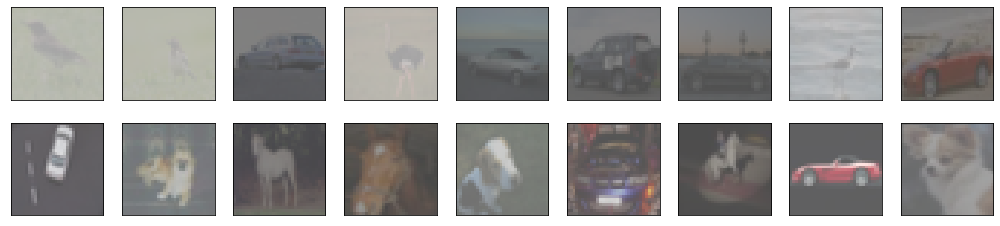

train label = automobile false_img


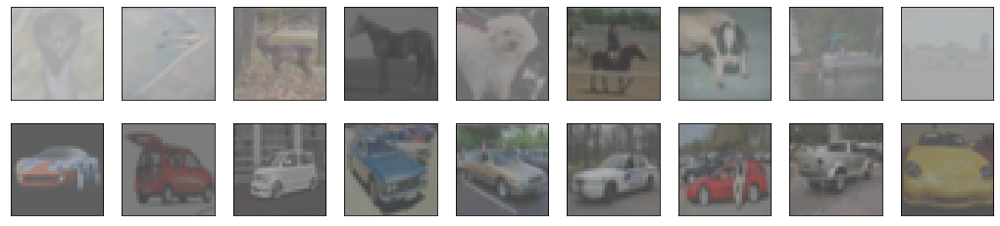

AUC: 0.6287252222222223
confusion_matrix:
[[3723 5277]
 [ 234  766]]


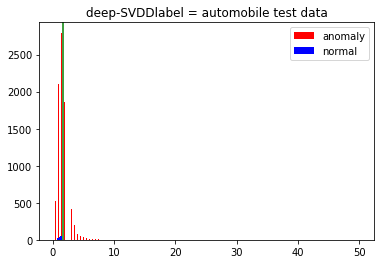

test label = automobile uncertain_img


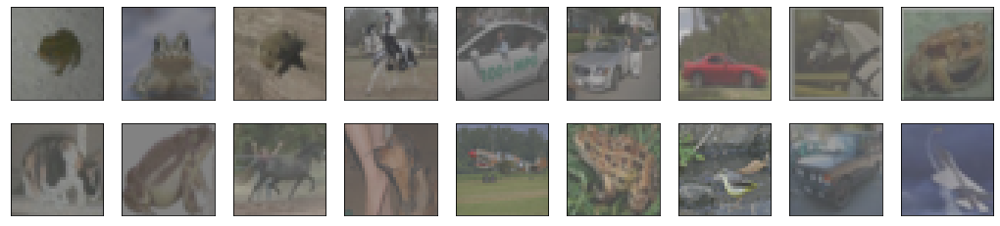

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


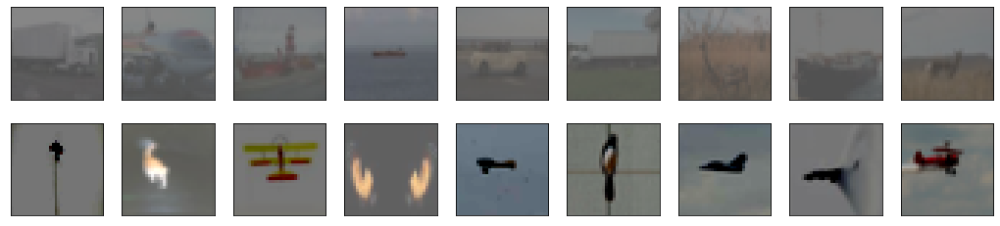

test label = automobile false_img


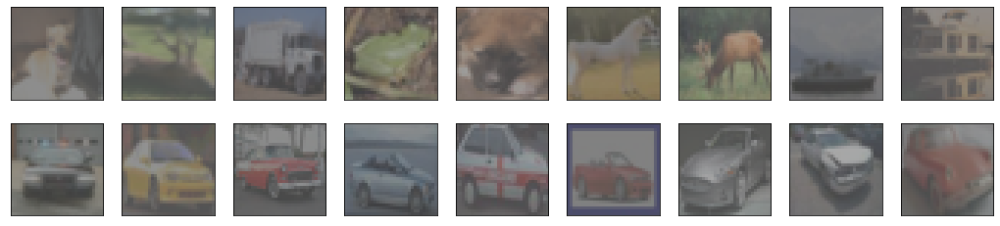

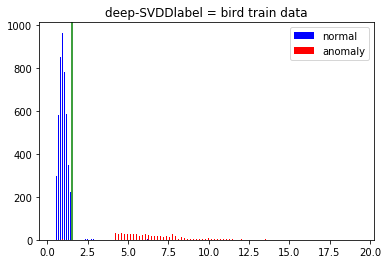

 train label = bird uncertain_img


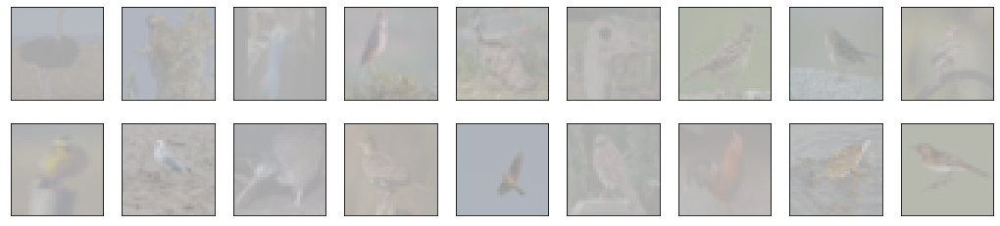

train label = bird distance oder


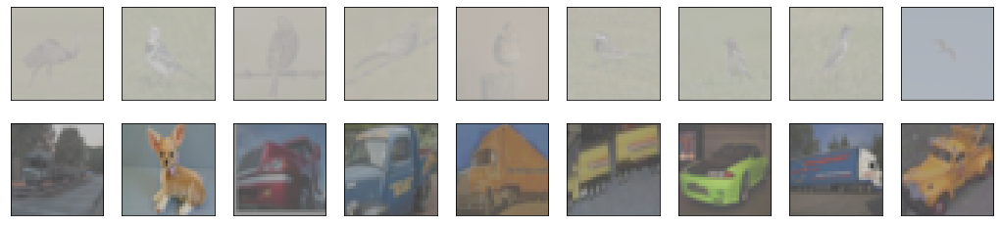

train label = bird false_img


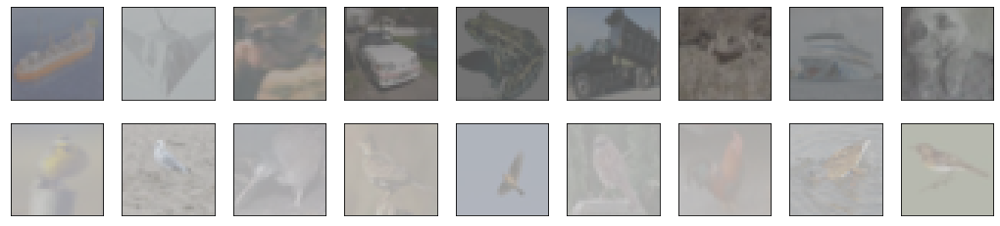

AUC: 0.47772349999999997
confusion_matrix:
[[ 316 8684]
 [  47  953]]


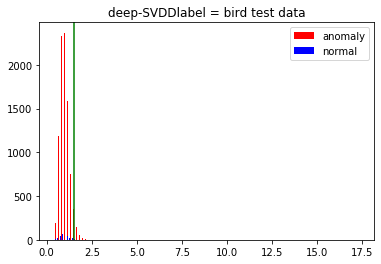

test label = bird uncertain_img


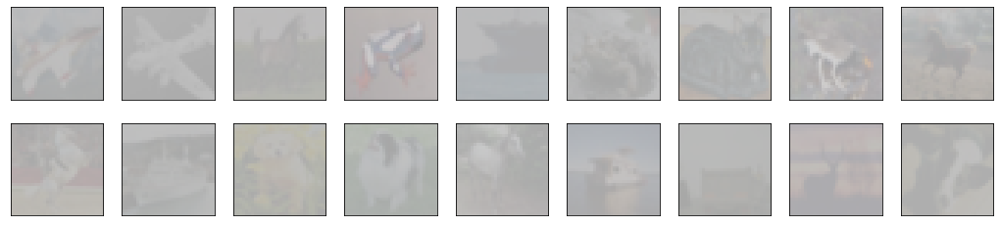

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


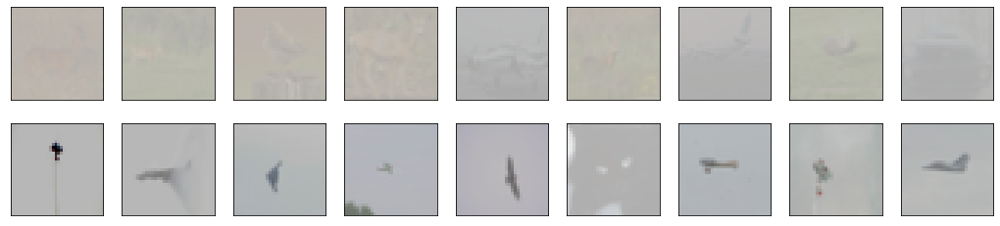

test label = bird false_img


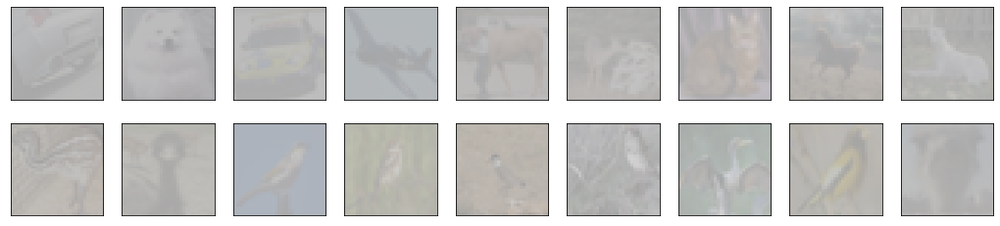

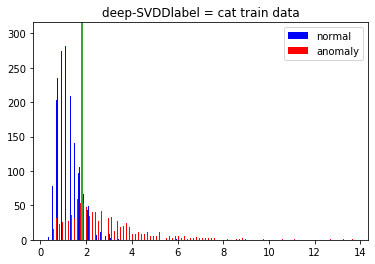

 train label = cat uncertain_img


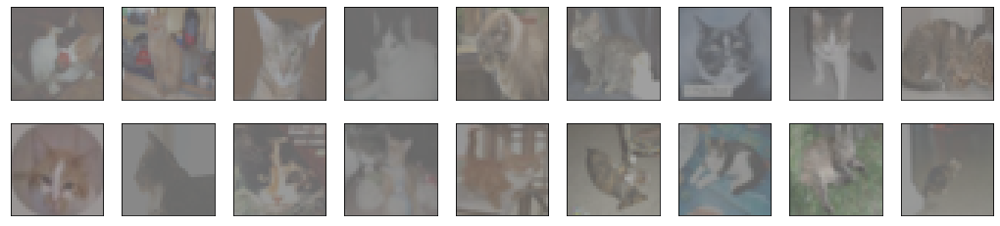

train label = cat distance oder


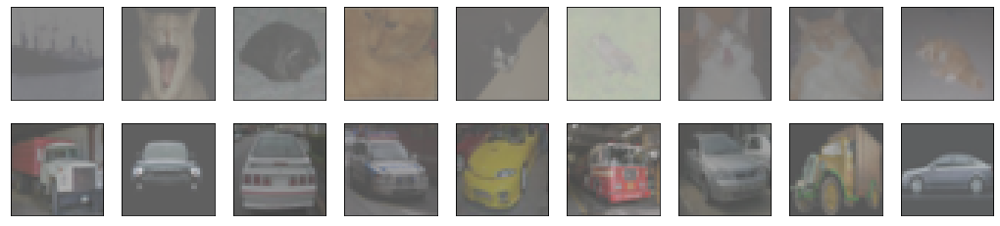

train label = cat false_img


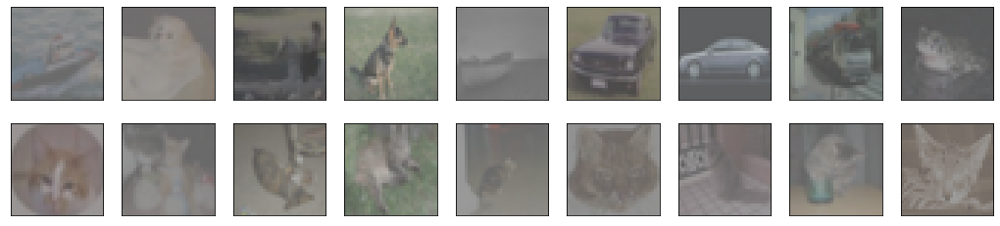

AUC: 0.5694650000000001
confusion_matrix:
[[1792 7208]
 [ 134  866]]


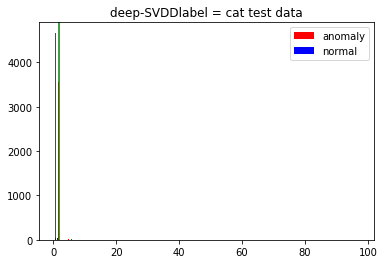

test label = cat uncertain_img


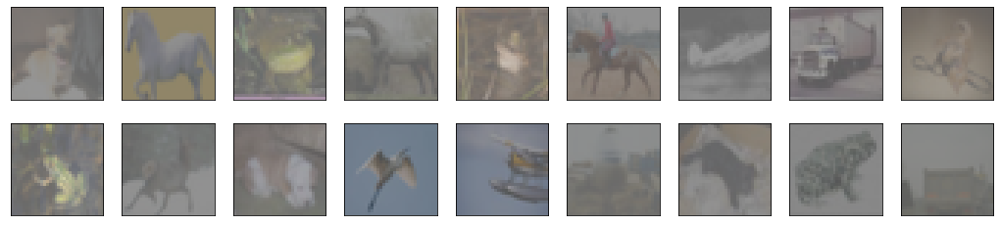

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


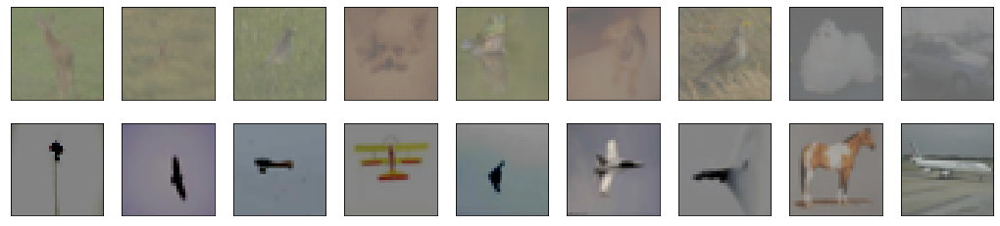

test label = cat false_img


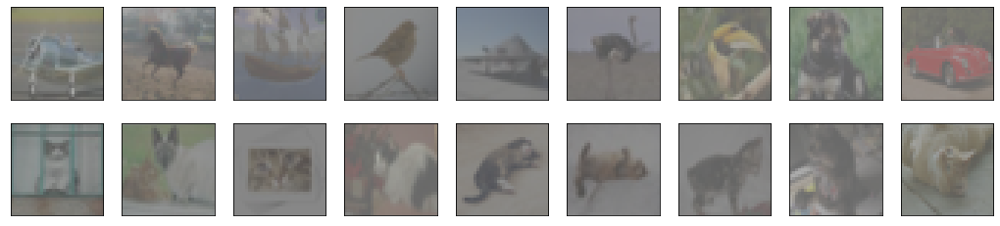

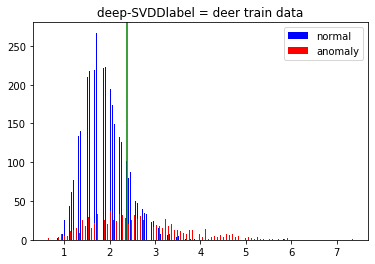

 train label = deer uncertain_img


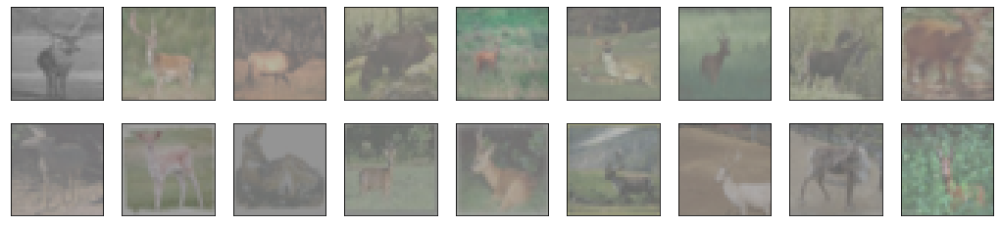

train label = deer distance oder


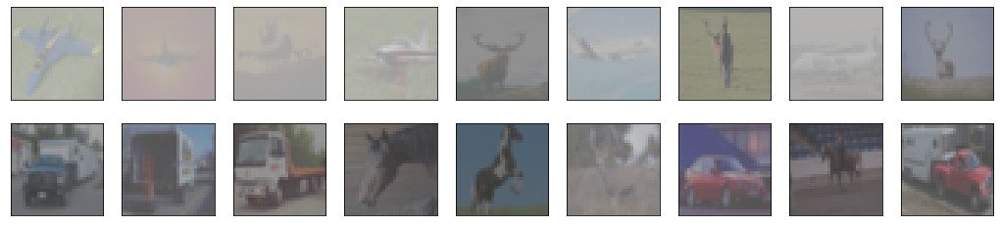

train label = deer false_img


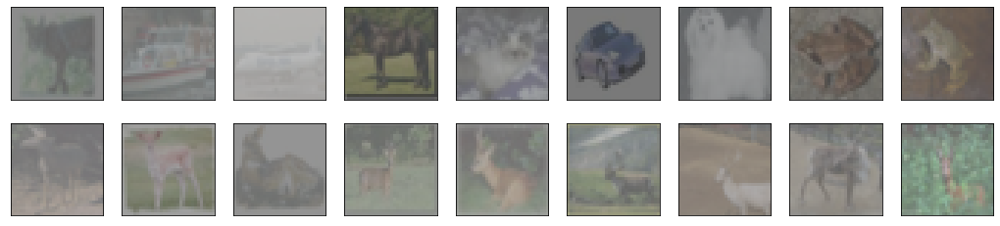

AUC: 0.5108512222222222
confusion_matrix:
[[1687 7313]
 [ 178  822]]


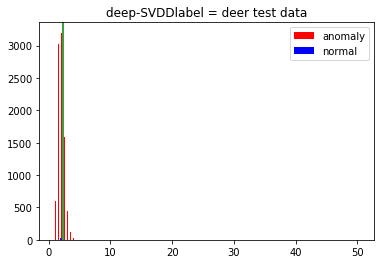

test label = deer uncertain_img


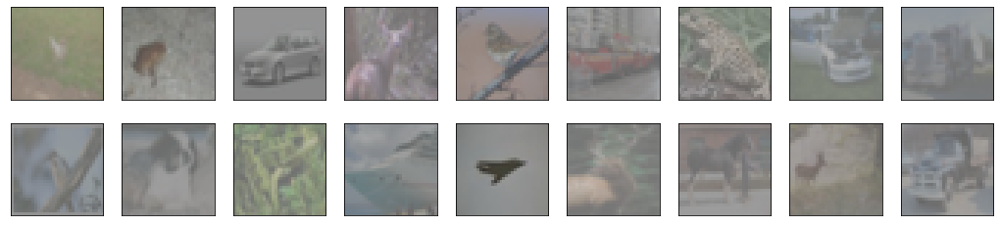

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


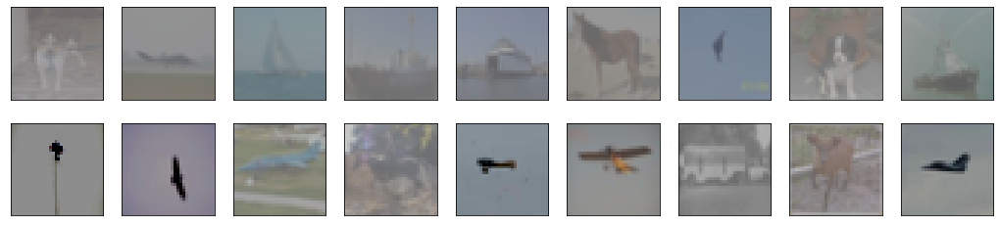

test label = deer false_img


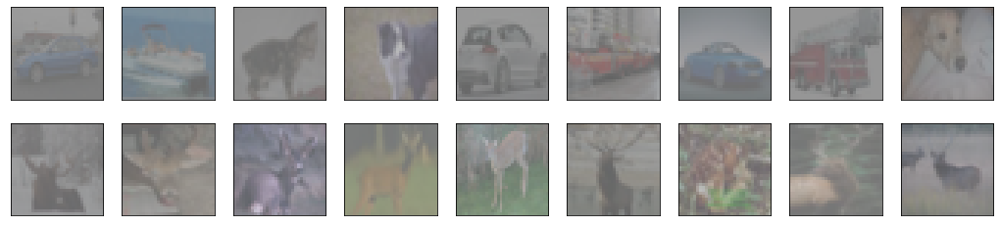

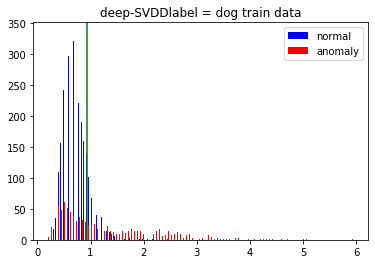

 train label = dog uncertain_img


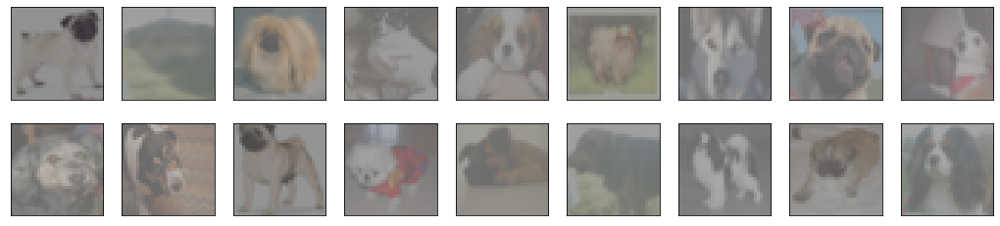

train label = dog distance oder


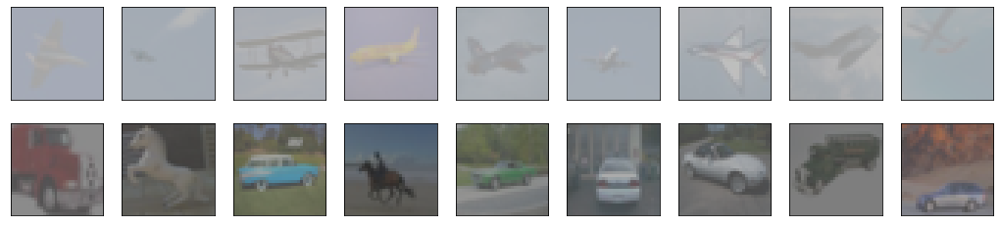

train label = dog false_img


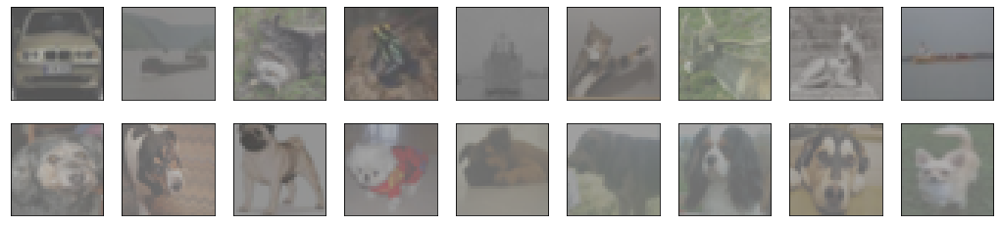

AUC: 0.6055378888888889
confusion_matrix:
[[2321 6679]
 [ 176  824]]


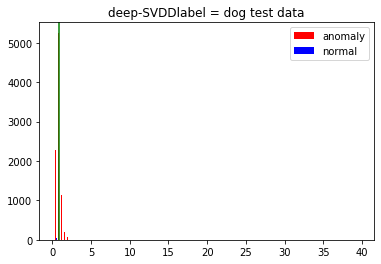

test label = dog uncertain_img


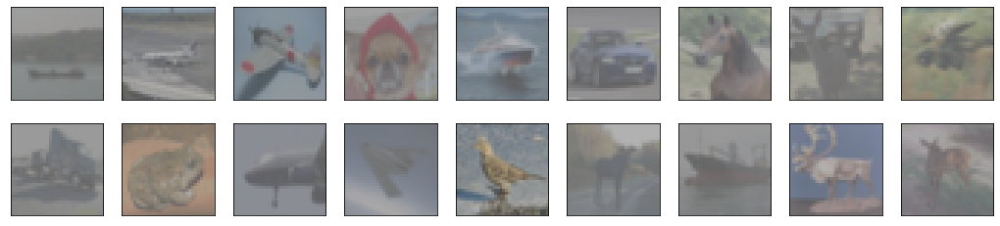

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = dog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


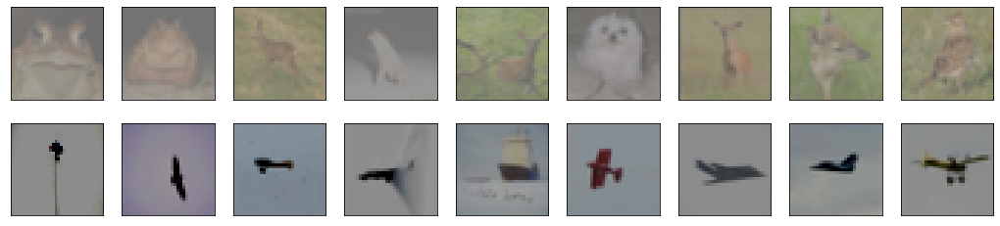

test label = dog false_img


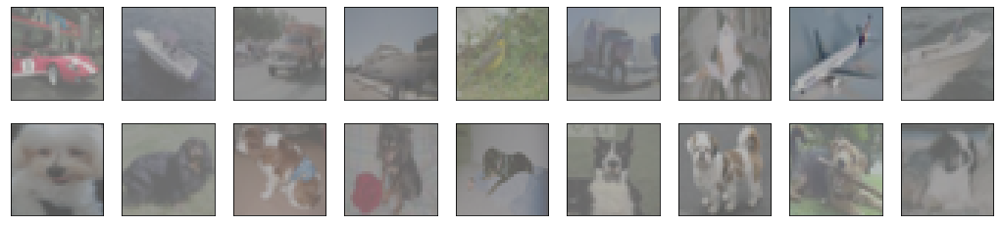

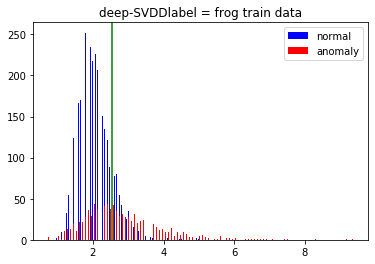

 train label = frog uncertain_img


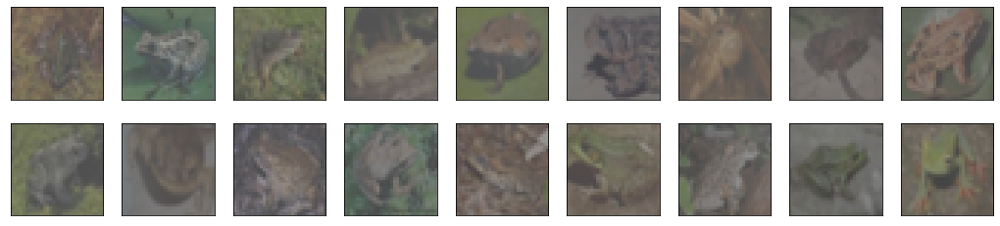

train label = frog distance oder


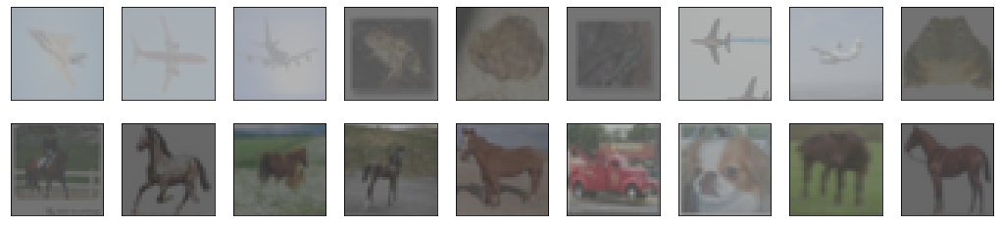

train label = frog false_img


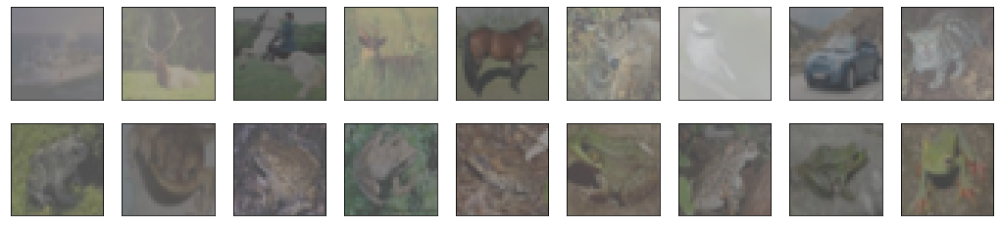

AUC: 0.522350388888889
confusion_matrix:
[[1462 7538]
 [ 152  848]]


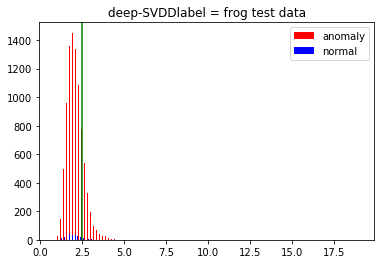

test label = frog uncertain_img


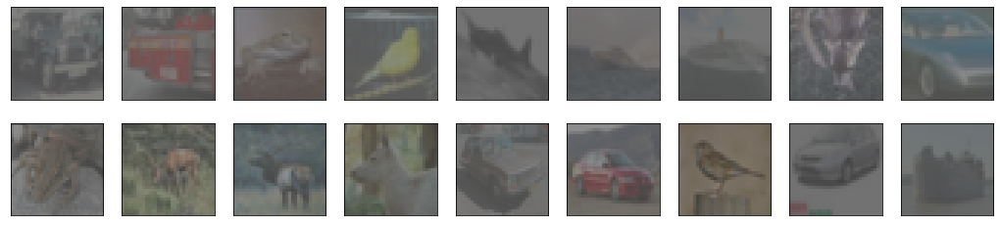

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


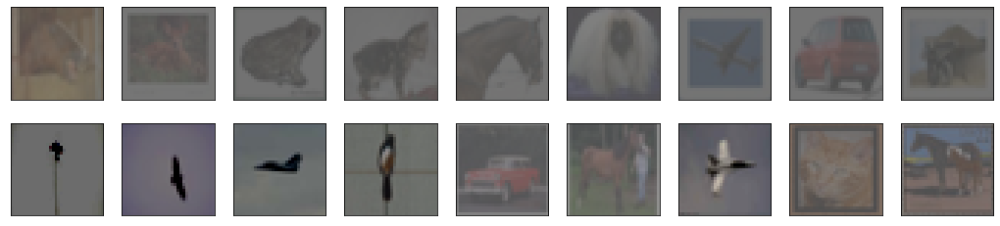

test label = frog false_img


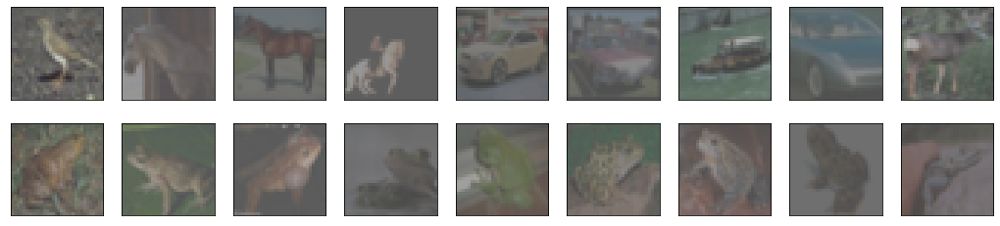

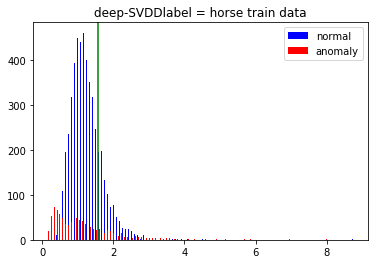

 train label = horse uncertain_img


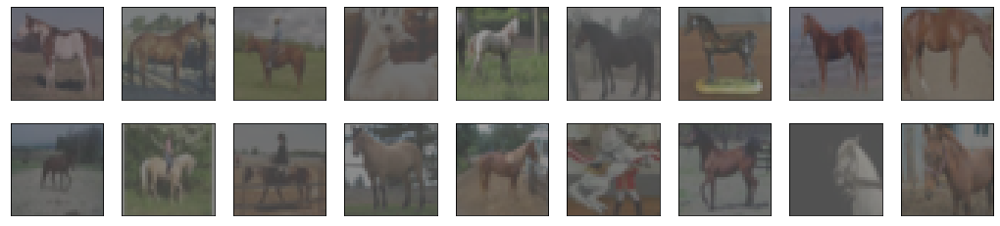

train label = horse distance oder


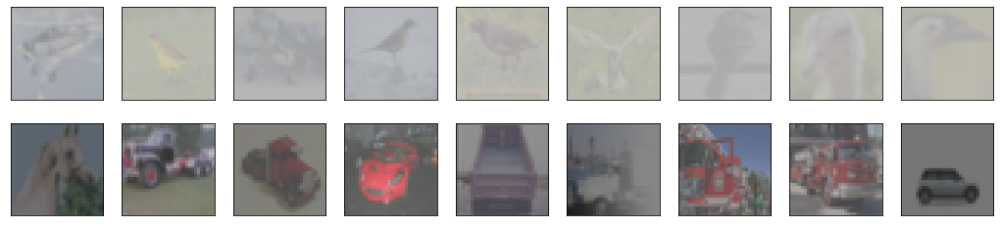

train label = horse false_img


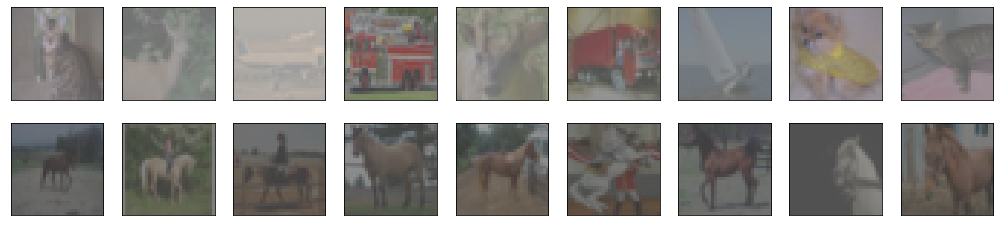

AUC: 0.6514448333333334
confusion_matrix:
[[3738 5262]
 [ 206  794]]


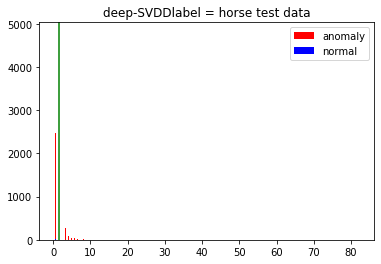

test label = horse uncertain_img


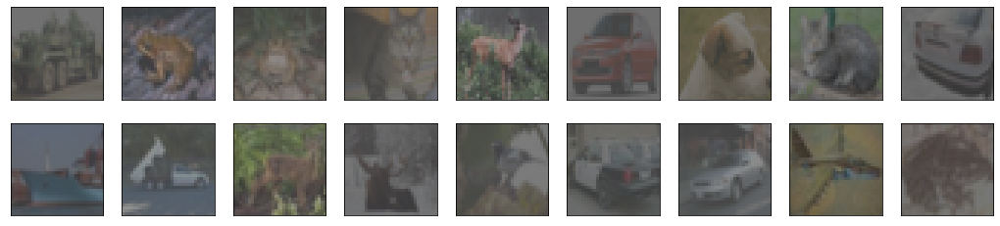

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


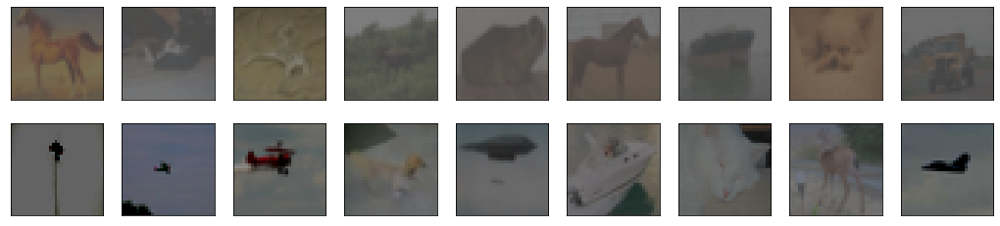

test label = horse false_img


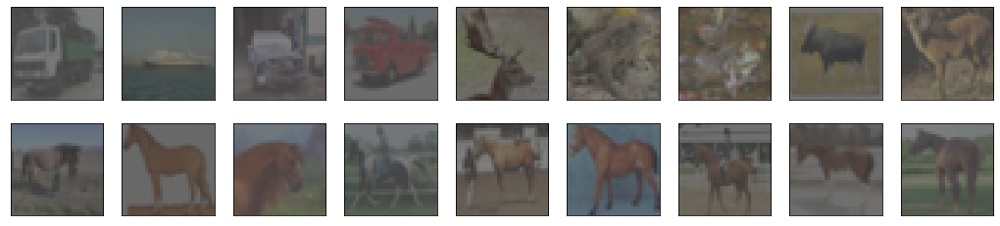

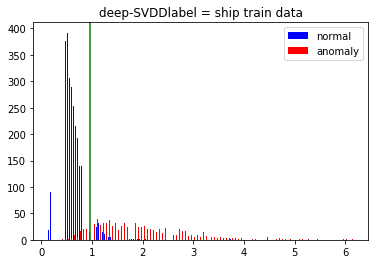

 train label = ship uncertain_img


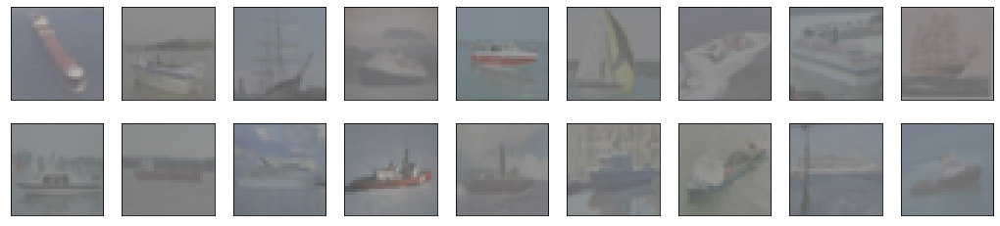

train label = ship distance oder


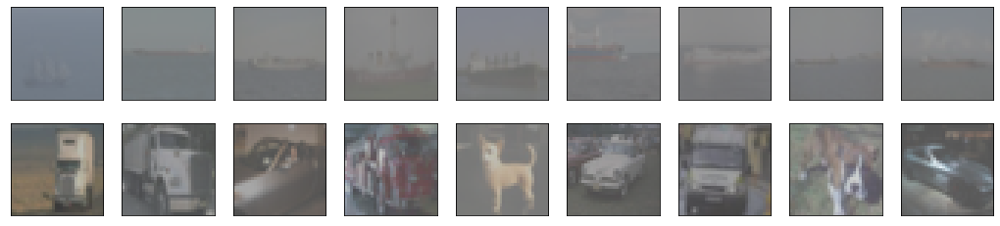

train label = ship false_img


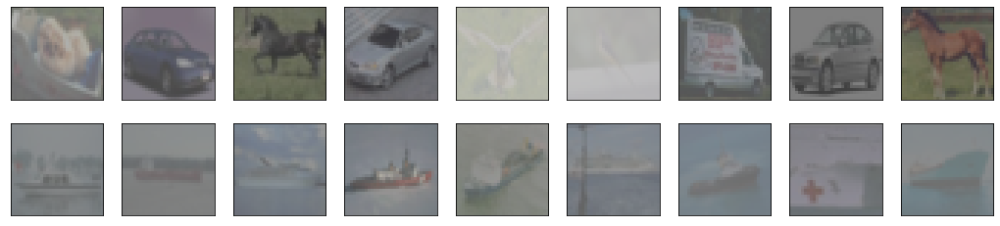

AUC: 0.7419428888888889
confusion_matrix:
[[1609 7391]
 [  59  941]]


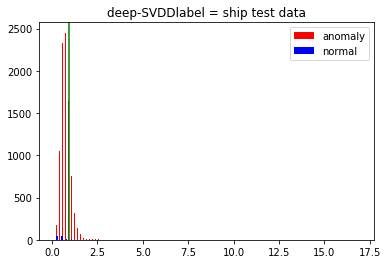

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship uncertain_img


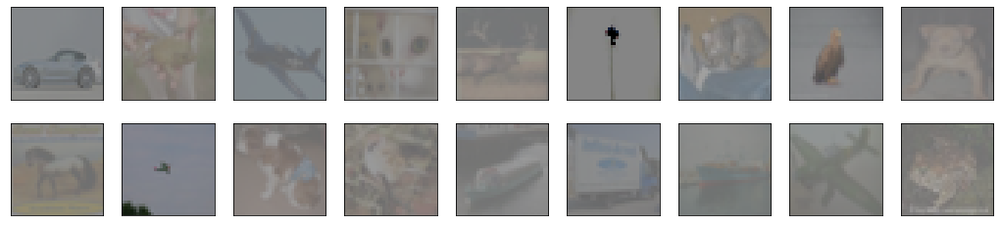

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


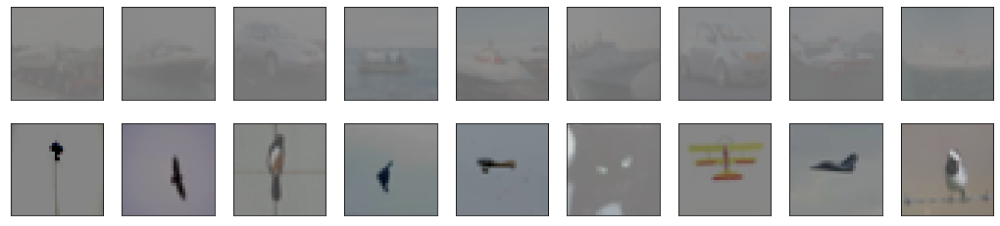

test label = ship false_img


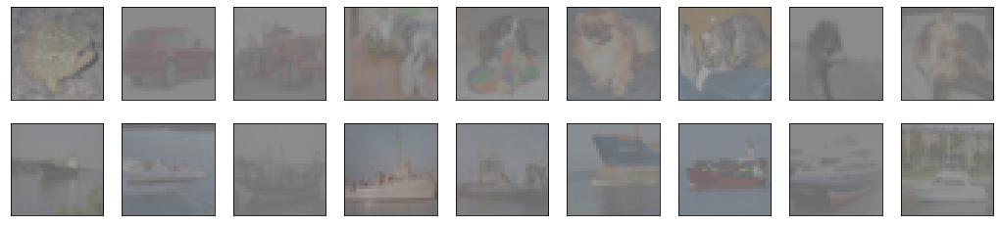

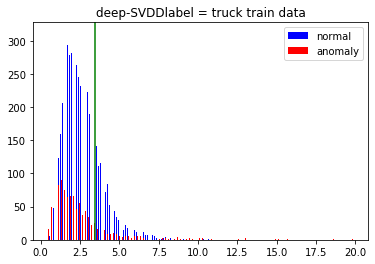

 train label = truck uncertain_img


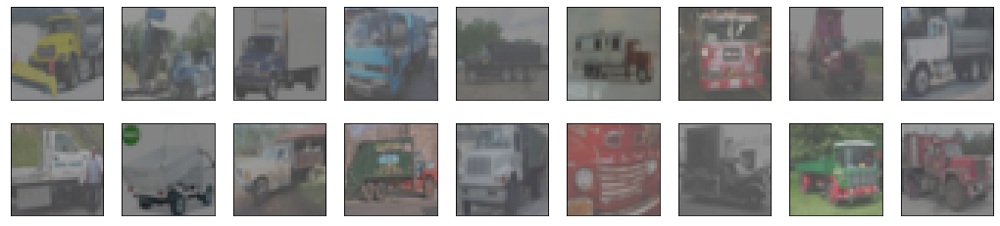

train label = truck distance oder


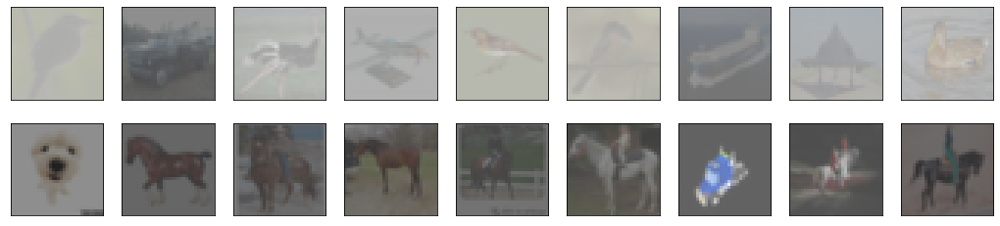

train label = truck false_img


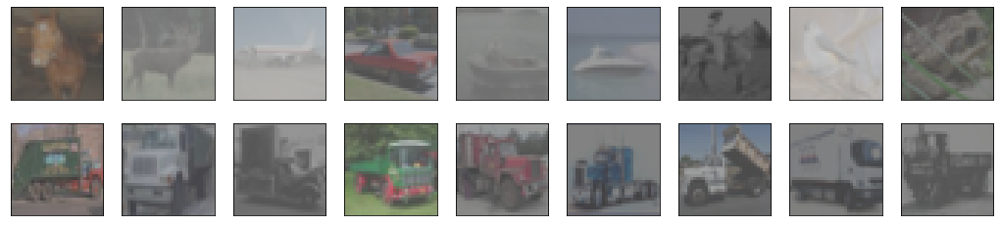

AUC: 0.6779580555555555
confusion_matrix:
[[4242 4758]
 [ 233  767]]


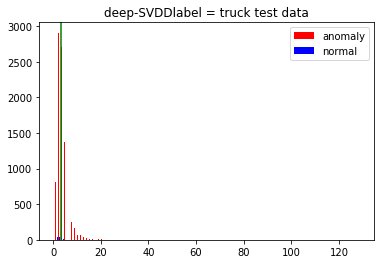

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck uncertain_img


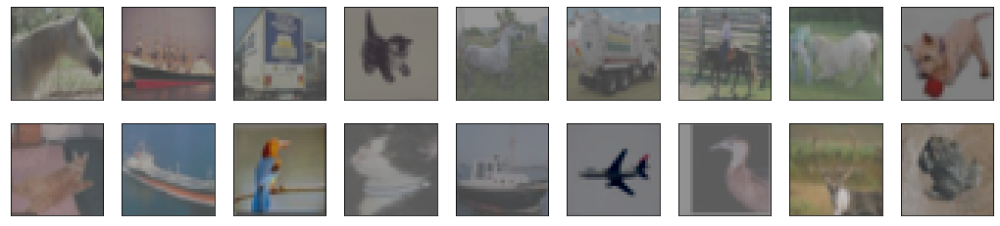

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


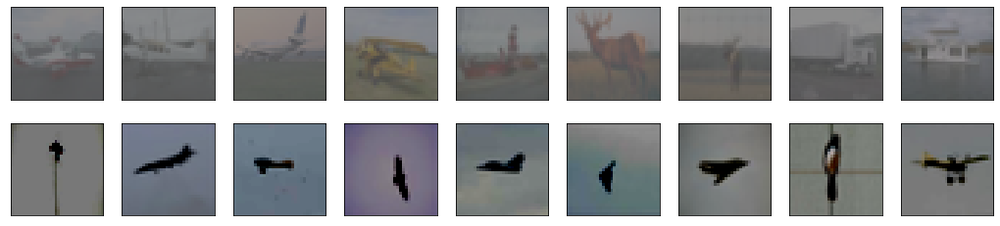

test label = truck false_img


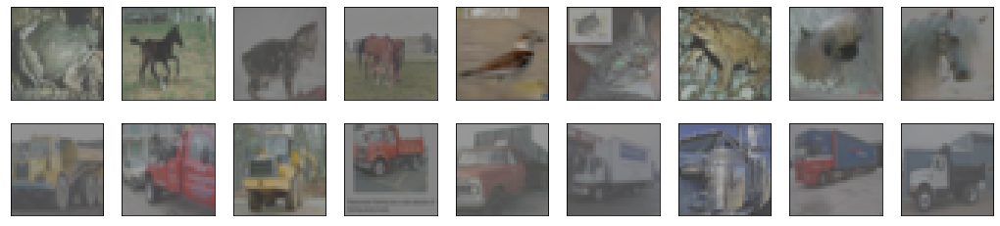

In [18]:
objective = 'deep-SVDD'
i = 0
nu = 0.2
outlier_nu = 0.2

for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    radius_end =SVDD.train_result(x_train, y_train, show_img = True, load_model = True)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end, show_img = True, load_model = True)

    i += 1

## outlier = 0.3

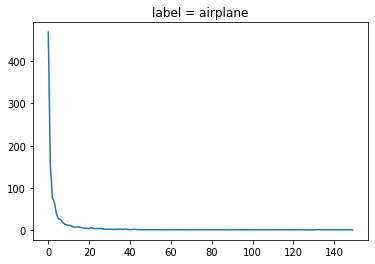

auc =  0.6043449444444445


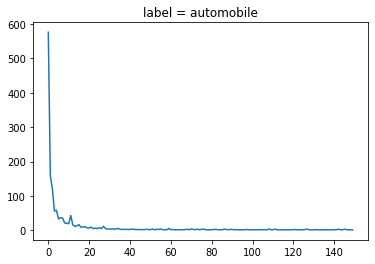

auc =  0.6290345555555555


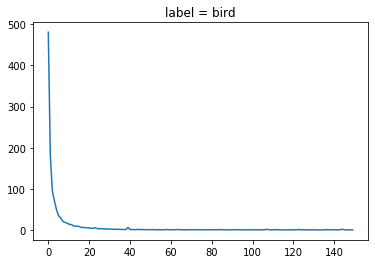

auc =  0.506856


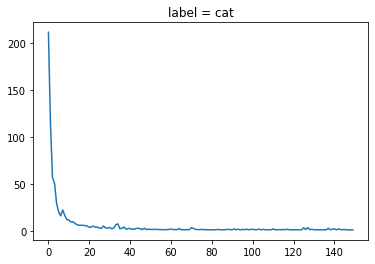

auc =  0.5388562222222222


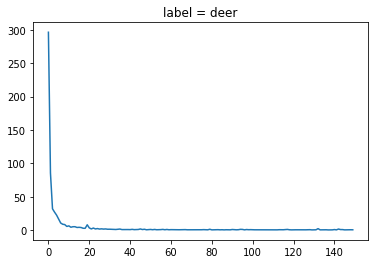

auc =  0.5932992222222222


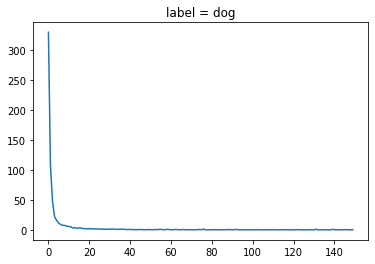

auc =  0.5836156666666666


KeyboardInterrupt: 

In [38]:
objective = 'deep-SVDD'
i = 0
nu = 0.3
outlier_nu = 0.3

label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []


for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    SVDD.train(x_train, n_epochs = 150)
    radius_end =SVDD.train_result(x_train, y_train)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end)
    train_time = time.time() - pre_time
    print('auc = ', test_auc)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)
    i += 1

In [ ]:
#nu = 0.1, outlier_nu = 0
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])

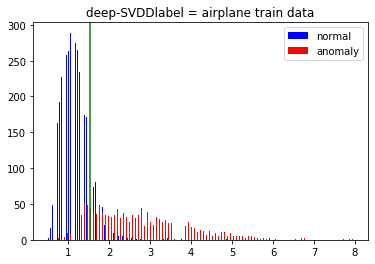

 train label = airplane uncertain_img


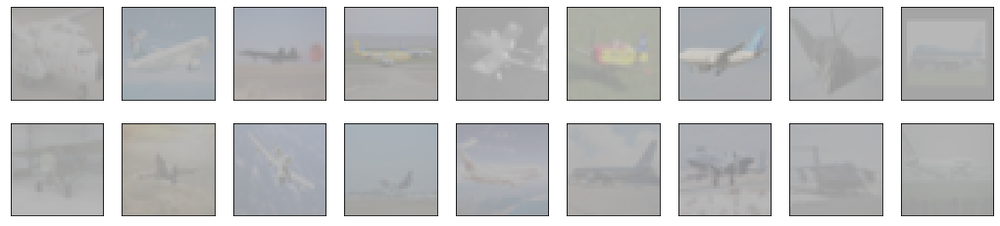

train label = airplane distance oder


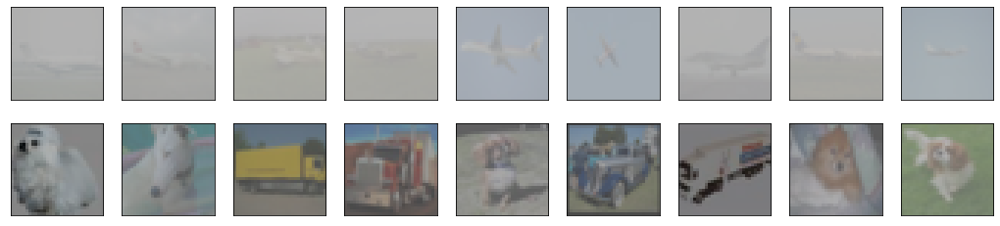

train label = airplane false_img


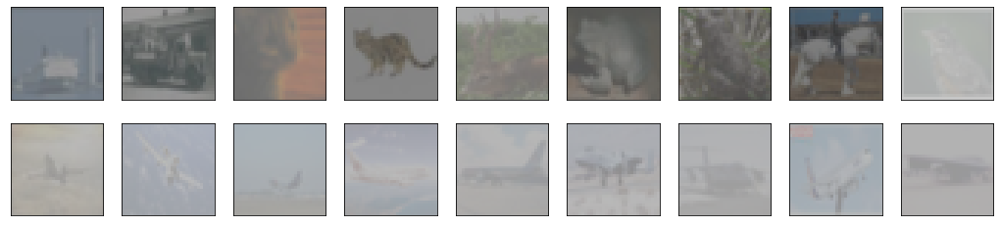

AUC: 0.5805230555555556
confusion_matrix:
[[1467 7533]
 [ 154  846]]


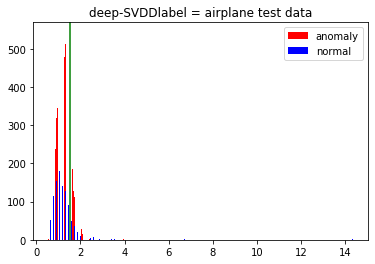

test label = airplane uncertain_img


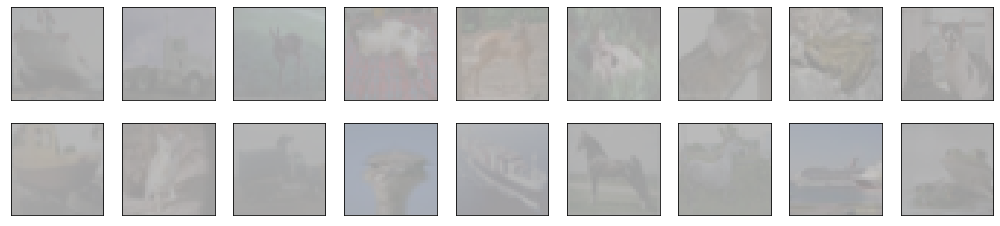

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


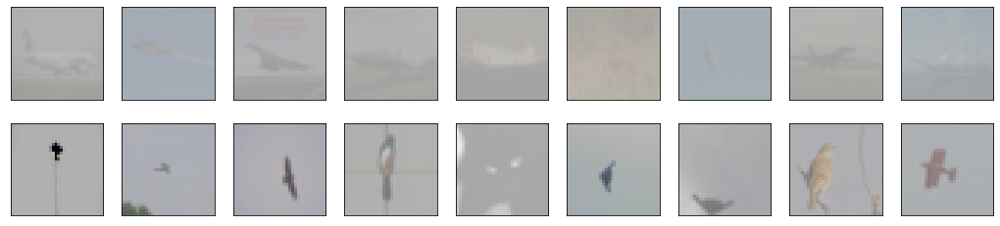

test label = airplane false_img


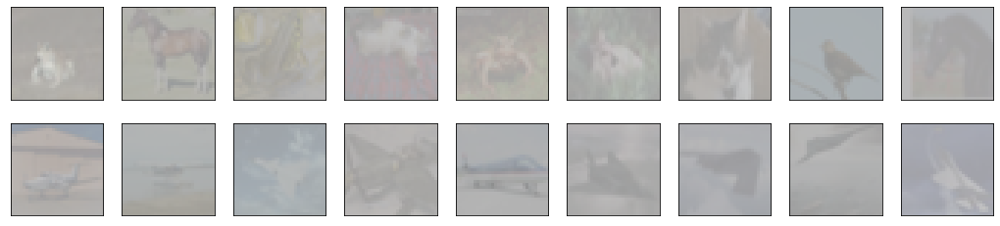

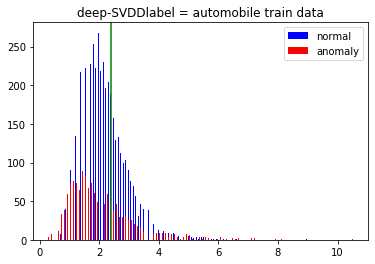

 train label = automobile uncertain_img


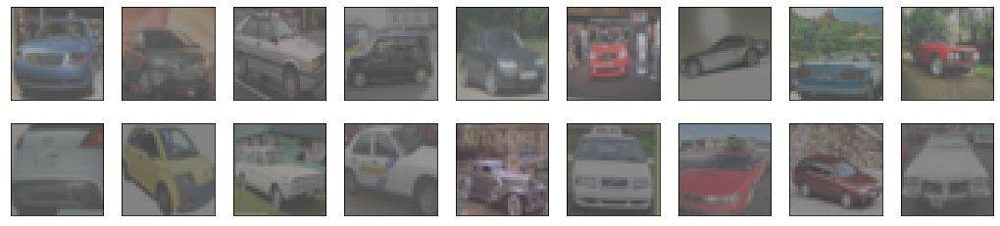

train label = automobile distance oder


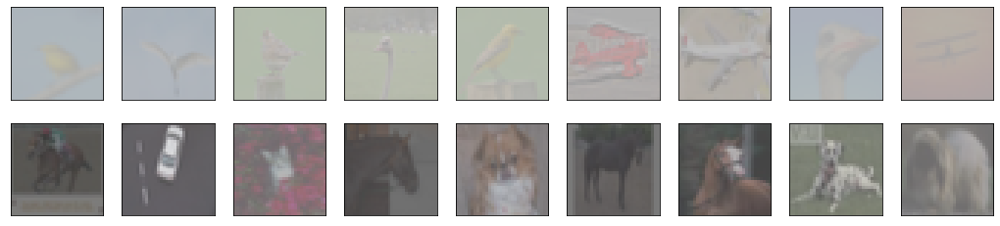

train label = automobile false_img


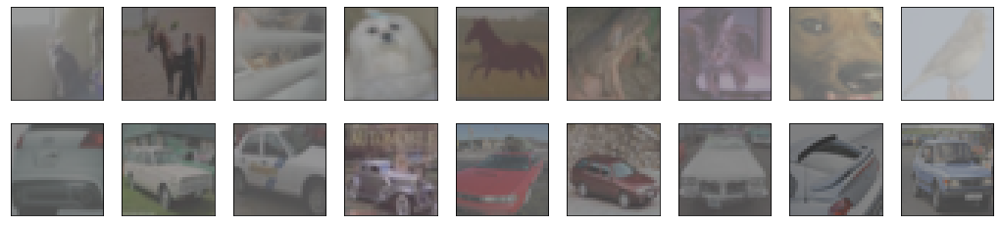

AUC: 0.5503952222222223
confusion_matrix:
[[3673 5327]
 [ 349  651]]


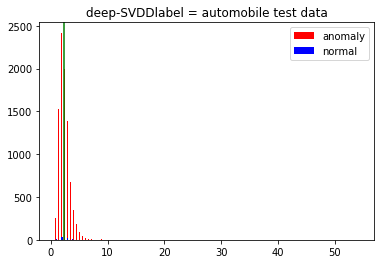

test label = automobile uncertain_img


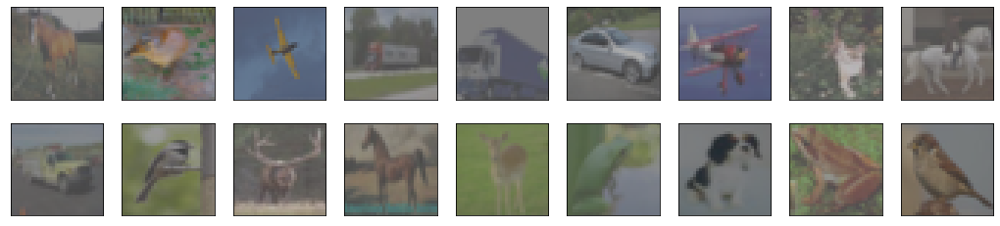

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


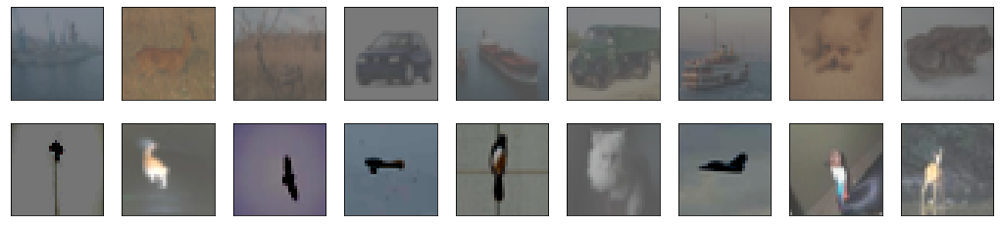

test label = automobile false_img


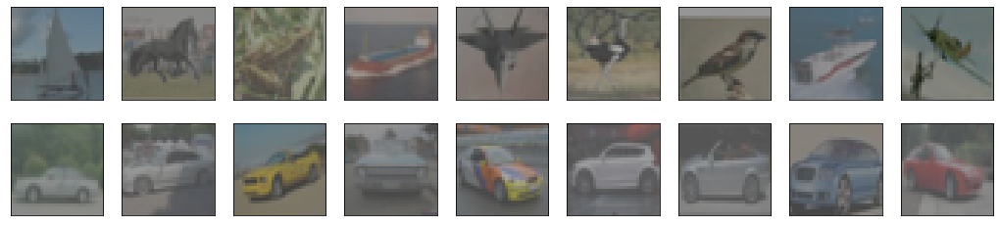

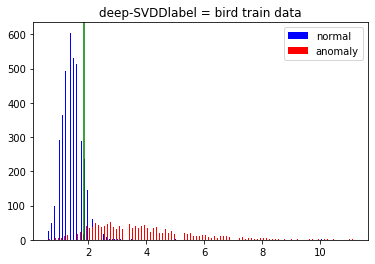

 train label = bird uncertain_img


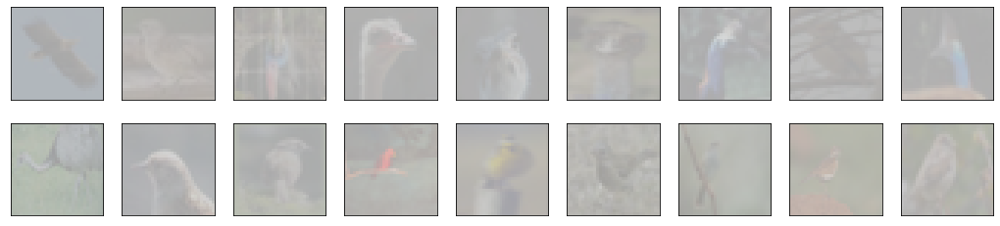

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = bird distance oder


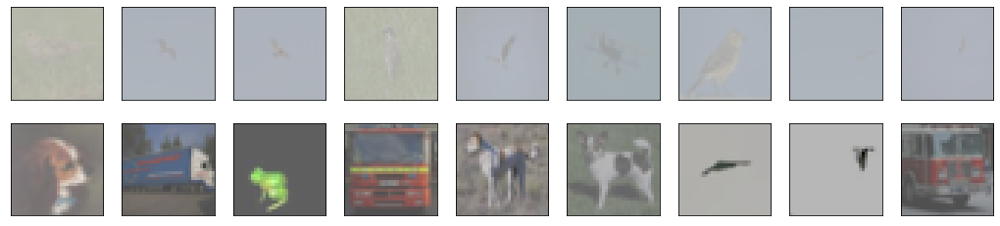

train label = bird false_img


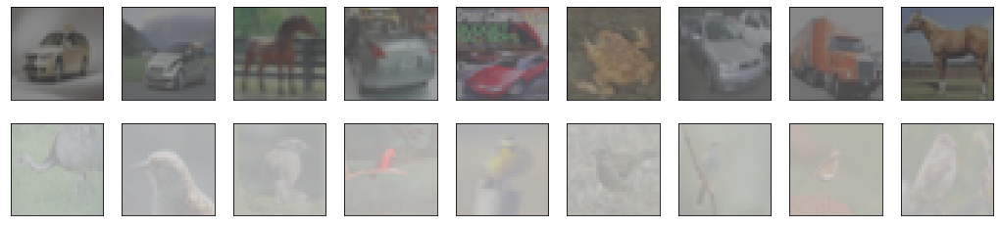

AUC: 0.5541237777777779
confusion_matrix:
[[1209 7791]
 [ 110  890]]


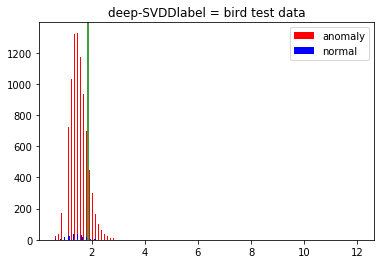

test label = bird uncertain_img


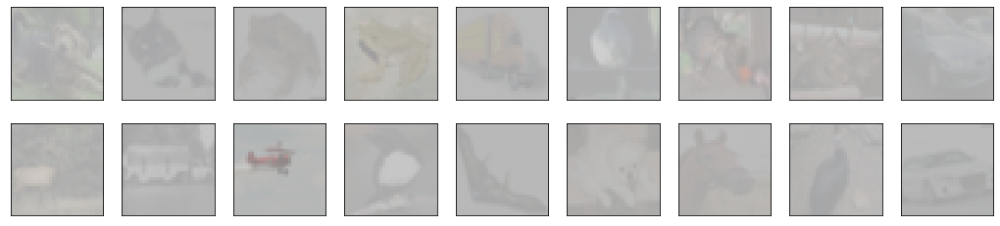

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


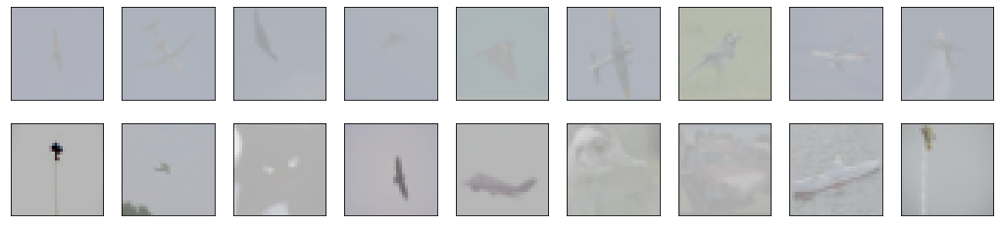

test label = bird false_img


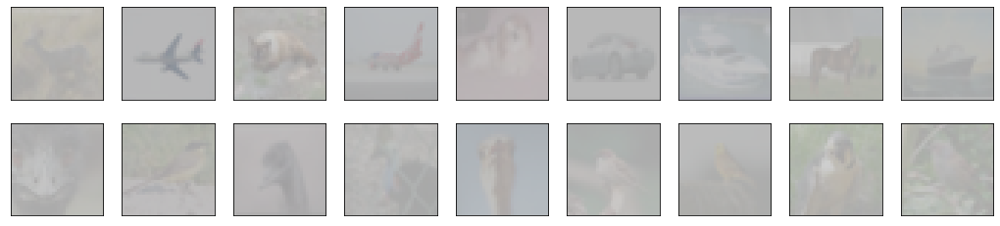

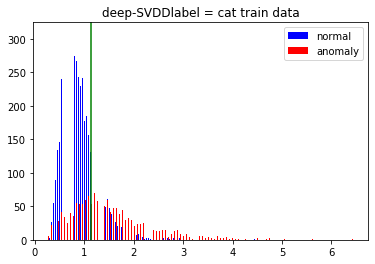

 train label = cat uncertain_img


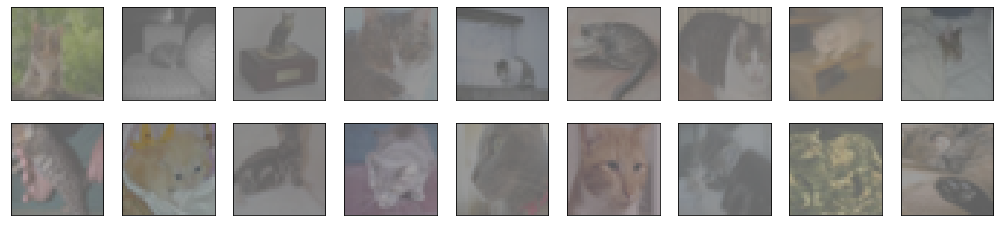

train label = cat distance oder


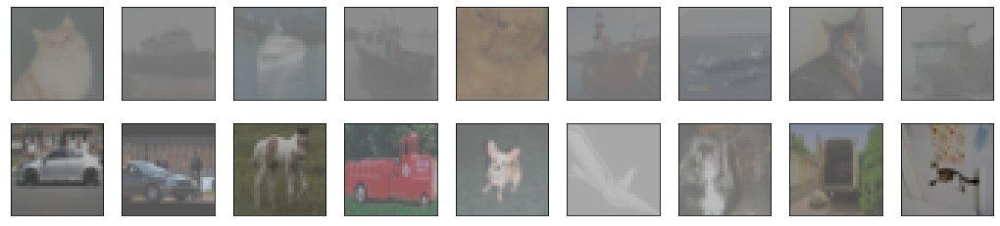

train label = cat false_img


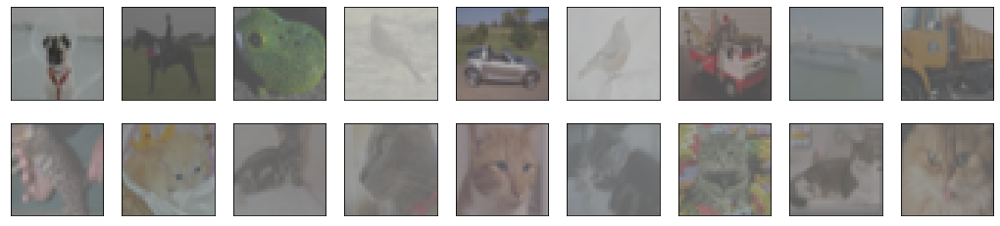

AUC: 0.5435961111111112
confusion_matrix:
[[2750 6250]
 [ 236  764]]


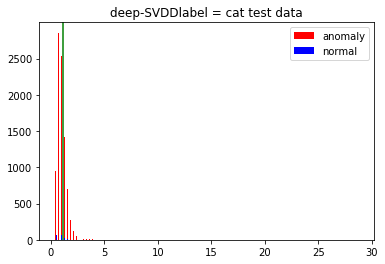

test label = cat uncertain_img


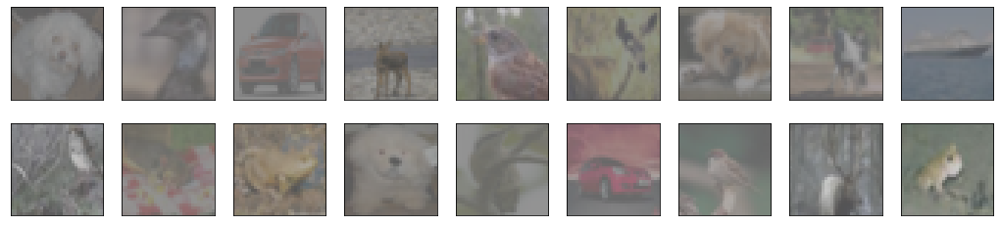

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


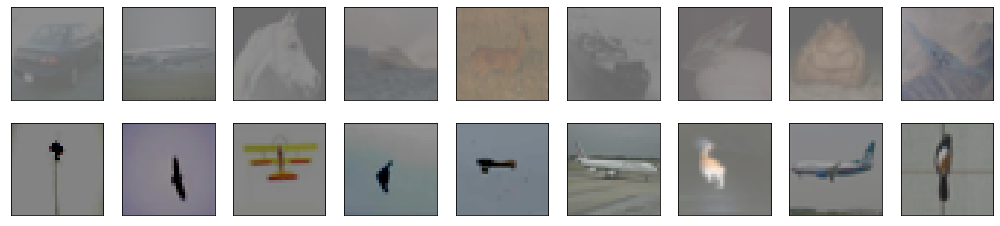

test label = cat false_img


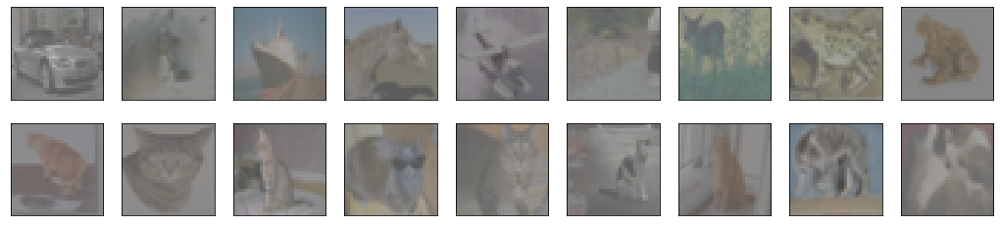

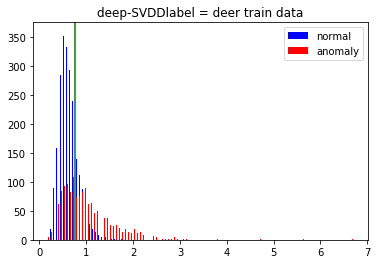

 train label = deer uncertain_img


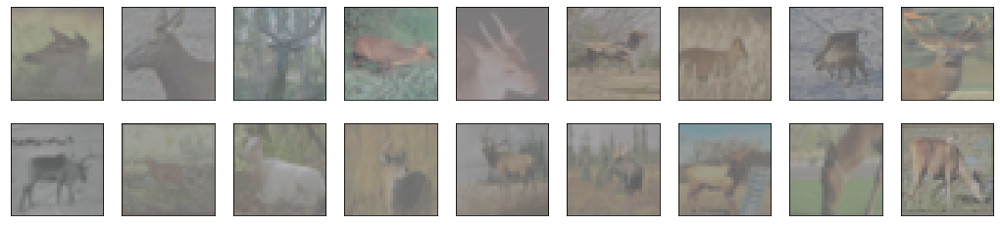

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = deer distance oder


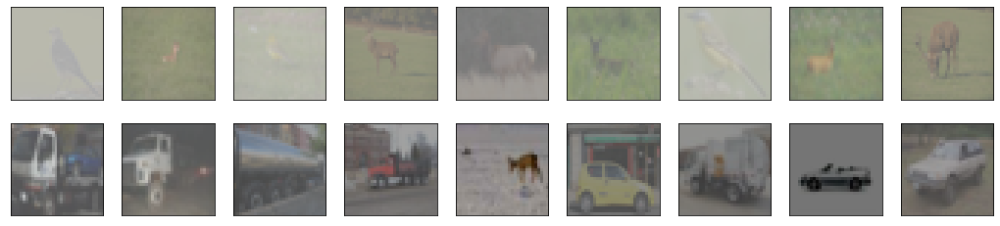

train label = deer false_img


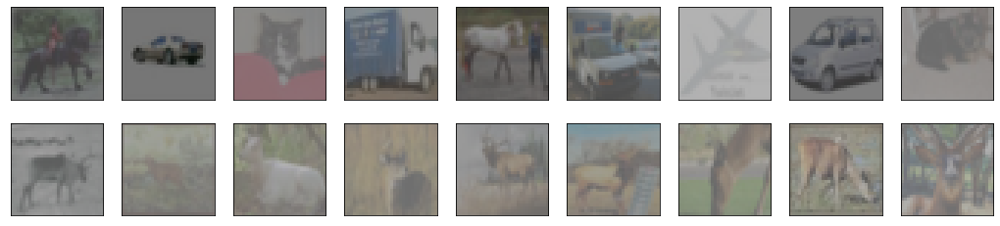

AUC: 0.6027295
confusion_matrix:
[[3150 5850]
 [ 241  759]]


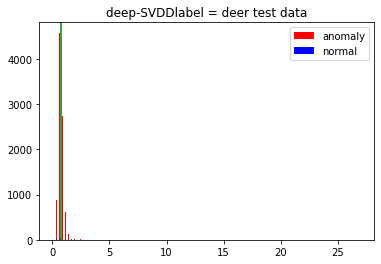

test label = deer uncertain_img


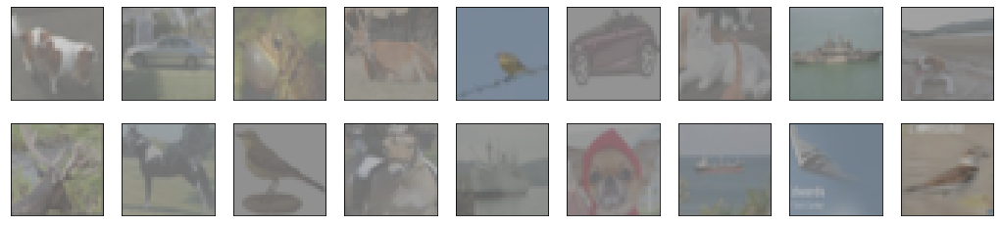

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


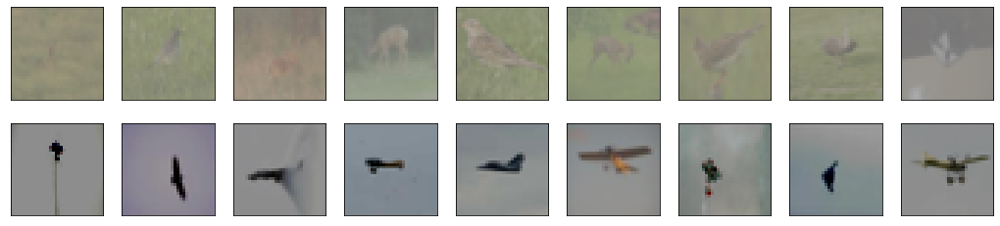

test label = deer false_img


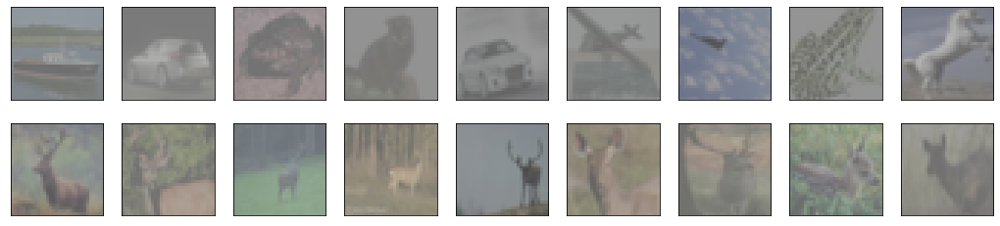

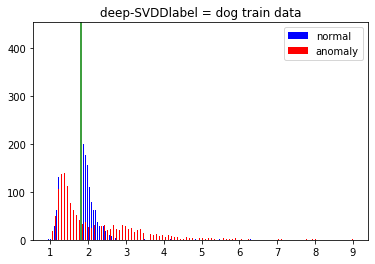

 train label = dog uncertain_img


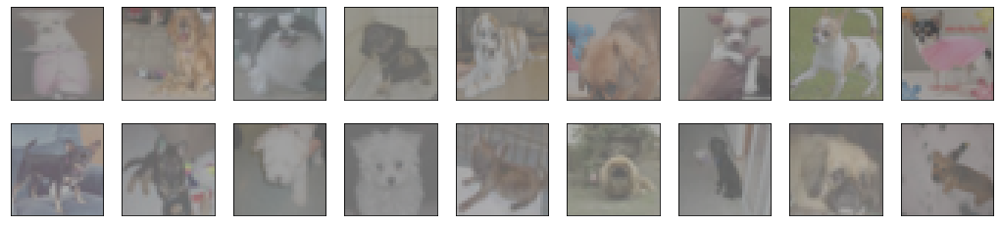

train label = dog distance oder


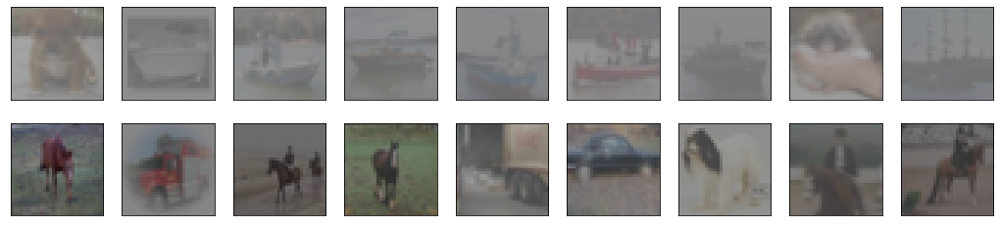

train label = dog false_img


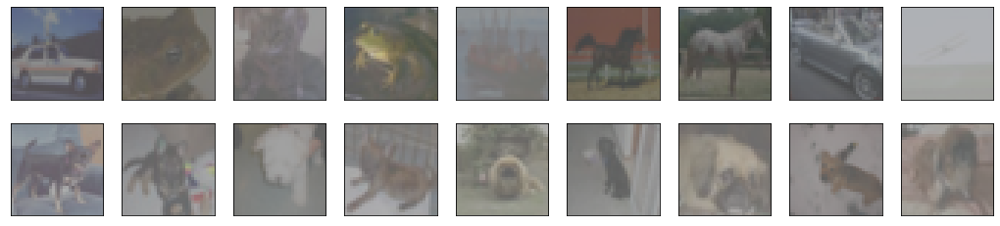

AUC: 0.5468763333333333
confusion_matrix:
[[2857 6143]
 [ 267  733]]


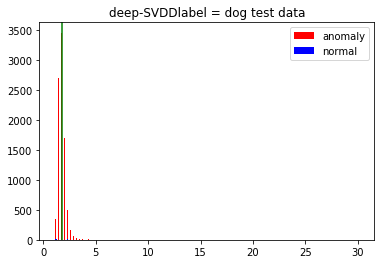

test label = dog uncertain_img


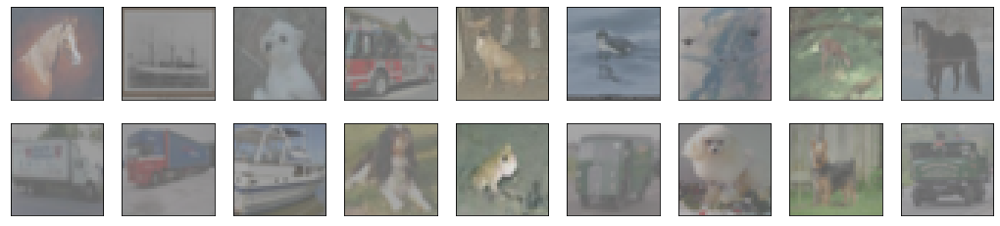

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = dog distance oder


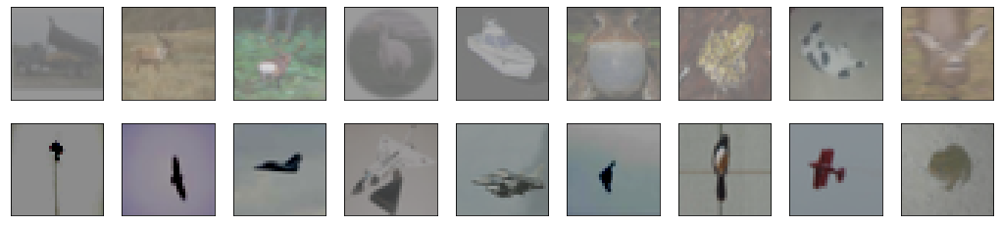

test label = dog false_img


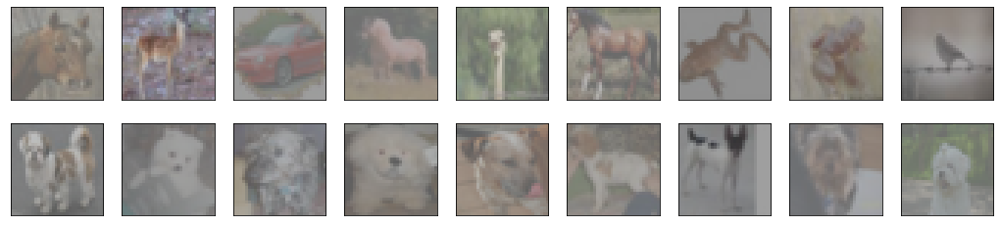

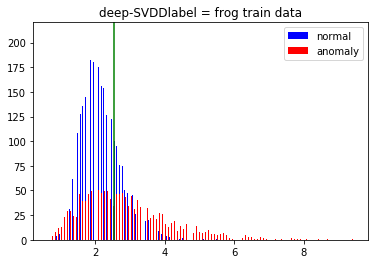

 train label = frog uncertain_img


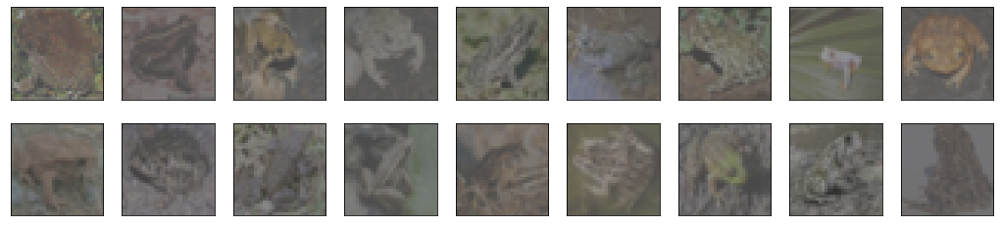

train label = frog distance oder


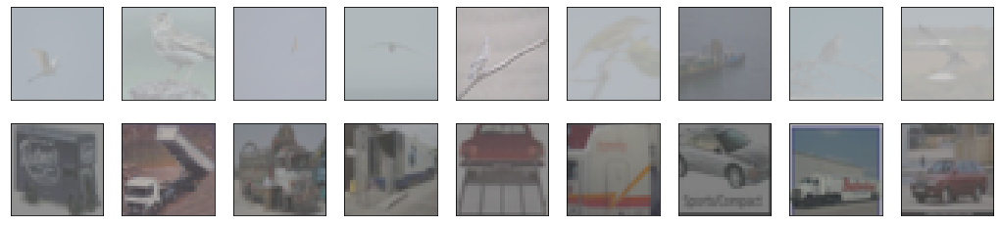

train label = frog false_img


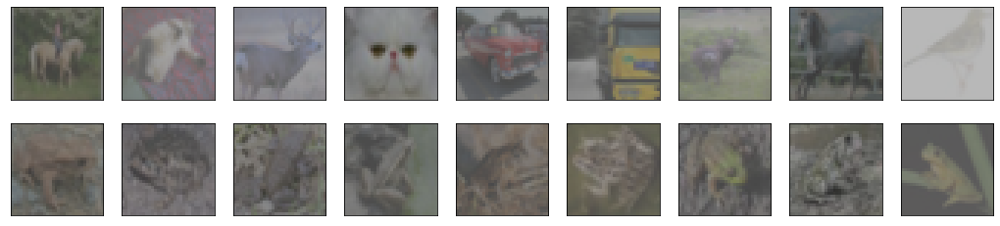

AUC: 0.5225378888888889
confusion_matrix:
[[2639 6361]
 [ 227  773]]


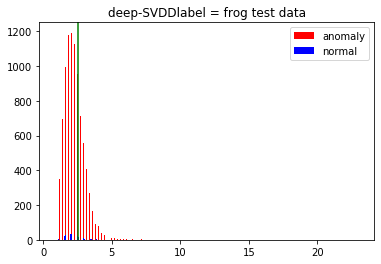

test label = frog uncertain_img


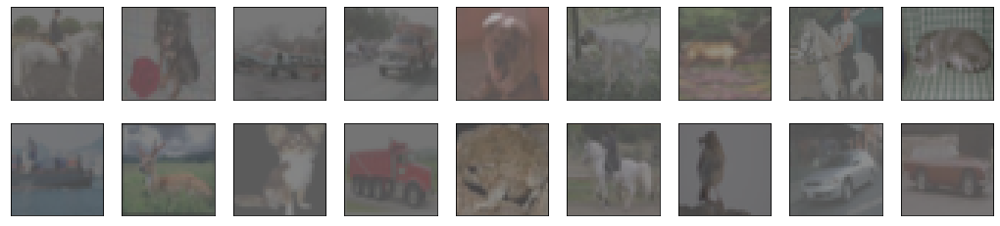

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


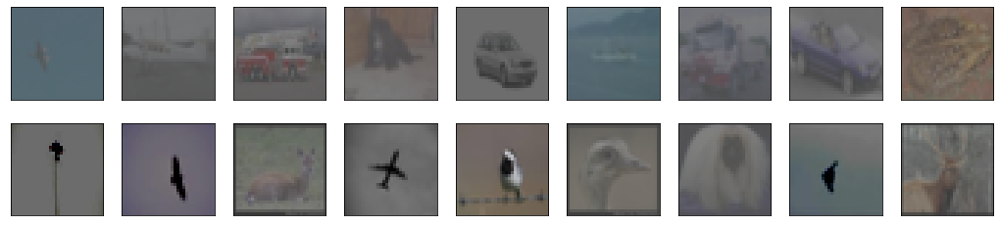

test label = frog false_img


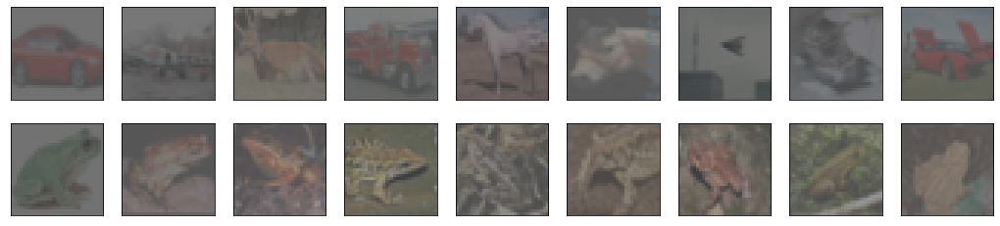

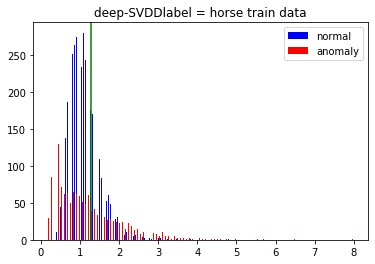

 train label = horse uncertain_img


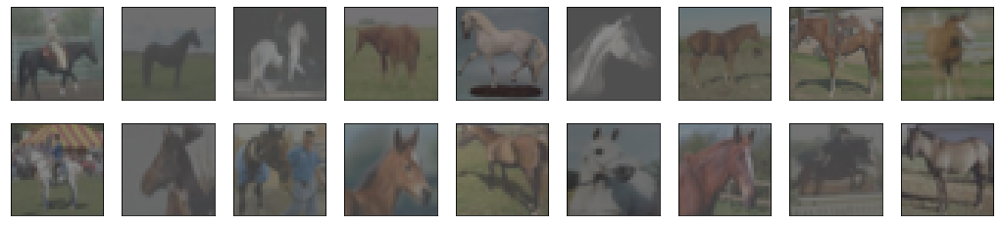

train label = horse distance oder


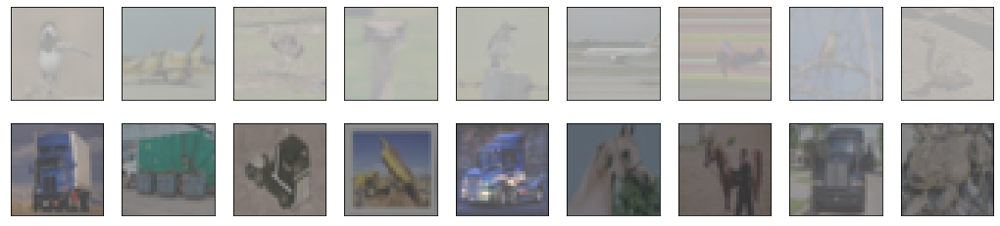

train label = horse false_img


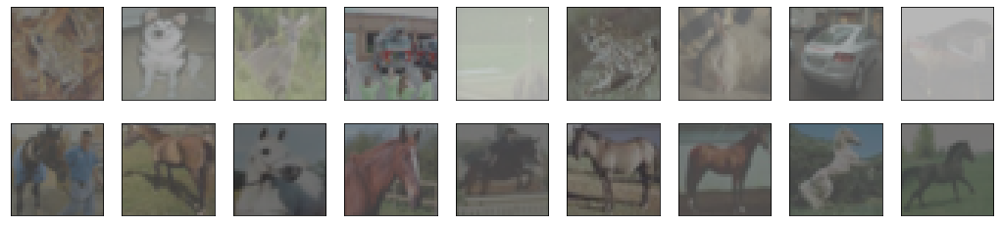

AUC: 0.6564581111111112
confusion_matrix:
[[4833 4167]
 [ 308  692]]


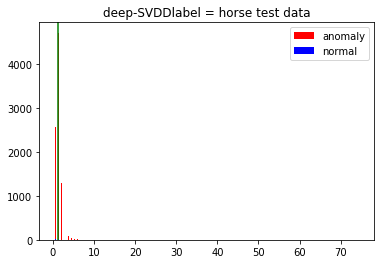

test label = horse uncertain_img


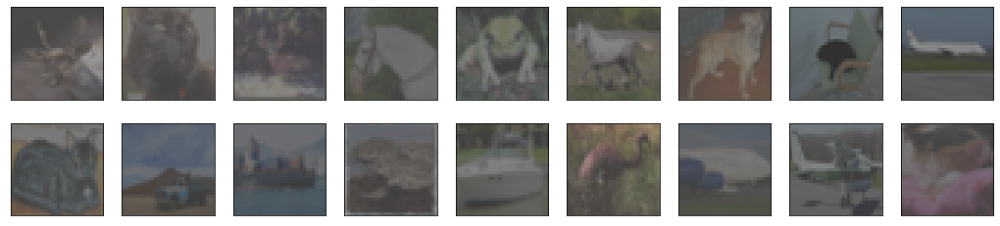

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


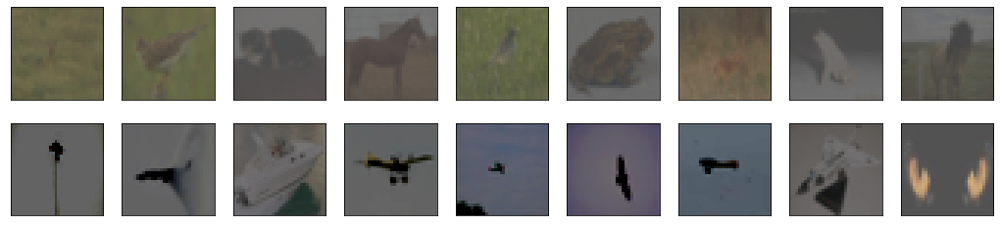

test label = horse false_img


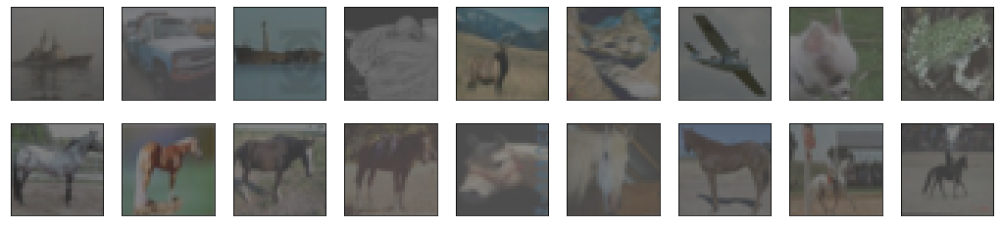

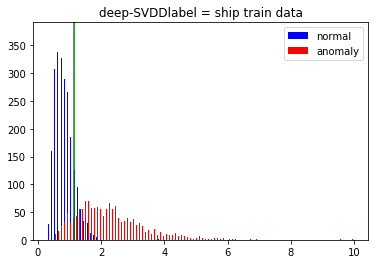

 train label = ship uncertain_img


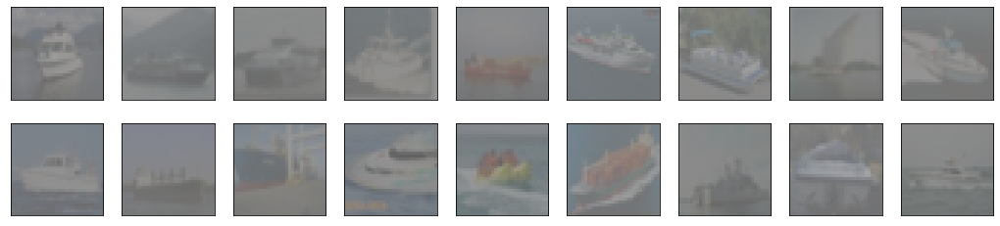

train label = ship distance oder


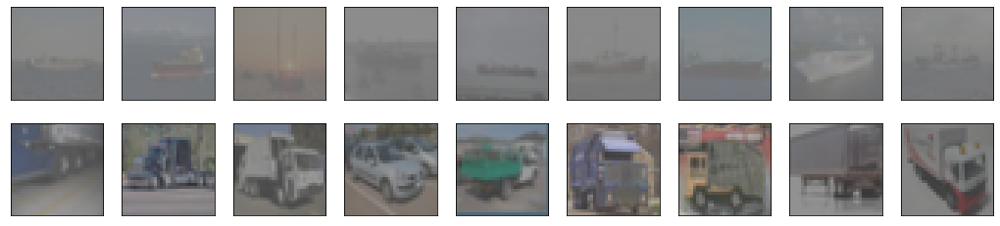

train label = ship false_img


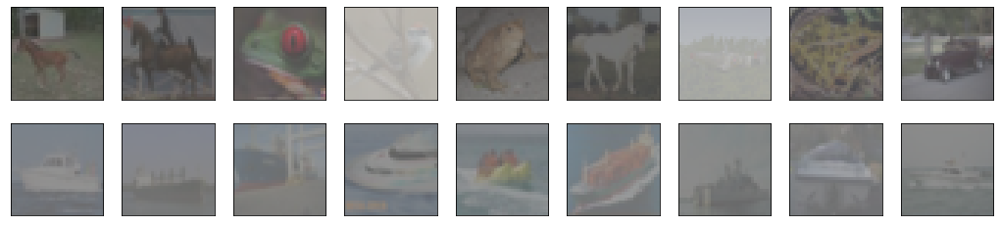

AUC: 0.7163478333333334
confusion_matrix:
[[3144 5856]
 [ 125  875]]


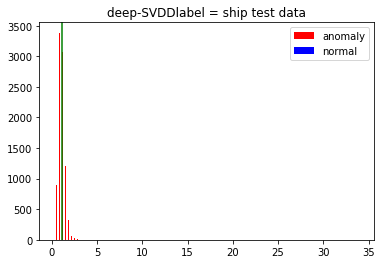

test label = ship uncertain_img


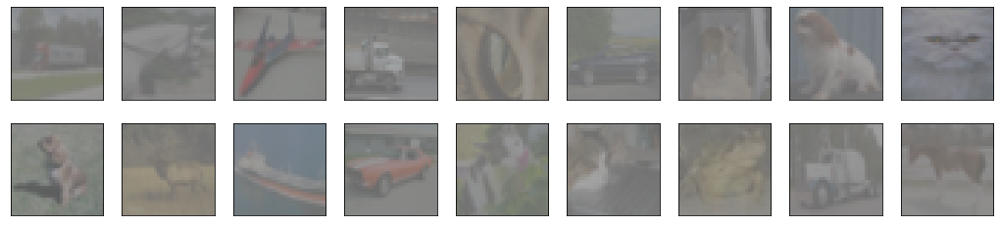

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


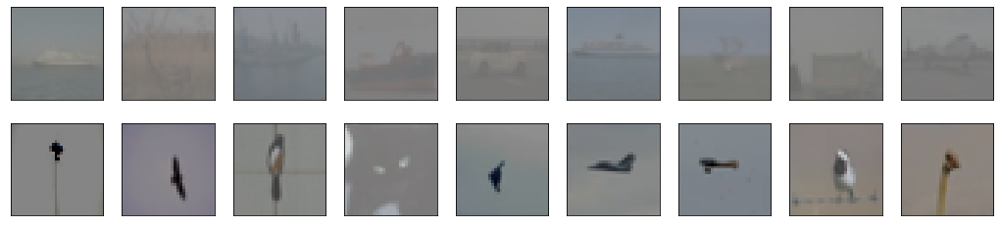

test label = ship false_img


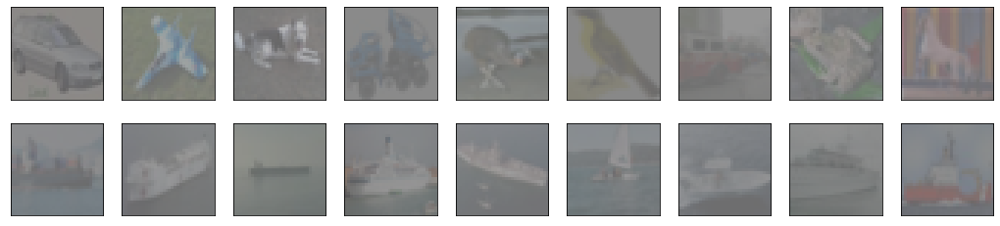

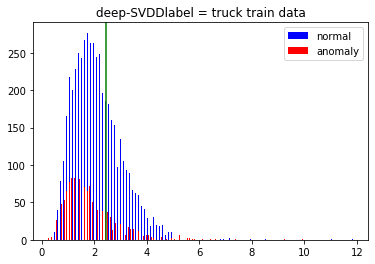

 train label = truck uncertain_img


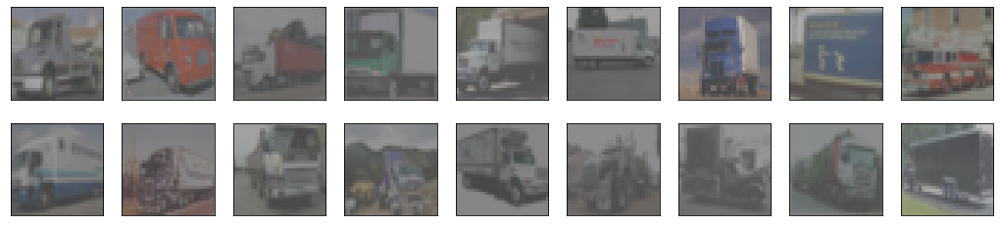

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = truck distance oder


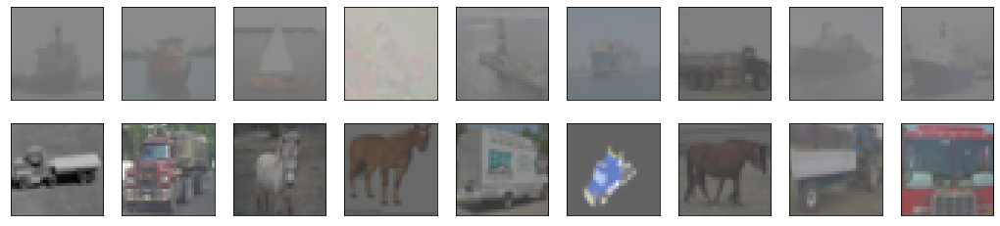

train label = truck false_img


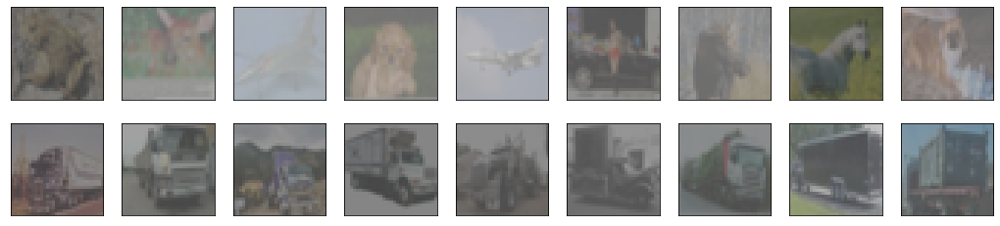

AUC: 0.6715883888888889
confusion_matrix:
[[5315 3685]
 [ 349  651]]


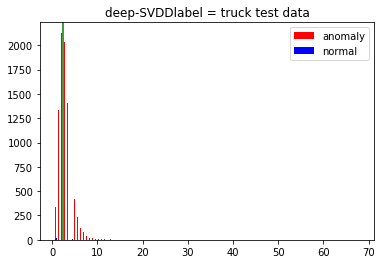

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck uncertain_img


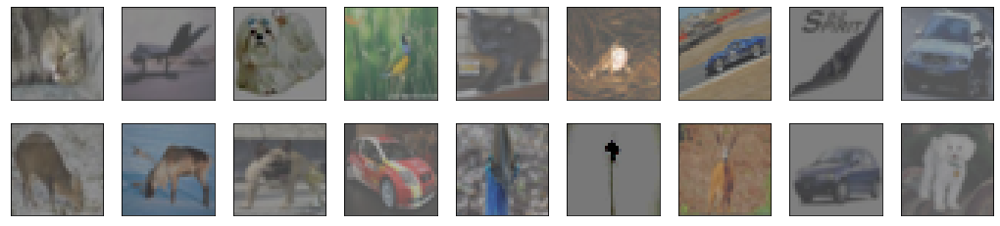

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


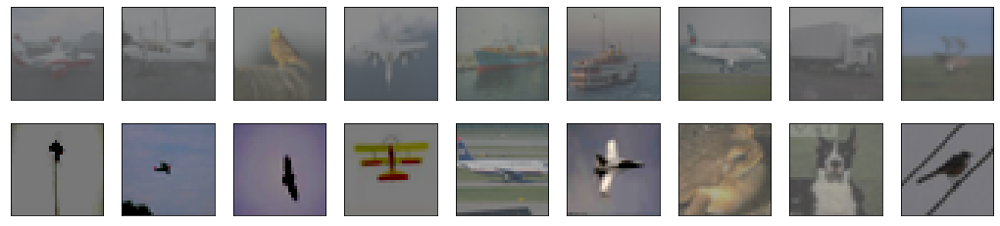

test label = truck false_img


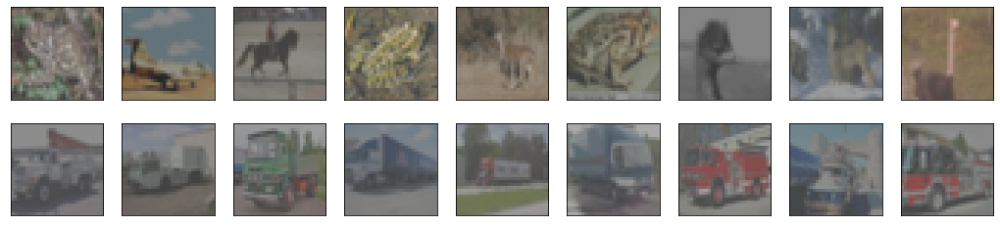

In [39]:
objective = 'deep-SVDD'
i = 0
nu = 0.3
outlier_nu = 0.3

for label_num in np.arange(10):
    ## 資料設定
    train_dataset, x_train, x_test, y_train, y_test = load_data(label_num, batch_size = 200,
                                                                outlier_nu = outlier_nu)
    
    ## 訓練 autoencoder
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    ## 訓練 SVDD
    SVDD = train_SVDD(nu = nu, train_dataset = train_dataset, label_num = label_num , objective = objective, encoder = encoder)
    radius_end =SVDD.train_result(x_train, y_train, show_img = True, load_model = True)
    test_auc, confusionmatrix  = SVDD.test(x_test, y_test, radius_end, show_img = True, load_model = True)

    i += 1